In [ ]:
# SNIPPET 1: Preprocessing + Feature Extraction + Dataset Loading (UPDATED with FIXES)
# ------------------------------
import os
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
from scipy.signal import butter, filtfilt, savgol_filter, welch
from scipy.fft import fft, fftfreq
from scipy.signal import find_peaks
from scipy.stats import entropy as scipy_entropy

# --- SKLEARN IMPORTS ---
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

# --- BOOSTING IMPORTS (try/except retained) ---
try:
    import xgboost as xgb
    XGB_AVAILABLE = True
except:
    XGB_AVAILABLE = False

try:
    import lightgbm as lgb
    LGB_AVAILABLE = True
except:
    LGB_AVAILABLE = False

try:
    from catboost import CatBoostClassifier
    CAT_AVAILABLE = True
except:
    CAT_AVAILABLE = False

try:
    import shap
    SHAP_AVAILABLE = True
except:
    SHAP_AVAILABLE = False

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# 2) User paths
CSV_BASE = "/content/drive/MyDrive/PERG_dataset/csv"
META_PATH = "/content/drive/MyDrive/PERG_dataset/csv/participants_info.csv"

# 3) 5-class label mapping (Maintained)
def categorize_5class(d):
    if pd.isna(d): return None
    ds = str(d).lower()
    if "normal" in ds: return 0
    retinal_kw = ["retinitis pigmentosa", "retinitis", "rp", "usher", "stargardt", "fundus flavimaculatus", "macular dystrophy", "maculopathy", "dystrophy", "vitelliform", "drusen", "cone-rod", "rod-cone", "achromatopsia", "photoreceptor", "retinoschisis", "bietti", "pseudovitelliform", "foveal hypoplasia", "dominant drusen", "sorsby"]
    if any(k in ds for k in retinal_kw): return 1
    optic_kw = ["optic", "atrophy", "neuropathy", "neuritis", "naion", "nonarteritic", "retrobulbar", "traumatic optic", "toxic optic", "ischemic optic", "optic nerve atrophy", "optic neuropathy", "infectious neuritis"]
    if any(k in ds for k in optic_kw): return 2
    infl_kw = ["inflammatory", "autoimmune", "birdshot", "uveitis", "chorioretinopathy", "infection", "cns infection", "sarcoidosis", "toxicity", "chloroquine", "retinal toxicity", "macula toxicity"]
    if any(k in ds for k in infl_kw): return 3
    return 4

CLASS_NAMES_5 = ["Normal", "Retinal Deg", "Optic Nerve", "Inflammatory/Systemic", "Others"]

# ------------------------------
# Signal preprocessing helpers (UPDATED)
# ------------------------------

# ---------------------------------------------------------
# FIX: increased bandpass upper cutoff to 100 Hz (transient PERG)
# ---------------------------------------------------------
def butter_bandpass_filter(signal, low=1, high=100, fs=1700, order=4):
    nyq = fs/2.0
    b, a = butter(order, [low/nyq, high/nyq], btype='band')
    return filtfilt(b, a, signal)

# -------------------------------------------
# ADD: 50 Hz Notch Filter (to remove mains noise)
# -------------------------------------------
def notch_filter(signal, fs=1700, freq=50, Q=30):
    # simple bandstop around mains frequency
    w0 = freq / (fs/2)
    # create narrow bandstop; ensure bounds within (0,1)
    low = max(1e-6, w0 - w0 / Q)
    high = min(0.999999, w0 + w0 / Q)
    b, a = butter(2, [low, high], btype='bandstop')
    return filtfilt(b, a, signal)

def hampel_filter(signal, window_len=7, nsig=3):
    arr = np.asarray(signal, dtype=float)
    n = len(arr)
    out = arr.copy()
    k = window_len // 2
    for i in range(k, n-k):
        window = arr[i-k:i+k+1]
        med = np.median(window)
        mad = np.median(np.abs(window - med))
        if mad == 0: continue
        threshold = nsig * 1.4826 * mad
        if abs(arr[i] - med) > threshold:
            out[i] = med
    return out

# ---------------------------------------------------------
# FIX: remove Savitzky–Golay smoothing, remove internal z-scaling;
#       apply bandpass (up to 100Hz) + notch + hampel only
# ---------------------------------------------------------
def preprocess_signal(signal, fs=1700):
    s = np.asarray(signal, dtype=float)
    if s.size == 0 or len(s) < 21:
        return np.array([]) # Min length check

    s = np.nan_to_num(s, nan=0.0, posinf=0.0, neginf=0.0)

    # FIX: transient PERG needs frequencies up to 100 Hz
    s = butter_bandpass_filter(s, low=1, high=100, fs=fs, order=4)

    # FIX: remove mains 50Hz noise
    s = notch_filter(s, fs=fs, freq=50, Q=30)

    s = hampel_filter(s, window_len=7, nsig=3)

    # FIX: Removed Savitzky–Golay smoothing (destroys transient waveform)
    # (s = savgol_filter(s, 21, 3))  # REMOVED

    # FIX: Removed internal z-scaling; StandardScaler will be applied later
    # denom = (np.std(s) + 1e-9)
    # s = (s - np.mean(s)) / denom  # REMOVED

    return s

# ------------------------------
# Feature engineering (Improved Peak/Feature Extraction) — UPDATED
# ------------------------------
def band_energies(sig, fs=1700):
    # Update bands to cover up to 100 Hz (transient PERG useful up to ~100 Hz)
    f, Pxx = welch(sig, fs=fs, nperseg=min(512, len(sig)))
    bands = {
        'delta': [1, 4],
        'theta': [4, 8],
        'alpha': [8, 13],
        'beta': [13, 30],
        'gamma': [30, 100]  # FIX: extend gamma to 100 Hz
    }
    energies = {k: Pxx[(f >= v[0]) & (f < v[1])].sum() for k, v in bands.items()}
    total = sum(energies.values()) + 1e-9
    return {
        "b1": energies['delta']+energies['theta'], "b2": energies['alpha']+energies['beta'], "b3": energies['gamma'],
        "b1_norm": (energies['delta']+energies['theta'])/total,
        "b2_norm": (energies['alpha']+energies['beta'])/total,
        "b3_norm": energies['gamma']/total,
        "spectral_power_delta": energies['delta'],
        "spectral_power_theta": energies['theta'],
        "spectral_power_alpha": energies['alpha'],
        "spectral_power_beta": energies['beta'],
        "spectral_power_gamma": energies['gamma'],
    }

def robust_peaks(sig, fs=1700):
    L = len(sig)
    # FIX: adaptive/dynamic windows (slightly wider to account for latency shifts)
    p50_start = int(0.035 * fs)
    p50_end = min(int(0.075 * fs), L-1)
    n95_start = int(0.080 * fs)
    n95_end = min(int(0.130 * fs), L-1)

    p50_idx = 0
    n95_idx = 0

    baseline_end = min(int(0.040 * fs), L)
    # FIX: use median baseline (more robust to spikes)
    baseline_amp = np.median(sig[:baseline_end]) if baseline_end > 0 else 0
    sig_corr = sig - baseline_amp

    if p50_end > p50_start:
        window = sig_corr[p50_start:p50_end+1]
        if window.size > 0:
            p50_idx = p50_start + np.argmax(window)

    if n95_end > n95_start:
        window2 = sig_corr[n95_start:n95_end+1]
        if window2.size > 0:
            n95_idx = n95_start + np.argmin(window2)

    p50_amp = sig_corr[p50_idx] if L > 0 and p50_idx > 0 else 0.0
    n95_amp = sig_corr[n95_idx] if L > 0 and n95_idx > 0 else 0.0

    return {
        "p50_amp": float(p50_amp),
        "n95_amp": float(n95_amp),
        "p50_latency": float(p50_idx * (1000.0 / fs)),
        "n95_latency": float(n95_idx * (1000.0 / fs)),
    }

def extract_41_features(signal, fs=1700):
    s = preprocess_signal(signal, fs=fs)
    if s.size == 0: return None
    L = len(s)
    feats = {}

    # 1. TIME domain basics (7)
    feats["mean"] = float(np.mean(s))
    feats["std"] = float(np.std(s))
    feats["rms"] = float(np.sqrt(np.mean(s**2)))
    feats["energy"] = float(np.sum(s**2))
    feats["variance"] = float(np.var(s))
    feats["skewness"] = float(pd.Series(s).skew())
    feats["kurtosis"] = float(pd.Series(s).kurt())

    # 2. Peak Analysis (6)
    # FIX: Use preprocessed signal for peak extraction (transient PERG requirement)
    peak_feats = robust_peaks(s, fs=fs)
    feats.update(peak_feats)

    p50_amp = feats.get("p50_amp", 0.0)
    n95_amp = feats.get("n95_amp", 0.0)

    feats["ratio"] = float(abs(n95_amp) / (abs(p50_amp) + 1e-9))
    feats["peak_to_peak"] = float(p50_amp - n95_amp)

    # 3. Waveform characteristics (5)
    p50_lat = feats.get("p50_latency", 0.0)
    feats["rise_time"] = p50_lat
    feats["fall_time"] = float((L * (1000.0 / fs)) - p50_lat)
    feats["zero_crossing_rate"] = float(np.sum(np.diff(np.sign(s)) != 0) / (L + 1e-9))
    feats["auc"] = float(np.abs(np.trapz(s)))

    # Time-derivative features (speed of waveform changes)
    first_deriv = np.diff(s) if L>1 else np.array([0.0])
    second_deriv = np.diff(first_deriv) if first_deriv.size>1 else np.array([0.0])
    mobility = float(np.sqrt(np.mean(first_deriv**2)) / (np.std(s)+1e-9))
    complexity = float((np.sqrt(np.mean(second_deriv**2)) / (np.std(first_deriv)+1e-9)) / (mobility+1e-9))
    feats["hjorth_mobility"] = mobility
    feats["hjorth_complexity"] = complexity

    # Additional envelope/slope stats (NEW)
    feats["slope_mean"] = float(np.mean(np.abs(first_deriv)))
    feats["slope_max"] = float(np.max(np.abs(first_deriv)) if first_deriv.size>0 else 0.0)
    feats["slope_var"] = float(np.var(first_deriv))

    # 4. FREQUENCY domain (13)
    fft_vals = np.abs(fft(s))
    freqs = fftfreq(len(s), 1.0/fs)
    pos_freqs = freqs[:len(s)//2]
    mag = fft_vals[:len(s)//2]
    # FIX: extend fft_energy range to cover higher frequencies up to ~200 bins safely
    max_index = min(len(mag)-1, 200)
    feats["fft_energy"] = float(np.sum(mag[1:max_index]) if len(mag)>1 else 0.0)

    be = band_energies(s, fs=fs)
    feats.update(be)

    total_power = float(np.sum(mag)+1e-9)
    if len(mag)>0:
        dom_idx = int(np.argmax(mag))
        feats["dominant_frequency"] = float(pos_freqs[dom_idx])
        feats["spectral_entropy"] = float(scipy_entropy(mag + 1e-10))
        feats["spectral_centroid"] = float(np.sum(pos_freqs * mag)/total_power)
    else:
        feats["dominant_frequency"] = feats["spectral_entropy"] = feats["spectral_centroid"] = 0.0

    # High/Low freq ratio (NEW biomarker)
    hf_power = feats.get("spectral_power_beta", 0.0) + feats.get("spectral_power_gamma", 0.0)
    lf_power = feats.get("spectral_power_delta", 0.0) + feats.get("spectral_power_theta", 0.0)
    feats["hf_lf_ratio"] = float(hf_power / (lf_power + 1e-9))

    # 5. Morphological derivatives (7)
    feats["mean_slope"] = float(np.mean(np.abs(first_deriv)))
    feats["max_slope"] = float(np.max(np.abs(first_deriv)) if first_deriv.size>0 else 0.0)
    feats["slope_std"] = float(np.std(first_deriv))
    curvature = np.diff(first_deriv) if first_deriv.size>1 else np.array([0.0])
    feats["mean_curvature"] = float(np.mean(curvature)) if curvature.size>0 else 0.0
    feats["max_curvature"] = float(np.max(np.abs(curvature))) if curvature.size>0 else 0.0
    feats["waveform_asymmetry"] = float((np.sum(s[s>0]) - np.sum(s[s<0])) / (np.sum(np.abs(s))+1e-9))
    feats["signal_min"] = float(np.min(s))
    feats["signal_max"] = float(np.max(s))

    # -------------------------------------------
    # ADD: Signal Quality Index (SQI) (NEW)
    # -------------------------------------------
    # baseline noise estimated from first 100 samples (if available)
    baseline_len = min(100, L)
    noise_floor = float(np.std(s[:baseline_len])) if baseline_len > 0 else 1e-9
    peak_amp = max(abs(feats.get("p50_amp", 0.0)), abs(feats.get("n95_amp", 0.0)))
    feats["signal_quality_index"] = float(peak_amp / (noise_floor + 1e-9))

    return feats

# List of all 41 signal features (used for consistent naming)
# NOTE: we've added some extra features (slope_mean, slope_max, slope_var, hf_lf_ratio, signal_quality_index)
SIGNAL_FEATURE_COLS = [
    "mean", "std", "rms", "energy", "skewness", "kurtosis", "variance",
    "p50_amp", "n95_amp", "p50_latency", "n95_latency", "ratio", "peak_to_peak",
    "rise_time", "fall_time", "zero_crossing_rate", "auc", "hjorth_mobility", "hjorth_complexity",
    "fft_energy", "b1", "b2", "b3", "b1_norm", "b2_norm", "b3_norm",
    "spectral_power_delta", "spectral_power_theta", "spectral_power_alpha", "spectral_power_beta", "spectral_power_gamma",
    "dominant_frequency", "spectral_entropy", "spectral_centroid",
    "mean_slope", "max_slope", "slope_std", "mean_curvature", "max_curvature",
    "waveform_asymmetry", "signal_min", "signal_max",
    # additional biomarkers
    "slope_mean", "slope_max", "slope_var", "hf_lf_ratio", "signal_quality_index"
]

# ------------------------------
# 6) Read metadata and create labels (unchanged)
# ------------------------------
print("\nLoading metadata and mapping labels...")
meta = pd.read_csv(META_PATH)
meta["d1_m5"] = meta["diagnosis1"].apply(categorize_5class)
meta["d2_m5"] = meta["diagnosis2"].apply(categorize_5class)
meta["d3_m5"] = meta["diagnosis3"].apply(categorize_5class)
meta["label"] = meta[["d1_m5","d2_m5","d3_m5"]].bfill(axis=1).iloc[:,0]
meta = meta[meta["label"].notna()].copy()
meta["label"] = meta["label"].astype(int)
print("Class distribution (raw):")
print(meta["label"].value_counts().sort_index())

# 7) Build features DataFrame (RE & LE Averaging/Concatenation)
print("\nExtracting features from signal CSV files (RE/LE averaging and concatenation)...")
rows = []
missing_count = 0

for i, row in meta.iterrows():
    rid = int(row["id_record"])
    path = os.path.join(CSV_BASE, f"{rid:04d}.csv")
    if not os.path.exists(path):
        missing_count += 1
        continue

    try:
        sigdf = pd.read_csv(path)
    except:
        missing_count += 1
        continue

    # 1. Average multiple RE/LE recordings
    re_cols = [c for c in sigdf.columns if c.startswith("RE_") and sigdf[c].notna().any()]
    le_cols = [c for c in sigdf.columns if c.startswith("LE_") and sigdf[c].notna().any()]

    re_sig = sigdf[re_cols].mean(axis=1).values if len(re_cols) > 0 else None
    le_sig = sigdf[le_cols].mean(axis=1).values if len(le_cols) > 0 else None

    # 2. Extract features for each eye (uses updated extract_41_features which works on preprocessed s)
    re_feats = extract_41_features(re_sig)
    le_feats = extract_41_features(le_sig)

    # Skip if neither eye yields valid features
    if re_feats is None and le_feats is None: continue

    combined = {}

    # Concatenate features from both eyes, filling missing with 0s
    for k in SIGNAL_FEATURE_COLS:
        # RE features
        combined[f"re_{k}"] = re_feats.get(k, 0.0) if re_feats is not None else 0.0
        # LE features
        combined[f"le_{k}"] = le_feats.get(k, 0.0) if le_feats is not None else 0.0

    # 3. Add demographics and label
    combined["age"] = float(row.get("age_years", np.nan))
    combined["sex"] = 1 if str(row.get("sex","ankylo")).lower().startswith("m") else 0
    combined["va_re"] = float(row.get("va_re_logMar", np.nan))
    combined["va_le"] = float(row.get("va_le_logMar", np.nan))
    combined["label"] = int(row["label"])

    rows.append(combined)

print(f"Extraction finished; missing files/skips: {missing_count}. Records with features: {len(rows)}")

# Build DataFrame and clean NaNs (important for demographics/VA)
df_features = pd.DataFrame(rows)
df_features = df_features.replace([np.inf, -np.inf], np.nan)
# Drop rows where any of the core demographic/clinical data is missing
df_features = df_features.dropna(subset=["label", "age", "sex", "va_re", "va_le"])

print("Final features shape:", df_features.shape)
print("Class distribution (after final cleanup):\n", df_features["label"].value_counts().sort_index())

# 8) Prepare X,y and define final feature set
X = df_features.drop(["label"], axis=1).copy()
y = df_features["label"].copy()

# Add Inter-Eye Difference and Ratio for key features (Highly informative for Optic Nerve)
# (these were present earlier; keep them and also add some extra asymmetry features)
X['p50_n95_diff'] = X['re_peak_to_peak'] - X['le_peak_to_peak']
X['p50_n95_ratio'] = X['re_peak_to_peak'] / (X['le_peak_to_peak'] + 1e-9)
X['p50_lat_diff'] = X['re_p50_latency'] - X['le_p50_latency']
X['n95_lat_diff'] = X['re_n95_latency'] - X['le_n95_latency']

# FIX / ADD: Additional asymmetry features (absolute differences)
X['p50_asymmetry'] = np.abs(X['re_p50_amp'] - X['le_p50_amp'])
X['n95_asymmetry'] = np.abs(X['re_n95_amp'] - X['le_n95_amp'])
X['p50_lat_asym']  = np.abs(X['re_p50_latency'] - X['le_p50_latency'])
X['n95_lat_asym']  = np.abs(X['re_n95_latency'] - X['le_n95_latency'])

print("Total features (including Inter-Eye & asymmetry):", X.shape[1])

# 9) Train-test split & SMOTE
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE
)

# Fill NaNs using the mean of the *training* set to prevent data leakage
X_train_filled = X_train.fillna(X_train.mean())
X_test_filled = X_test.fillna(X_train.mean()) # Use train mean for test set

print("\nBefore SMOTE train distribution:\n", y_train.value_counts())
sm = SMOTE(random_state=RANDOM_STATE, k_neighbors=3)
X_train_res, y_train_res = sm.fit_resample(X_train_filled, y_train)
print("After SMOTE train distribution:\n", pd.Series(y_train_res).value_counts())

# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_res)
X_test_scaled = scaler.transform(X_test_filled)
X_cols_final = X_train_filled.columns.tolist()

print("Prepared: X_train_scaled, X_test_scaled, y_train_res, y_test, X_cols_final are available.")
# End of updated Snippet 1.



Loading metadata and mapping labels...
Class distribution (raw):
label
0    106
1    133
2     28
3     34
4     35
Name: count, dtype: int64

Extracting features from signal CSV files (RE/LE averaging and concatenation)...
Extraction finished; missing files/skips: 0. Records with features: 336
Final features shape: (317, 99)
Class distribution (after final cleanup):
 label
0     99
1    125
2     27
3     33
4     33
Name: count, dtype: int64
Total features (including Inter-Eye & asymmetry): 106

Before SMOTE train distribution:
 label
1    100
0     79
4     26
3     26
2     22
Name: count, dtype: int64
After SMOTE train distribution:
 label
1    100
0    100
4    100
3    100
2    100
Name: count, dtype: int64
Prepared: X_train_scaled, X_test_scaled, y_train_res, y_test, X_cols_final are available.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive



RandomForest: Training with n_estimators = 50
Training time: 0.50s
Accuracy: 0.4688 | Weighted F1 (TEST DATA): 0.4689

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6522    0.6000    0.6250        25
          Optic Nerve     0.1250    0.2000    0.1538         5
Inflammatory/Systemic     0.1250    0.1429    0.1333         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.4688        64
            macro avg     0.3042    0.3186    0.3093        64
         weighted avg     0.4716    0.4688    0.4689        64


Confusion Matrix:


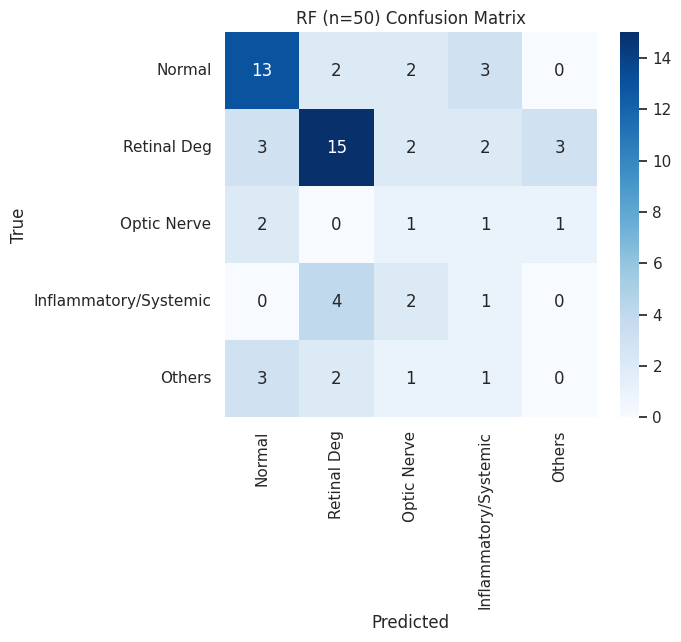


Top 20 Feature Importances:
re_b3_norm                 0.037529
va_re                      0.032467
le_b3_norm                 0.027172
va_le                      0.022479
age                        0.018196
re_b1                      0.017316
le_n95_amp                 0.016675
le_mean_slope              0.016119
le_slope_max               0.015973
re_mean_curvature          0.014936
le_signal_min              0.014441
p50_asymmetry              0.013805
re_spectral_power_theta    0.013588
re_fft_energy              0.013446
re_std                     0.013261
re_variance                0.013200
re_p50_latency             0.013137
re_rise_time               0.013012
re_signal_max              0.012920
le_slope_mean              0.012844


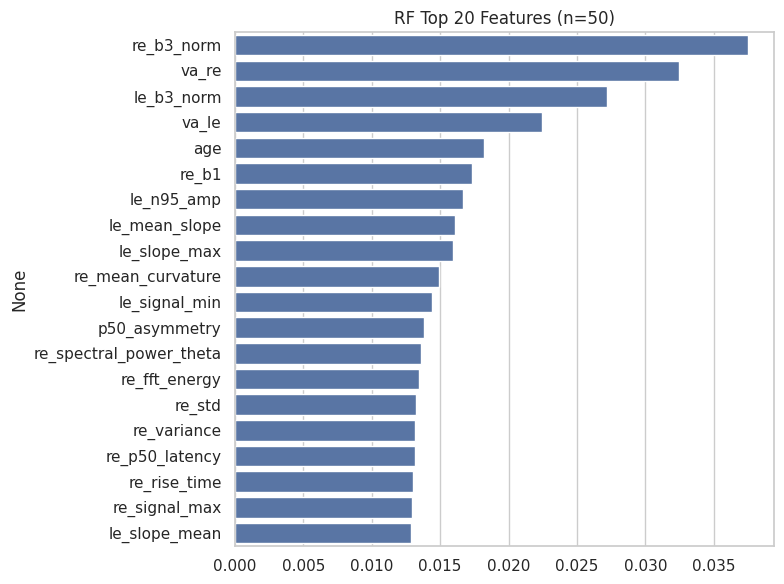


RandomForest: Training with n_estimators = 100
Training time: 1.05s
Accuracy: 0.5156 | Weighted F1 (TEST DATA): 0.5109

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6364    0.7000    0.6667        20
          Retinal Deg     0.6818    0.6000    0.6383        25
          Optic Nerve     0.2500    0.4000    0.3077         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.5156        64
            macro avg     0.3636    0.3971    0.3759        64
         weighted avg     0.5121    0.5156    0.5109        64


Confusion Matrix:


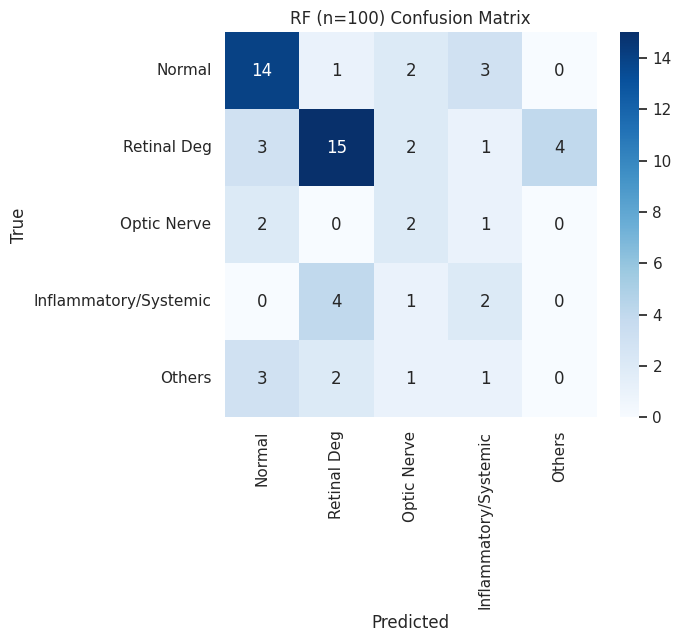


Top 20 Feature Importances:
re_b3_norm            0.032981
va_re                 0.032166
le_b3_norm            0.026970
va_le                 0.021691
age                   0.019814
re_b1                 0.016596
le_mean_slope         0.014473
re_hjorth_mobility    0.014406
p50_asymmetry         0.014196
le_n95_amp            0.013865
re_signal_max         0.013857
re_mean_curvature     0.013829
le_signal_min         0.013142
re_fall_time          0.013044
re_b2                 0.012836
re_rise_time          0.012623
le_n95_latency        0.012511
re_std                0.012463
re_p50_latency        0.012339
le_slope_max          0.012317


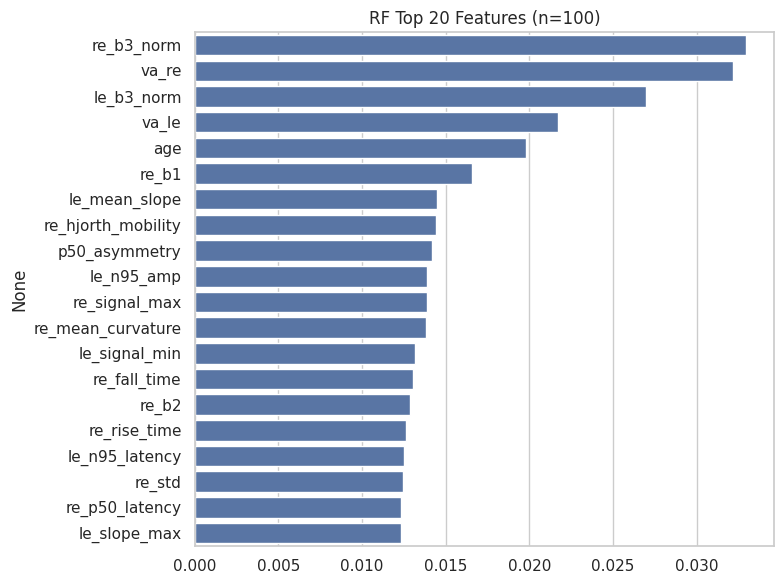


RandomForest: Training with n_estimators = 150
Training time: 1.79s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5278

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6364    0.7000    0.6667        20
          Retinal Deg     0.6957    0.6400    0.6667        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.1667    0.1429    0.1538         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.3942    0.4051    0.3909        64
         weighted avg     0.5335    0.5312    0.5278        64


Confusion Matrix:


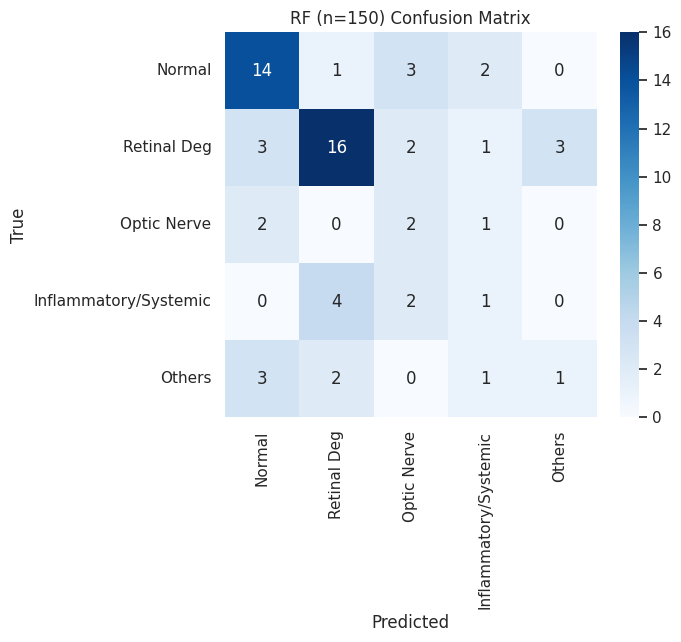


Top 20 Feature Importances:
re_b3_norm                 0.032841
va_re                      0.032057
le_b3_norm                 0.026087
va_le                      0.021449
age                        0.019497
re_b1                      0.016985
p50_asymmetry              0.015640
re_hjorth_mobility         0.014273
re_mean_curvature          0.014008
le_n95_amp                 0.013867
le_n95_latency             0.013663
le_signal_min              0.013443
re_signal_max              0.013102
re_fall_time               0.013064
re_fft_energy              0.013047
re_b2                      0.012632
re_spectral_power_theta    0.012593
le_slope_mean              0.012593
re_spectral_power_beta     0.012439
le_mean                    0.012356


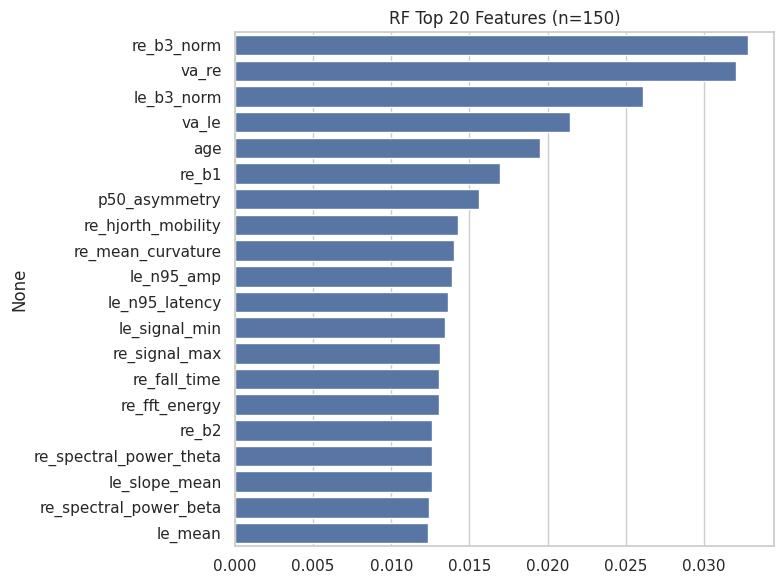


RandomForest: Training with n_estimators = 200
Training time: 1.65s
Accuracy: 0.4844 | Weighted F1 (TEST DATA): 0.4923

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6364    0.7000    0.6667        20
          Retinal Deg     0.6842    0.5200    0.5909        25
          Optic Nerve     0.1818    0.4000    0.2500         5
Inflammatory/Systemic     0.1667    0.1429    0.1538         7
               Others     0.1667    0.1429    0.1538         7

             accuracy                         0.4844        64
            macro avg     0.3671    0.3811    0.3631        64
         weighted avg     0.5168    0.4844    0.4923        64


Confusion Matrix:


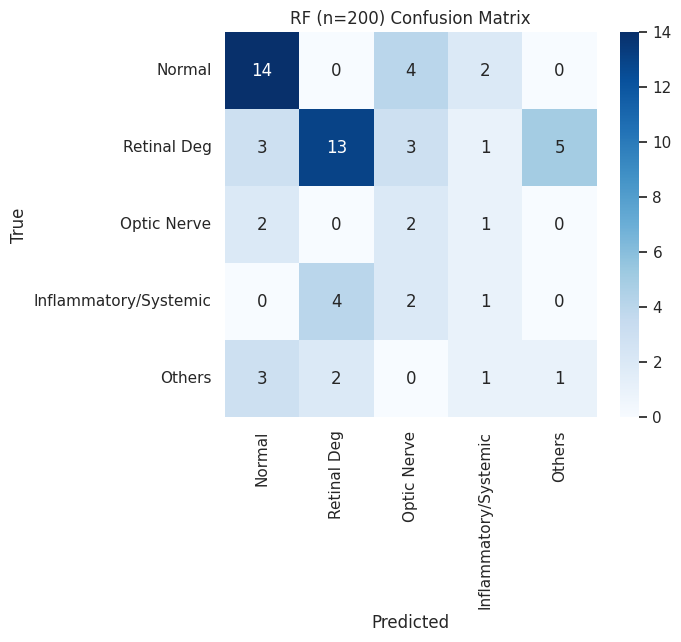


Top 20 Feature Importances:
re_b3_norm                 0.035655
va_re                      0.033666
le_b3_norm                 0.024837
va_le                      0.021279
age                        0.018805
p50_asymmetry              0.016785
re_b1                      0.015356
re_spectral_power_theta    0.014791
le_n95_amp                 0.014370
re_fft_energy              0.013922
re_hjorth_mobility         0.013846
le_signal_min              0.013709
le_n95_latency             0.013606
re_signal_max              0.013437
re_mean_curvature          0.013037
re_fall_time               0.012954
le_slope_mean              0.012825
re_b2                      0.012538
re_p50_latency             0.012460
re_rise_time               0.012432


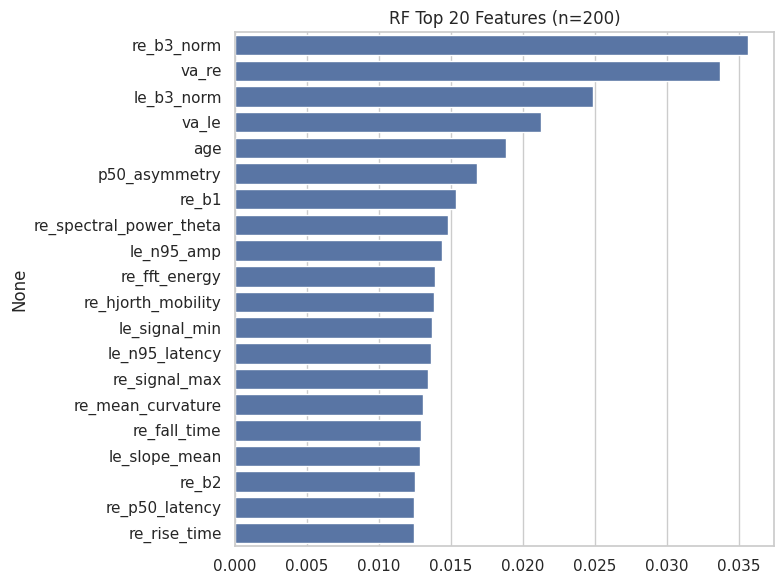


RandomForest: Training with n_estimators = 250
Training time: 2.09s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


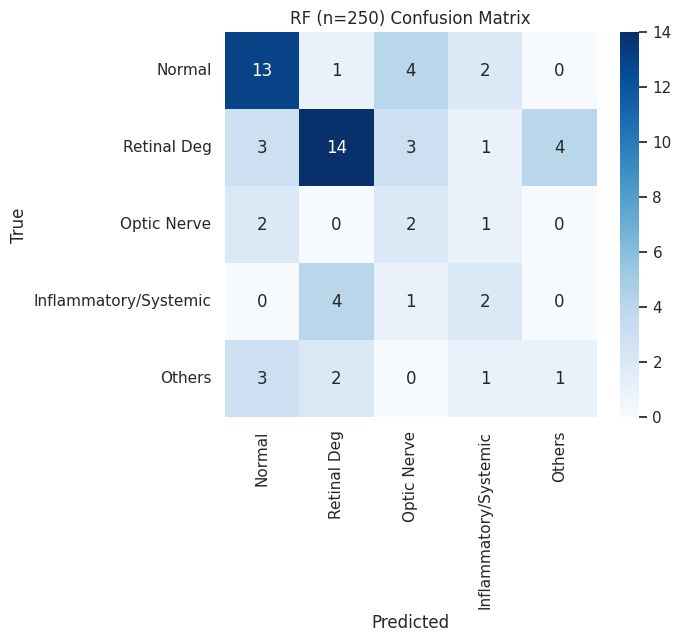


Top 20 Feature Importances:
re_b3_norm                 0.035298
va_re                      0.032901
le_b3_norm                 0.023068
va_le                      0.021829
age                        0.018897
p50_asymmetry              0.016235
re_spectral_power_theta    0.015180
re_b1                      0.015079
le_n95_amp                 0.014533
re_hjorth_mobility         0.014317
re_fft_energy              0.013585
re_p50_latency             0.013580
le_n95_latency             0.013283
re_fall_time               0.013140
re_mean_curvature          0.012988
le_mean                    0.012887
re_rise_time               0.012745
le_signal_min              0.012656
le_slope_mean              0.012466
re_signal_max              0.012352


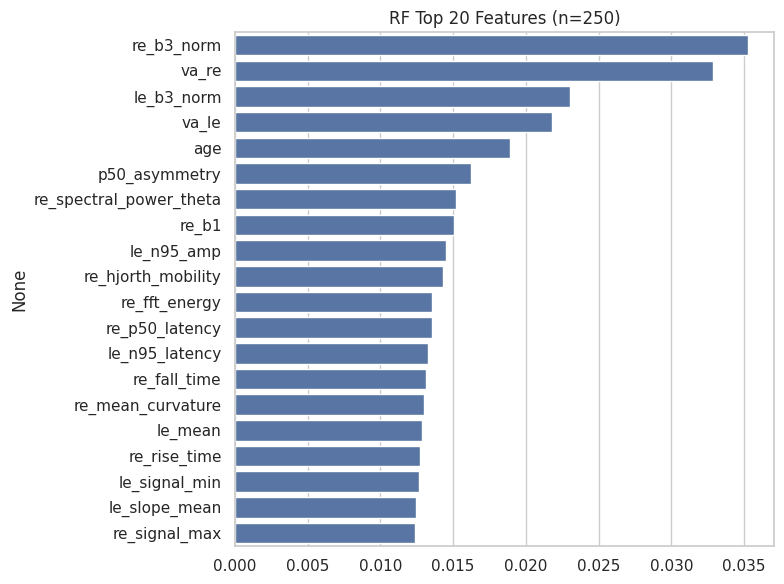


RandomForest: Training with n_estimators = 300
Training time: 2.97s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


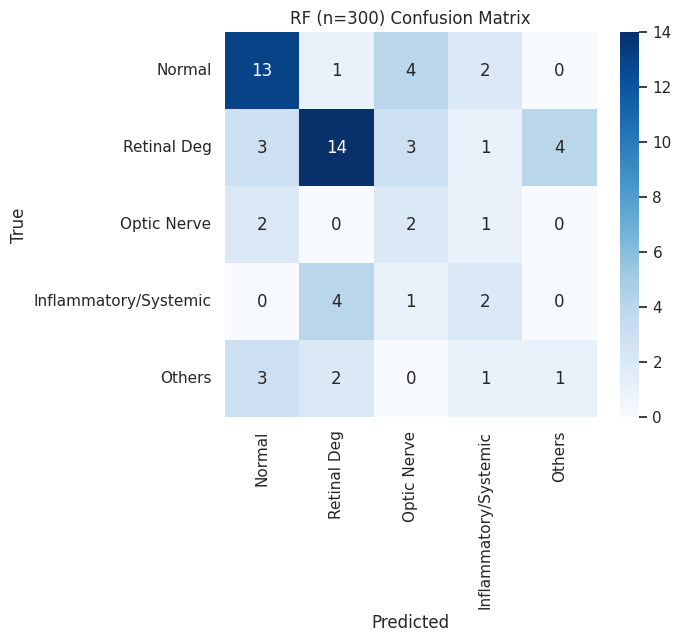


Top 20 Feature Importances:
re_b3_norm                 0.033263
va_re                      0.032597
le_b3_norm                 0.023356
va_le                      0.022278
age                        0.018501
p50_asymmetry              0.015763
re_b1                      0.015045
le_n95_amp                 0.014793
re_spectral_power_theta    0.014370
re_hjorth_mobility         0.014237
le_n95_latency             0.013852
re_mean_curvature          0.013608
re_fall_time               0.013488
re_fft_energy              0.013257
re_p50_latency             0.013090
le_signal_min              0.012856
le_mean                    0.012799
re_b2                      0.012589
re_rise_time               0.012406
re_signal_max              0.012081


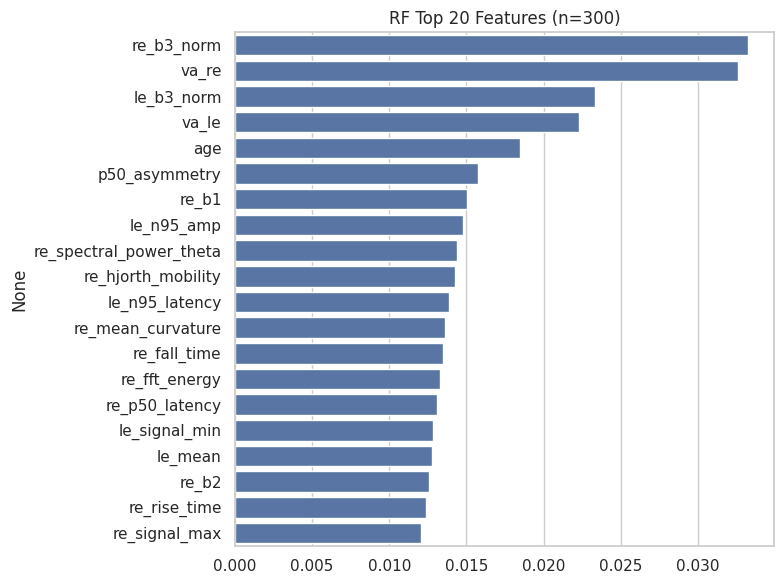


RandomForest: Training with n_estimators = 350
Training time: 4.02s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


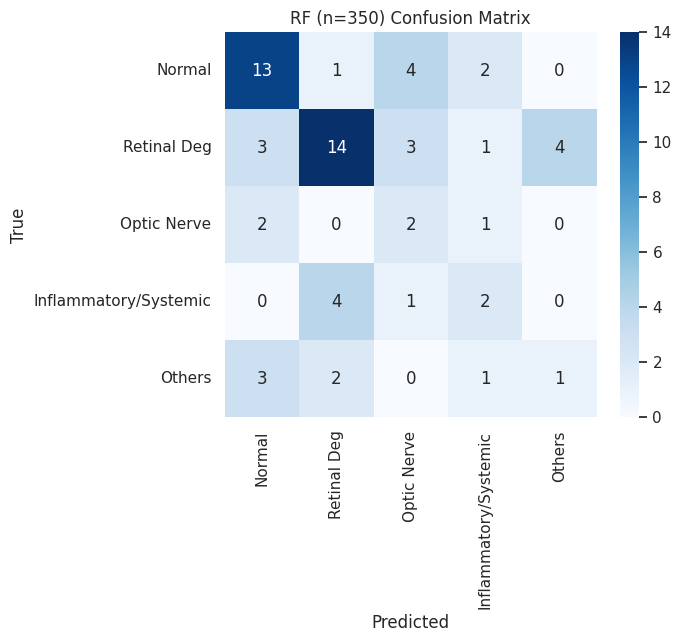


Top 20 Feature Importances:
re_b3_norm                 0.033047
va_re                      0.032363
le_b3_norm                 0.023333
va_le                      0.023270
age                        0.018966
p50_asymmetry              0.015334
re_b1                      0.015104
re_hjorth_mobility         0.014736
re_spectral_power_theta    0.014608
le_n95_amp                 0.014318
re_mean_curvature          0.013889
le_n95_latency             0.013729
re_p50_latency             0.013291
re_b2                      0.013027
re_fall_time               0.012986
le_mean                    0.012934
le_signal_min              0.012654
re_rise_time               0.012541
re_spectral_power_beta     0.012357
re_fft_energy              0.012170


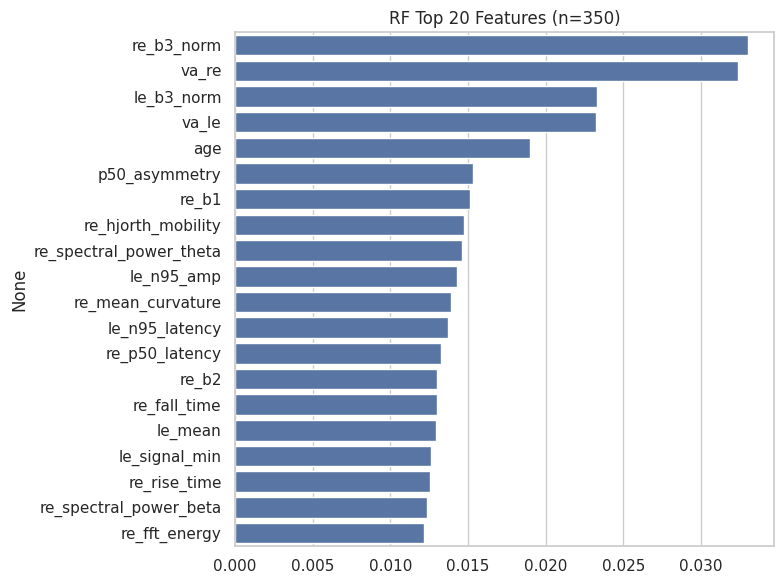


RandomForest: Training with n_estimators = 400
Training time: 1.88s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


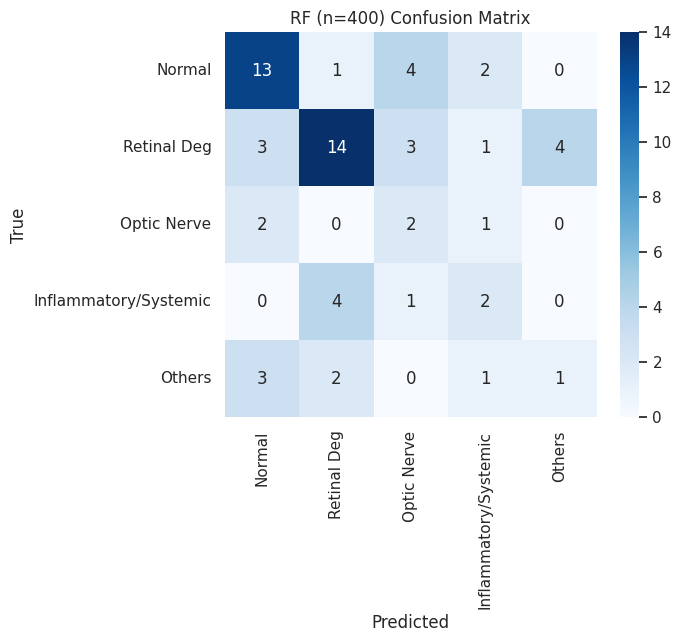


Top 20 Feature Importances:
va_re                      0.033035
re_b3_norm                 0.032973
le_b3_norm                 0.023313
va_le                      0.023025
age                        0.018296
p50_asymmetry              0.015417
re_hjorth_mobility         0.014787
re_b1                      0.014750
re_spectral_power_theta    0.014619
le_n95_amp                 0.013995
re_mean_curvature          0.013706
le_n95_latency             0.013612
re_fall_time               0.013241
re_p50_latency             0.012836
re_rise_time               0.012800
le_signal_min              0.012586
le_mean                    0.012510
re_spectral_power_beta     0.012358
re_b2                      0.012319
re_fft_energy              0.011973


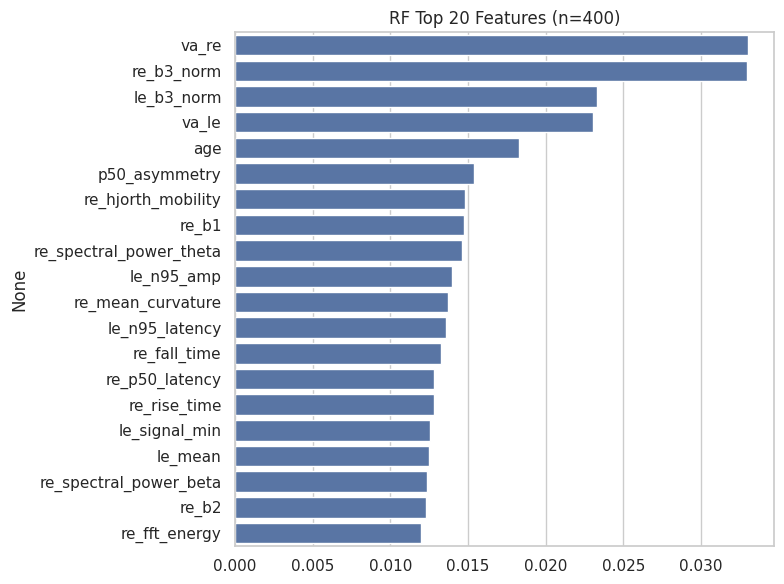


RandomForest: Training with n_estimators = 450
Training time: 2.10s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


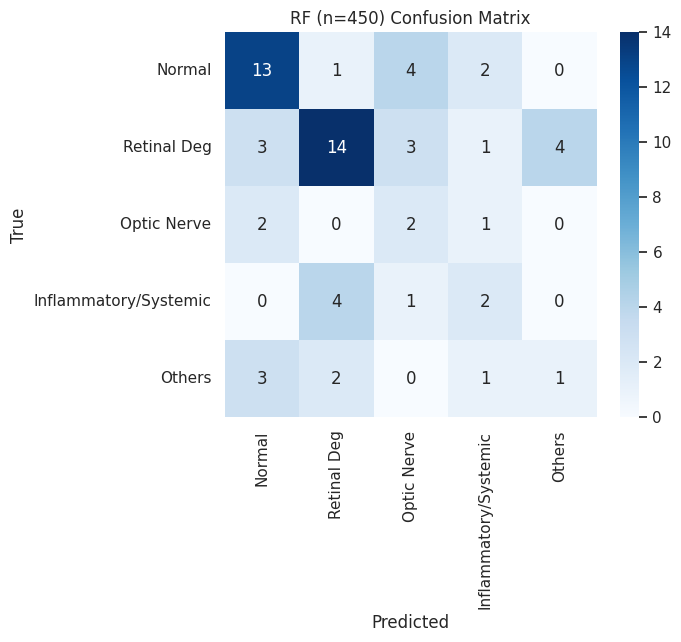


Top 20 Feature Importances:
re_b3_norm                 0.033094
va_re                      0.032592
va_le                      0.023251
le_b3_norm                 0.023179
age                        0.017931
re_spectral_power_theta    0.015455
p50_asymmetry              0.015220
re_b1                      0.014498
le_n95_amp                 0.014367
le_n95_latency             0.014362
re_hjorth_mobility         0.014112
re_mean_curvature          0.013684
re_fall_time               0.013190
re_rise_time               0.012888
le_signal_min              0.012860
re_b2                      0.012761
re_p50_latency             0.012598
le_mean                    0.012162
le_slope_mean              0.012154
re_spectral_power_beta     0.012090


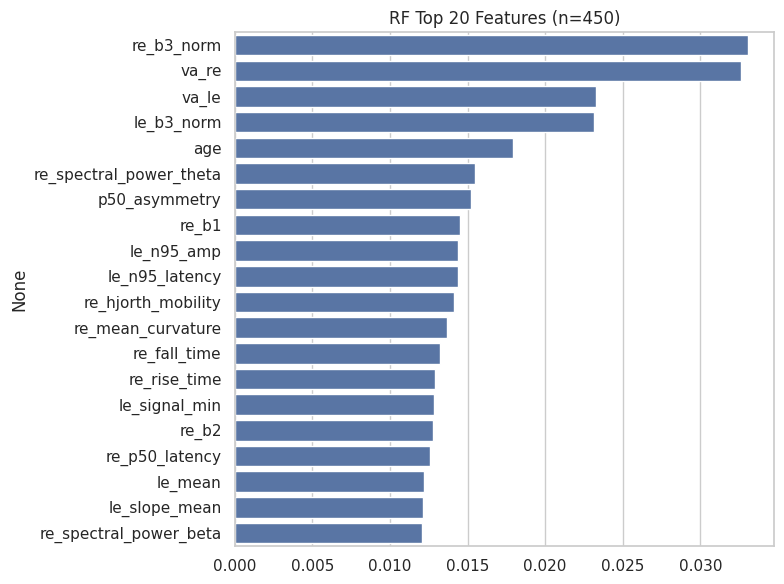


RandomForest: Training with n_estimators = 500
Training time: 2.95s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


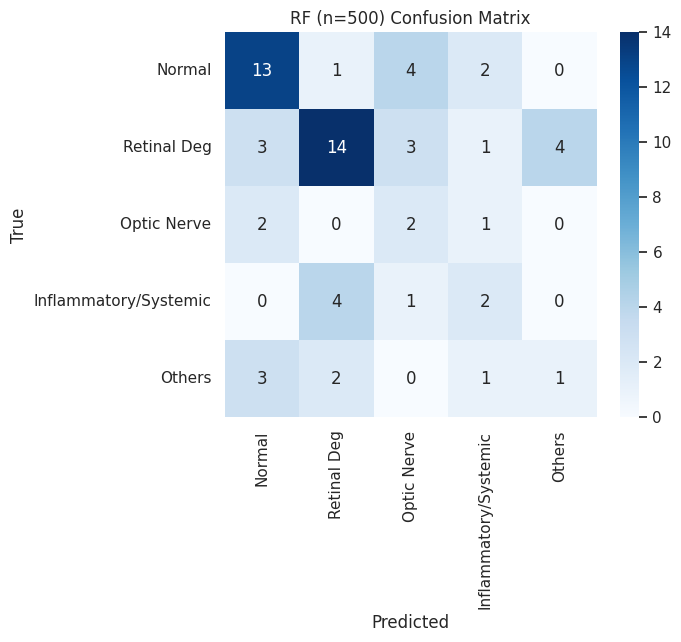


Top 20 Feature Importances:
va_re                      0.033048
re_b3_norm                 0.032208
le_b3_norm                 0.023106
va_le                      0.023086
age                        0.017494
re_spectral_power_theta    0.015444
p50_asymmetry              0.015039
le_n95_amp                 0.014636
le_n95_latency             0.014565
re_hjorth_mobility         0.014394
re_b1                      0.014214
re_mean_curvature          0.013711
re_fall_time               0.013368
re_b2                      0.012836
re_rise_time               0.012831
re_p50_latency             0.012681
le_signal_min              0.012543
re_fft_energy              0.012026
le_mean                    0.011934
re_spectral_power_beta     0.011730


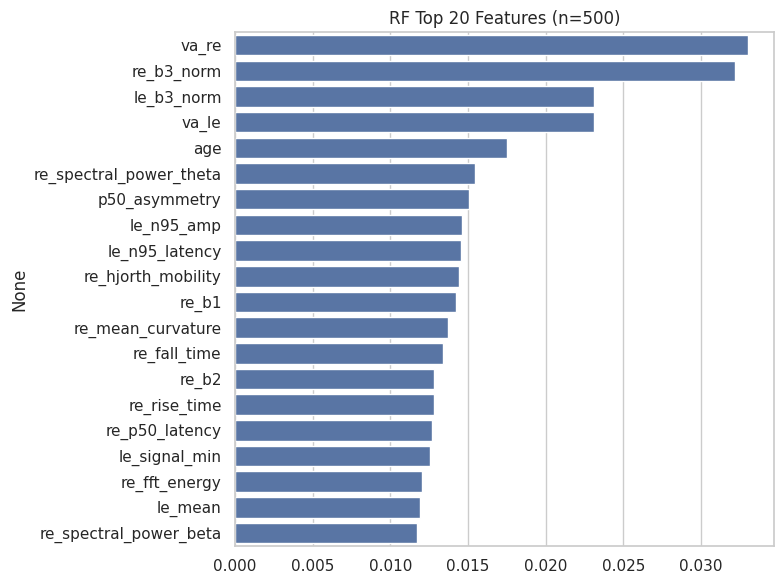


RandomForest: Training with n_estimators = 550
Training time: 3.31s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


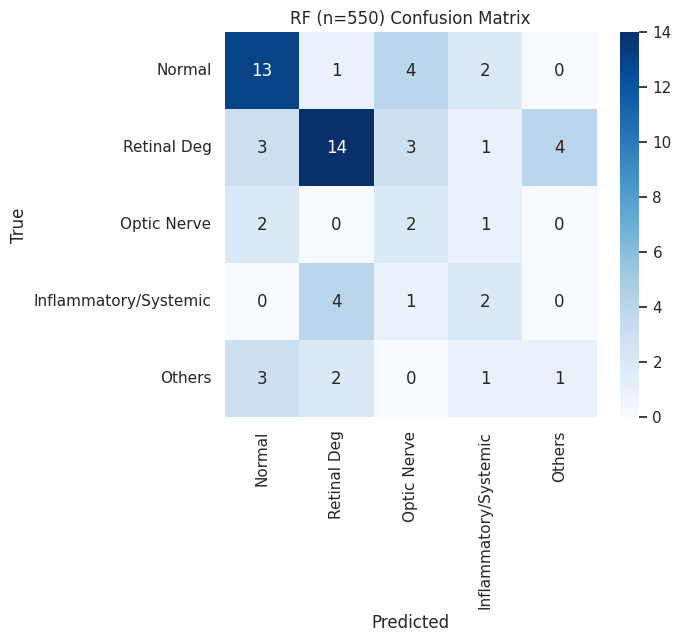


Top 20 Feature Importances:
va_re                      0.033020
re_b3_norm                 0.031905
le_b3_norm                 0.023430
va_le                      0.023087
age                        0.017444
re_spectral_power_theta    0.015035
p50_asymmetry              0.014991
le_n95_amp                 0.014770
re_b1                      0.014576
re_hjorth_mobility         0.014550
le_n95_latency             0.014461
re_mean_curvature          0.014073
re_fall_time               0.013628
re_p50_latency             0.012865
re_rise_time               0.012718
re_fft_energy              0.012217
le_signal_min              0.012213
re_b2                      0.012205
le_mean                    0.011958
re_signal_min              0.011807


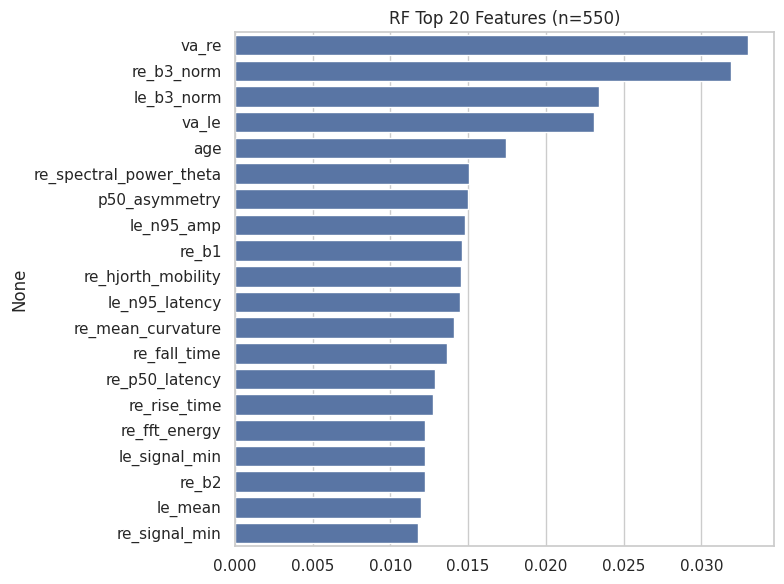


RandomForest: Training with n_estimators = 600
Training time: 2.72s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5063

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2857    0.2857    0.2857         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3943    0.4077    0.3924        64
         weighted avg     0.5226    0.5000    0.5063        64


Confusion Matrix:


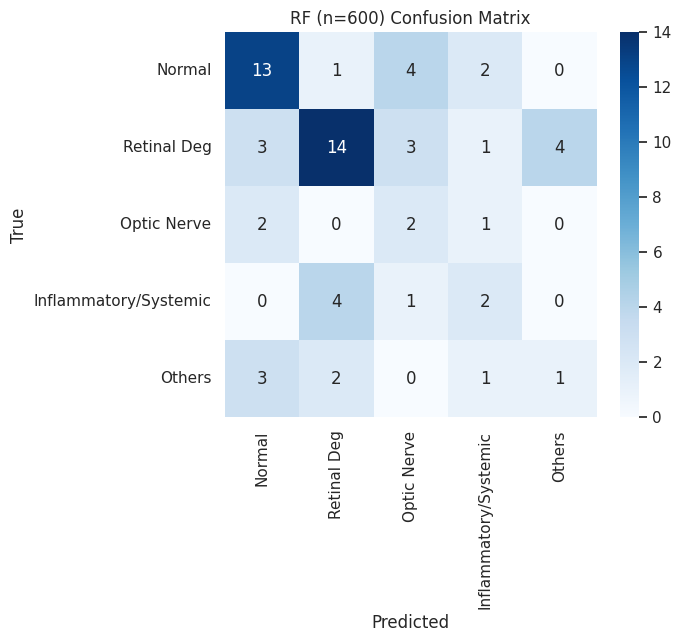


Top 20 Feature Importances:
va_re                      0.032829
re_b3_norm                 0.031990
le_b3_norm                 0.023507
va_le                      0.022706
age                        0.017286
p50_asymmetry              0.015457
re_spectral_power_theta    0.015048
re_b1                      0.014736
le_n95_latency             0.014576
le_n95_amp                 0.014373
re_hjorth_mobility         0.014350
re_mean_curvature          0.013951
re_fall_time               0.013578
re_rise_time               0.012834
re_p50_latency             0.012727
re_fft_energy              0.012616
re_b2                      0.012334
le_mean                    0.012261
re_spectral_power_beta     0.012111
le_signal_min              0.012090


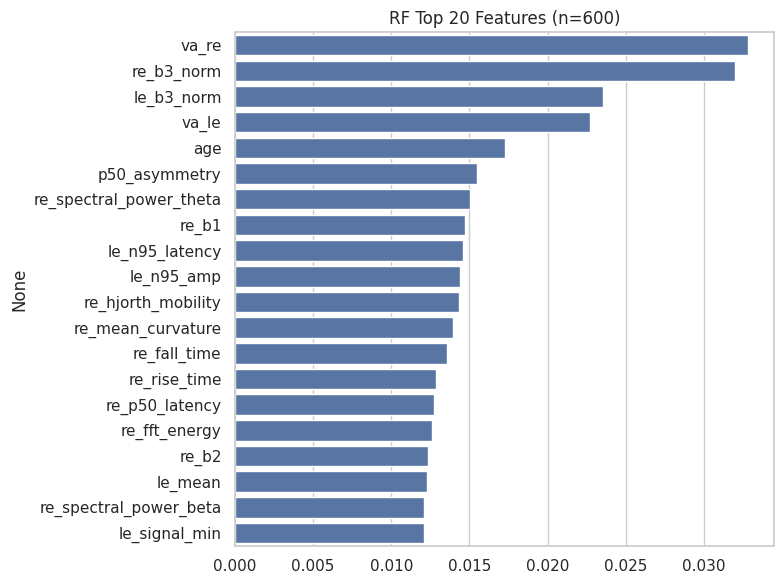


RandomForest: Training with n_estimators = 650
Training time: 3.00s
Accuracy: 0.5000 | Weighted F1 (TEST DATA): 0.5091

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.6667    0.5600    0.6087        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3933    0.4077    0.3917        64
         weighted avg     0.5284    0.5000    0.5091        64


Confusion Matrix:


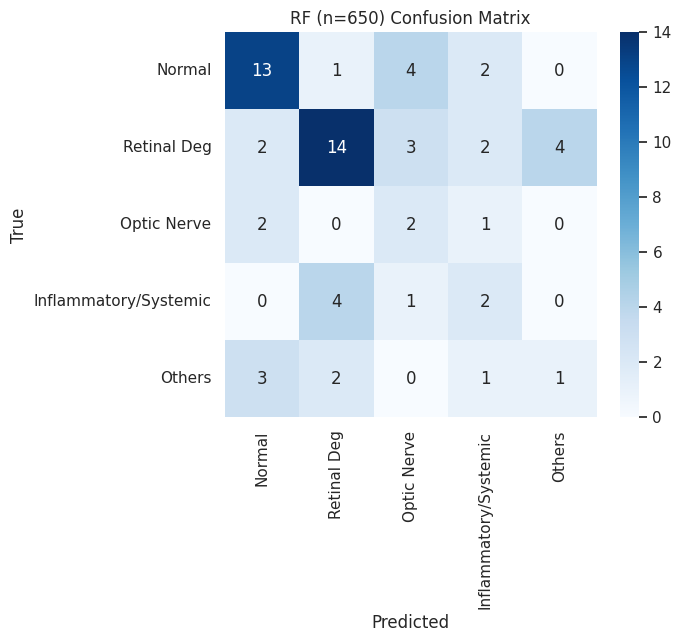


Top 20 Feature Importances:
va_re                      0.032594
re_b3_norm                 0.031983
le_b3_norm                 0.023643
va_le                      0.022693
age                        0.017071
p50_asymmetry              0.015630
le_n95_latency             0.014807
re_spectral_power_theta    0.014740
re_b1                      0.014574
le_n95_amp                 0.014337
re_mean_curvature          0.014284
re_hjorth_mobility         0.014058
re_fall_time               0.013350
re_p50_latency             0.013169
re_rise_time               0.012766
re_fft_energy              0.012676
re_b2                      0.012502
le_mean                    0.012213
le_signal_min              0.012182
re_signal_min              0.012050


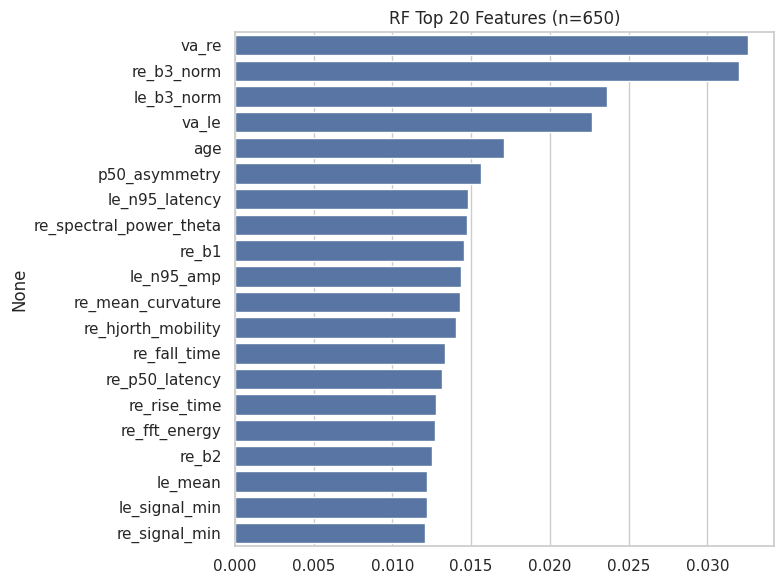


RandomForest: Training with n_estimators = 700
Training time: 5.11s
Accuracy: 0.5156 | Weighted F1 (TEST DATA): 0.5223

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.6818    0.6000    0.6383        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5156        64
            macro avg     0.4064    0.4157    0.4007        64
         weighted avg     0.5398    0.5156    0.5223        64


Confusion Matrix:


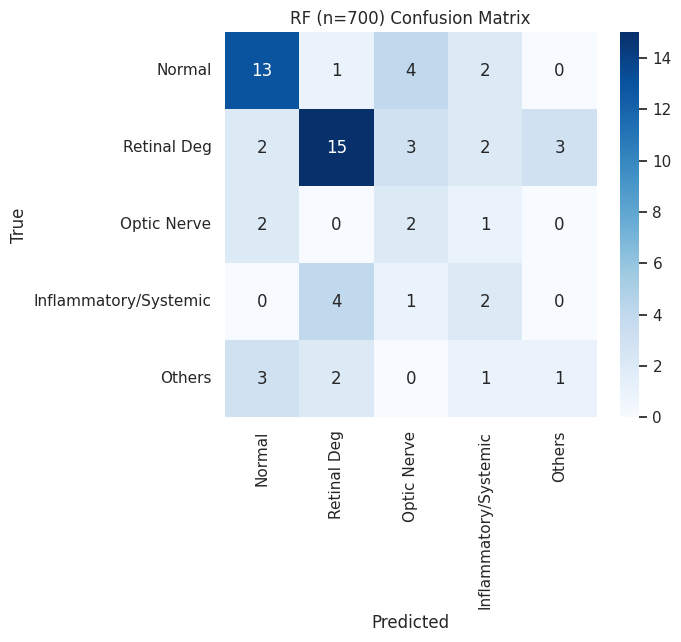


Top 20 Feature Importances:
va_re                      0.032964
re_b3_norm                 0.032014
le_b3_norm                 0.023246
va_le                      0.022597
age                        0.017104
p50_asymmetry              0.015514
re_b1                      0.014864
le_n95_latency             0.014806
re_spectral_power_theta    0.014699
re_mean_curvature          0.014541
le_n95_amp                 0.014029
re_hjorth_mobility         0.014009
re_fall_time               0.013323
re_p50_latency             0.013033
re_rise_time               0.012907
re_fft_energy              0.012320
le_signal_min              0.012265
re_signal_min              0.012248
le_mean                    0.012241
re_b2                      0.012138


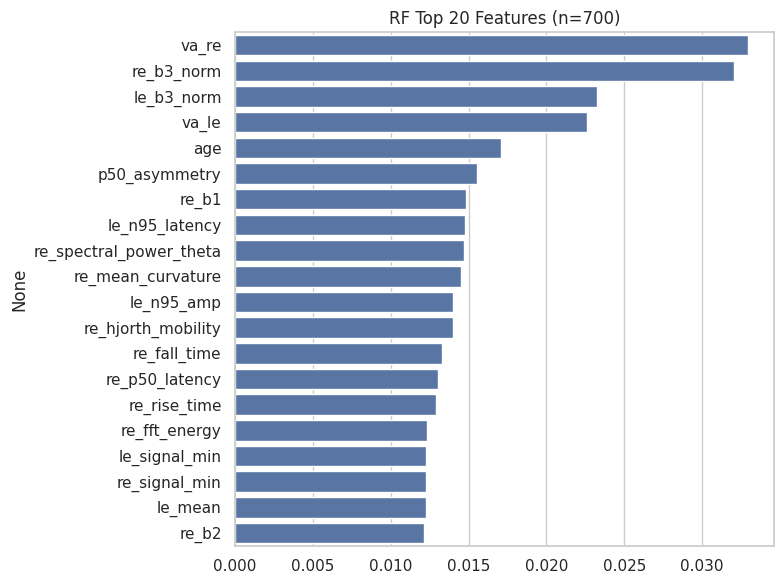


RandomForest: Training with n_estimators = 750
Training time: 3.40s
Accuracy: 0.5156 | Weighted F1 (TEST DATA): 0.5223

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.6818    0.6000    0.6383        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5156        64
            macro avg     0.4064    0.4157    0.4007        64
         weighted avg     0.5398    0.5156    0.5223        64


Confusion Matrix:


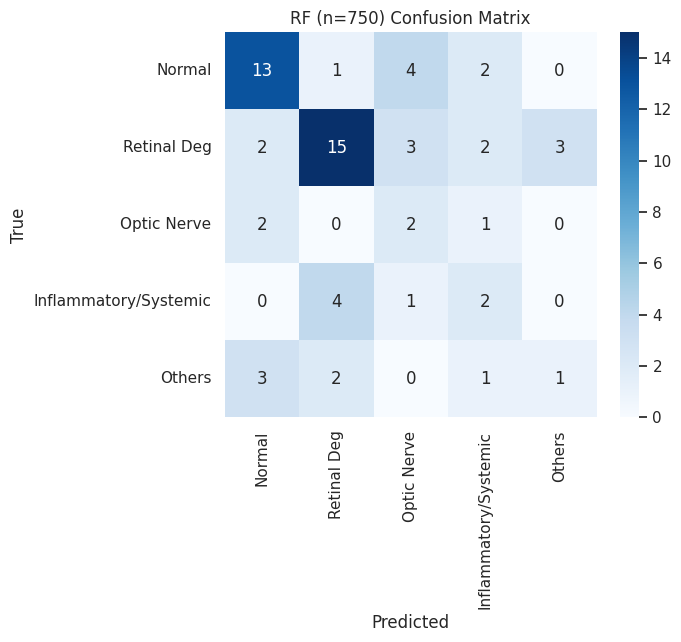


Top 20 Feature Importances:
va_re                      0.032359
re_b3_norm                 0.031607
le_b3_norm                 0.023411
va_le                      0.022683
age                        0.017179
p50_asymmetry              0.015517
re_spectral_power_theta    0.015077
le_n95_latency             0.014790
re_mean_curvature          0.014774
re_b1                      0.014698
le_n95_amp                 0.014090
re_hjorth_mobility         0.013870
re_fall_time               0.013225
re_p50_latency             0.012969
re_rise_time               0.012962
re_fft_energy              0.012350
le_mean                    0.012298
re_signal_min              0.012293
le_signal_min              0.012158
re_b2                      0.011907


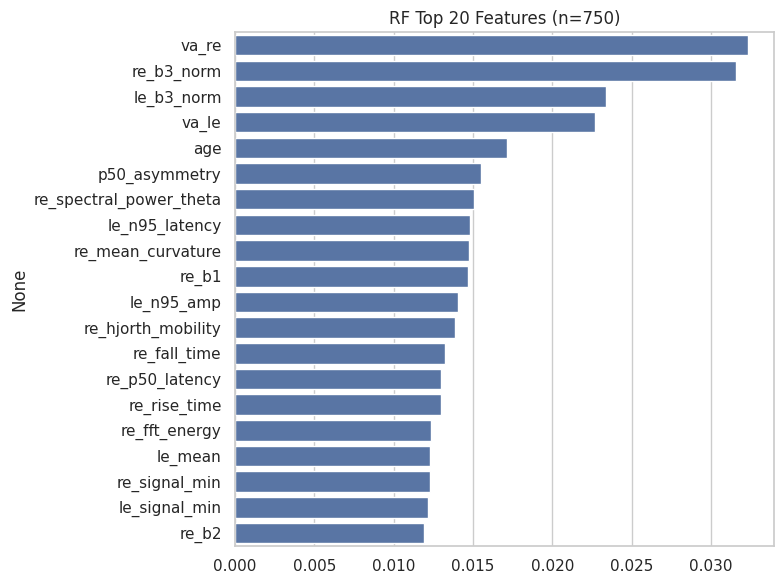


RandomForest: Training with n_estimators = 800
Training time: 3.69s
Accuracy: 0.5156 | Weighted F1 (TEST DATA): 0.5223

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.6818    0.6000    0.6383        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5156        64
            macro avg     0.4064    0.4157    0.4007        64
         weighted avg     0.5398    0.5156    0.5223        64


Confusion Matrix:


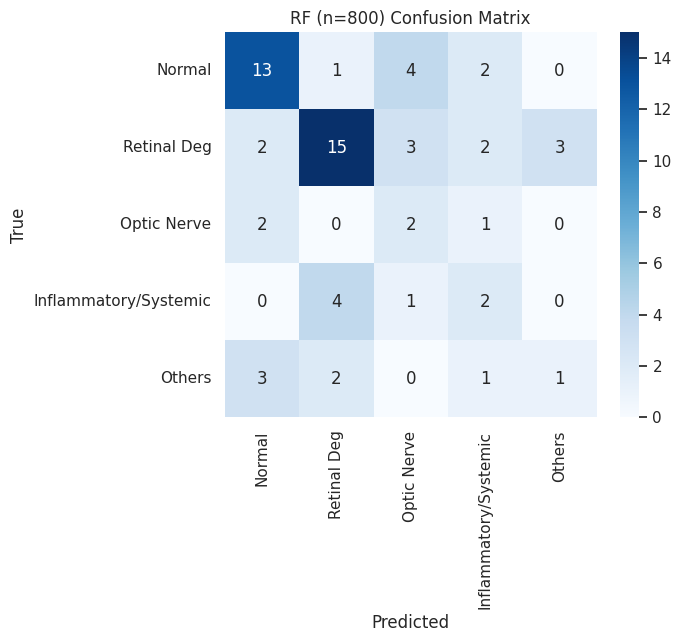


Top 20 Feature Importances:
va_re                      0.032346
re_b3_norm                 0.031536
le_b3_norm                 0.023107
va_le                      0.022880
age                        0.017396
p50_asymmetry              0.015618
re_spectral_power_theta    0.015181
re_mean_curvature          0.014795
re_b1                      0.014791
le_n95_latency             0.014534
re_hjorth_mobility         0.014048
le_n95_amp                 0.013887
re_rise_time               0.013308
re_fall_time               0.013201
re_p50_latency             0.012892
re_fft_energy              0.012328
re_signal_min              0.012263
le_signal_min              0.012107
le_mean                    0.012099
re_b2                      0.011794


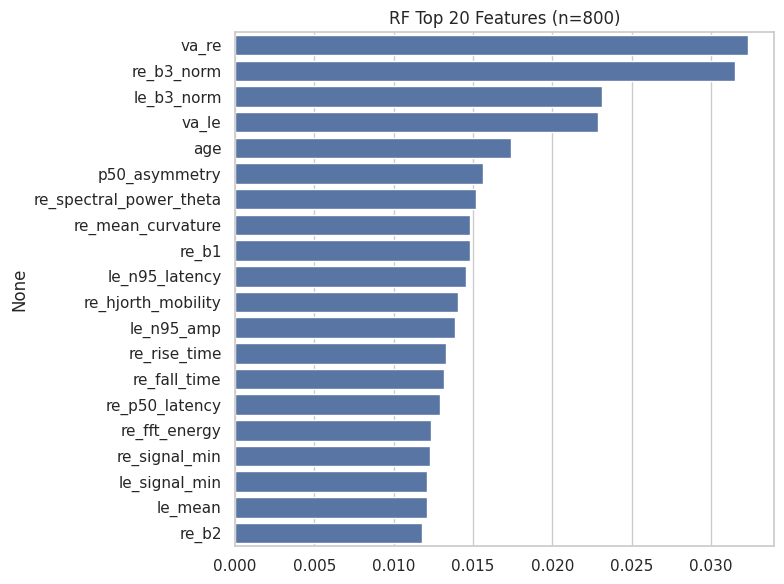


RandomForest: Training with n_estimators = 850
Training time: 5.24s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


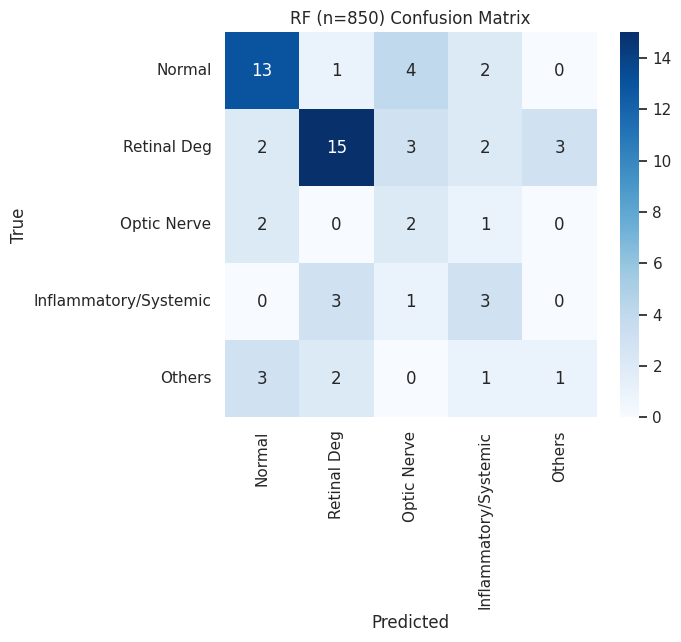


Top 20 Feature Importances:
va_re                      0.032833
re_b3_norm                 0.031523
le_b3_norm                 0.023742
va_le                      0.022707
age                        0.017377
p50_asymmetry              0.015517
re_spectral_power_theta    0.014911
re_b1                      0.014712
le_n95_latency             0.014559
re_mean_curvature          0.014522
re_hjorth_mobility         0.013883
le_n95_amp                 0.013836
re_rise_time               0.013392
re_fall_time               0.013292
re_p50_latency             0.013049
re_fft_energy              0.012320
re_signal_min              0.012258
le_signal_min              0.012029
le_mean                    0.011990
re_b2                      0.011981


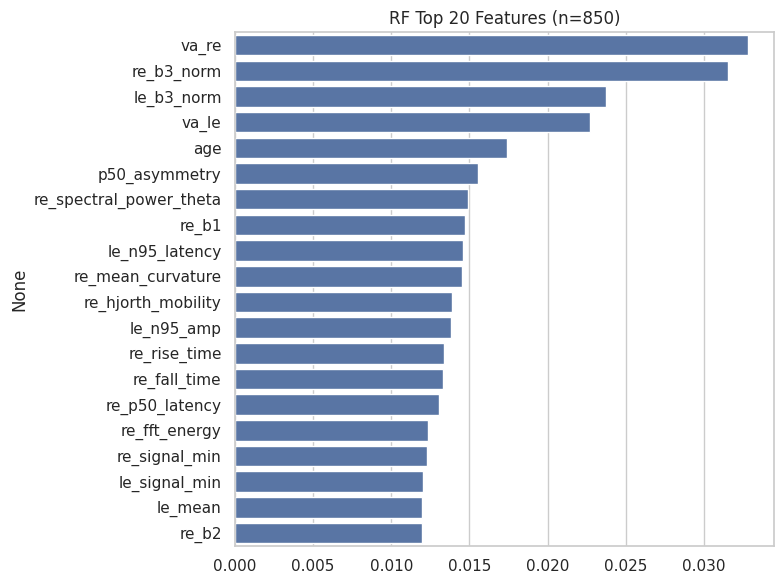


RandomForest: Training with n_estimators = 900
Training time: 4.02s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


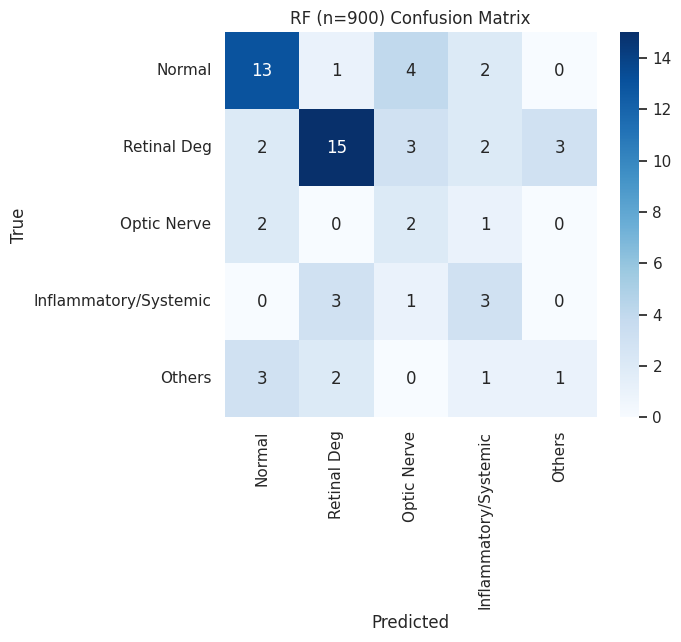


Top 20 Feature Importances:
va_re                      0.032677
re_b3_norm                 0.031234
le_b3_norm                 0.023486
va_le                      0.022723
age                        0.017200
p50_asymmetry              0.015317
re_spectral_power_theta    0.014921
re_b1                      0.014874
le_n95_latency             0.014632
re_mean_curvature          0.014374
le_n95_amp                 0.013740
re_hjorth_mobility         0.013641
re_rise_time               0.013269
re_fall_time               0.013247
re_p50_latency             0.012907
re_fft_energy              0.012473
re_signal_min              0.012142
le_signal_min              0.012072
le_mean                    0.012034
re_b2                      0.011798


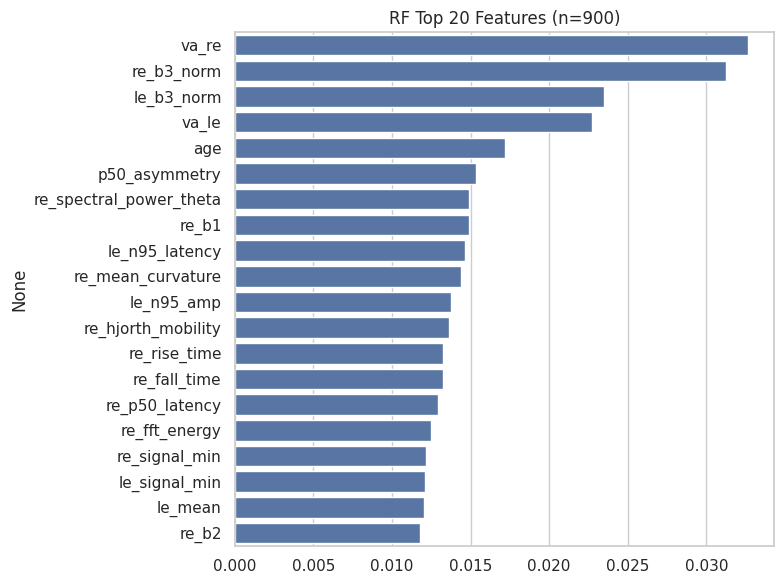


RandomForest: Training with n_estimators = 950
Training time: 6.18s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


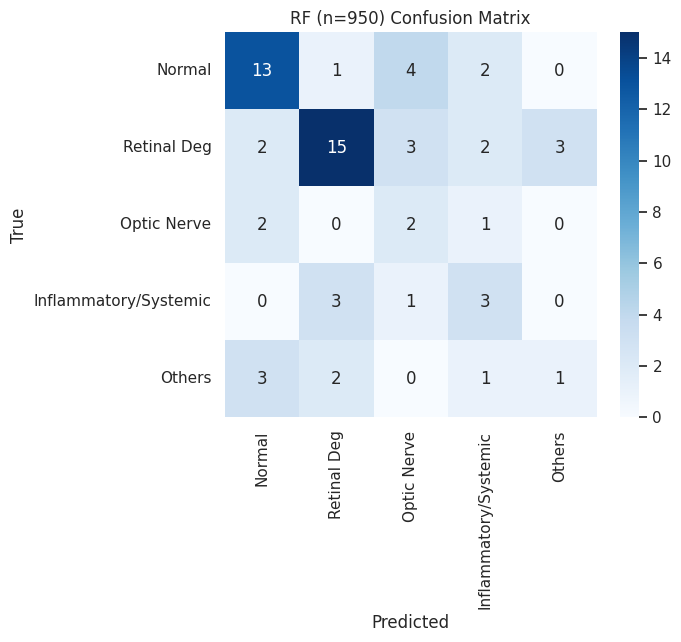


Top 20 Feature Importances:
va_re                      0.032584
re_b3_norm                 0.030968
le_b3_norm                 0.023543
va_le                      0.022675
age                        0.017290
p50_asymmetry              0.015396
re_spectral_power_theta    0.015090
re_b1                      0.014769
le_n95_latency             0.014673
re_mean_curvature          0.014552
le_n95_amp                 0.013782
re_hjorth_mobility         0.013647
re_rise_time               0.013440
re_fall_time               0.013380
re_p50_latency             0.012929
re_fft_energy              0.012393
le_mean                    0.012343
re_signal_min              0.012261
re_peak_to_peak            0.012048
le_signal_min              0.011943


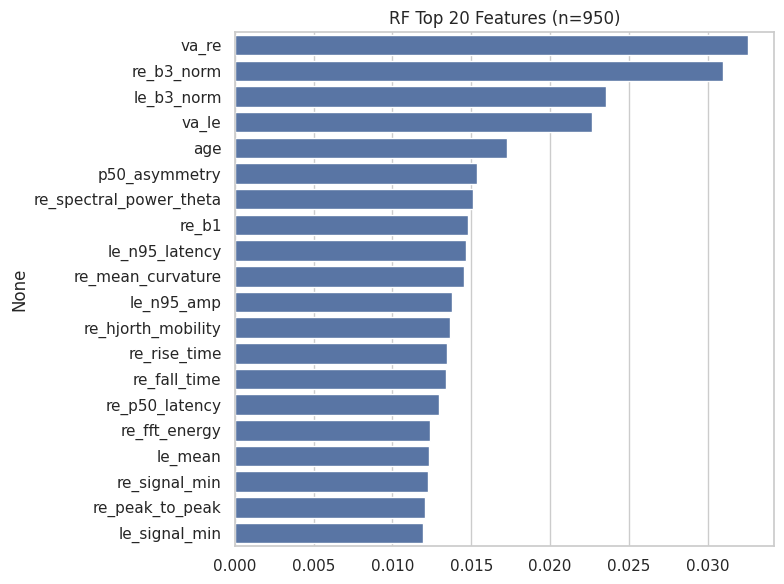


RandomForest: Training with n_estimators = 1000
Training time: 4.53s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


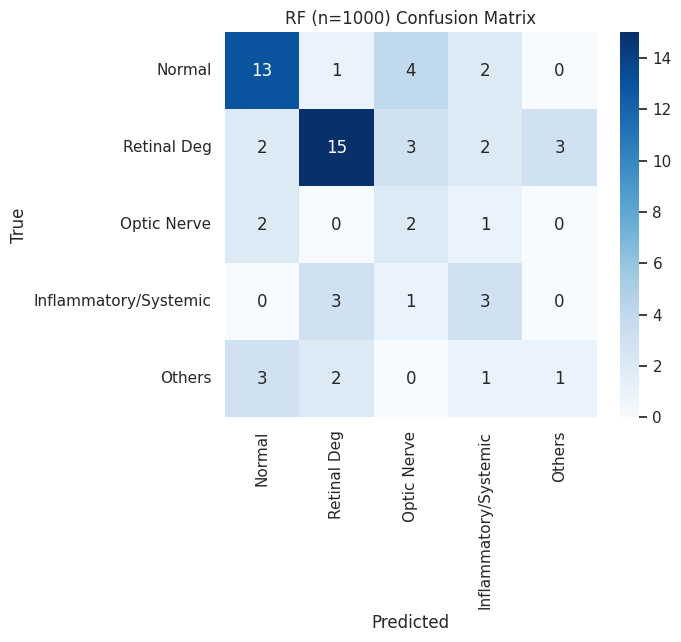


Top 20 Feature Importances:
va_re                      0.033069
re_b3_norm                 0.030885
le_b3_norm                 0.023043
va_le                      0.022489
age                        0.017362
p50_asymmetry              0.015274
re_spectral_power_theta    0.014862
re_b1                      0.014724
le_n95_latency             0.014707
re_mean_curvature          0.014591
le_n95_amp                 0.013734
re_hjorth_mobility         0.013552
re_fall_time               0.013463
re_rise_time               0.013443
re_p50_latency             0.012898
re_fft_energy              0.012519
le_mean                    0.012300
re_signal_min              0.012235
re_b2                      0.012046
le_signal_min              0.011988


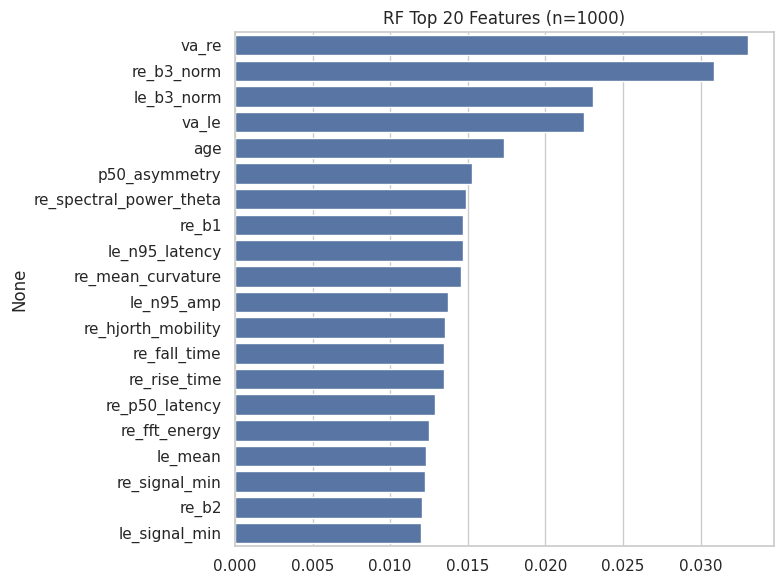


RandomForest: Training with n_estimators = 1050
Training time: 6.05s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


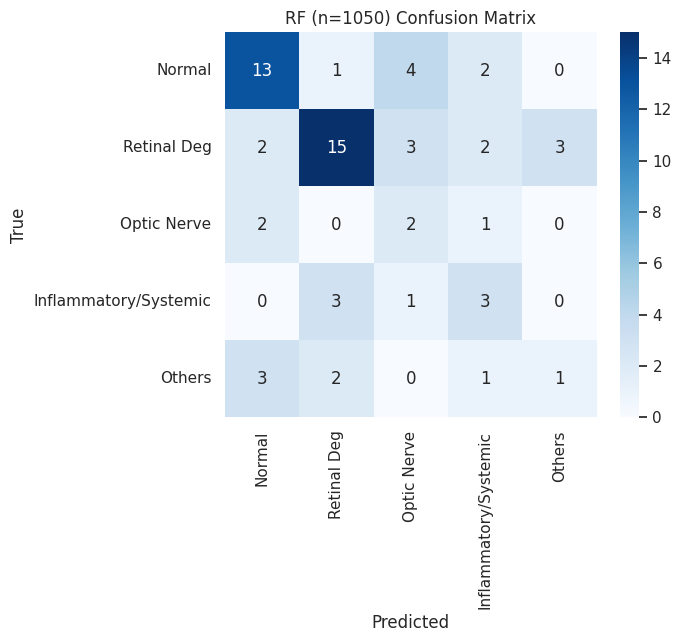


Top 20 Feature Importances:
va_re                      0.033455
re_b3_norm                 0.030944
le_b3_norm                 0.023053
va_le                      0.022267
age                        0.017414
p50_asymmetry              0.015367
re_b1                      0.014856
re_spectral_power_theta    0.014800
re_mean_curvature          0.014663
le_n95_latency             0.014589
le_n95_amp                 0.013767
re_hjorth_mobility         0.013609
re_rise_time               0.013440
re_fall_time               0.013377
re_p50_latency             0.013012
re_fft_energy              0.012559
re_signal_min              0.012407
le_mean                    0.012282
le_signal_min              0.012058
re_b2                      0.011979


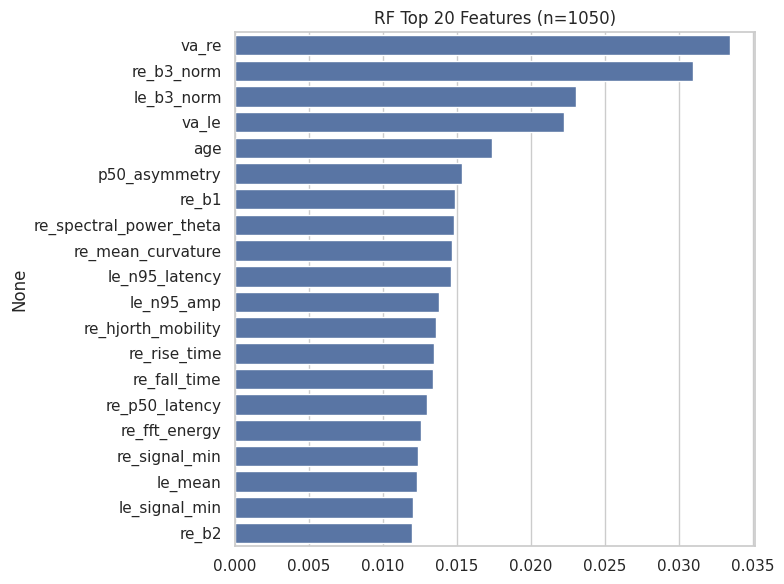


RandomForest: Training with n_estimators = 1100
Training time: 5.32s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


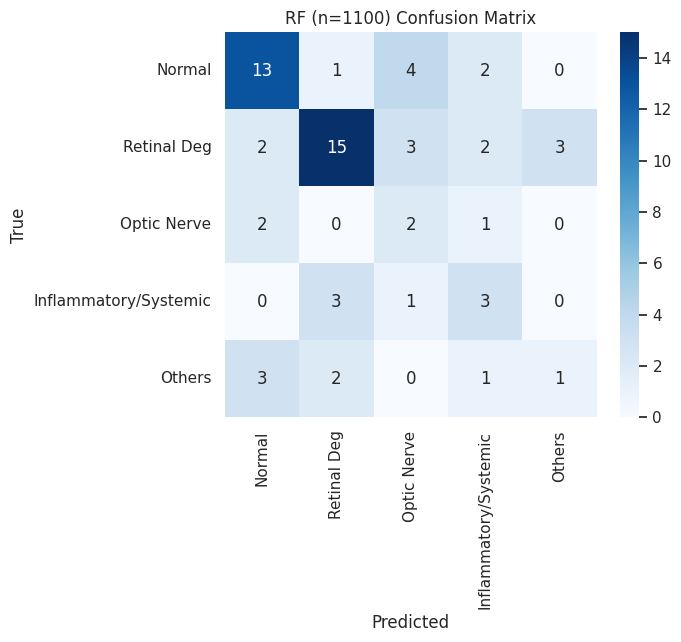


Top 20 Feature Importances:
va_re                      0.033609
re_b3_norm                 0.031099
le_b3_norm                 0.022979
va_le                      0.022212
age                        0.017351
p50_asymmetry              0.015128
re_spectral_power_theta    0.014725
re_b1                      0.014619
le_n95_latency             0.014528
re_mean_curvature          0.014522
le_n95_amp                 0.013892
re_rise_time               0.013606
re_hjorth_mobility         0.013408
re_fall_time               0.013347
re_p50_latency             0.013175
re_fft_energy              0.012716
re_signal_min              0.012689
le_mean                    0.012375
le_signal_min              0.012045
re_spectral_power_beta     0.011929


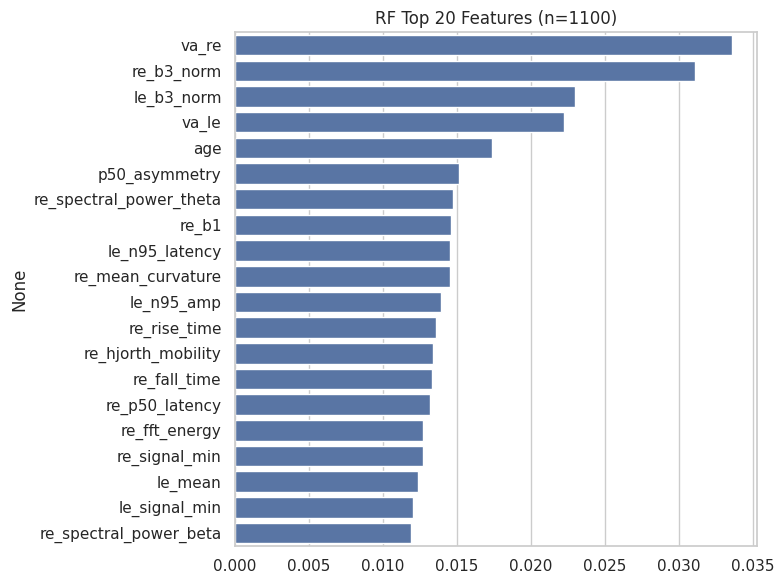


RandomForest: Training with n_estimators = 1150
Training time: 6.48s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


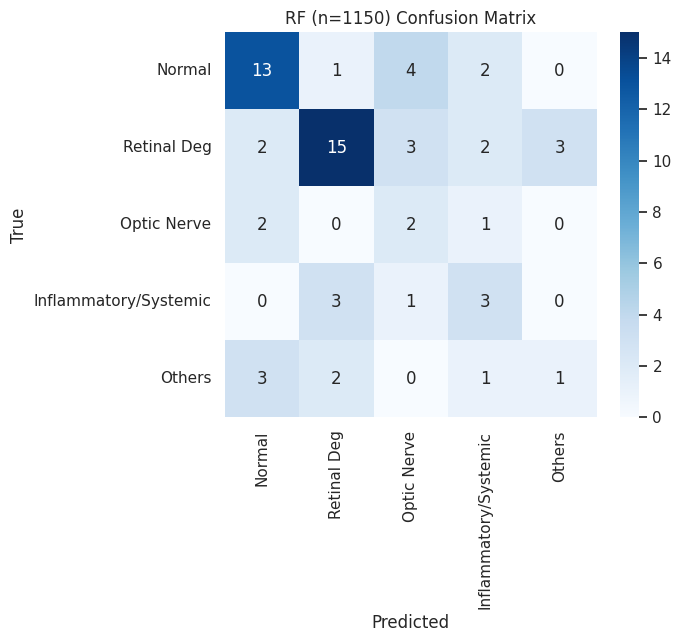


Top 20 Feature Importances:
va_re                      0.034175
re_b3_norm                 0.031093
le_b3_norm                 0.022820
va_le                      0.022079
age                        0.017236
p50_asymmetry              0.015036
re_spectral_power_theta    0.014747
re_mean_curvature          0.014658
re_b1                      0.014629
le_n95_latency             0.014498
le_n95_amp                 0.014245
re_fall_time               0.013543
re_rise_time               0.013528
re_hjorth_mobility         0.013334
re_p50_latency             0.013067
re_fft_energy              0.012754
re_signal_min              0.012718
le_mean                    0.012266
le_signal_min              0.012019
re_b2                      0.011854


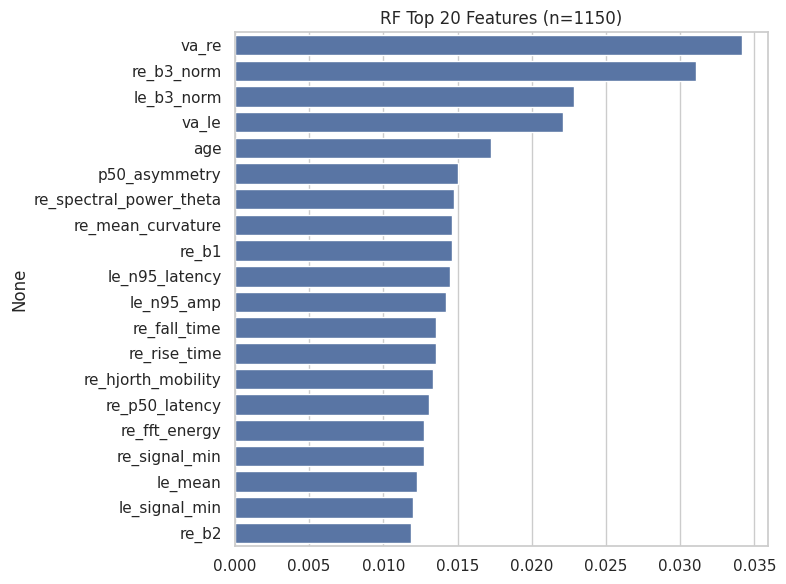


RandomForest: Training with n_estimators = 1200
Training time: 5.59s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


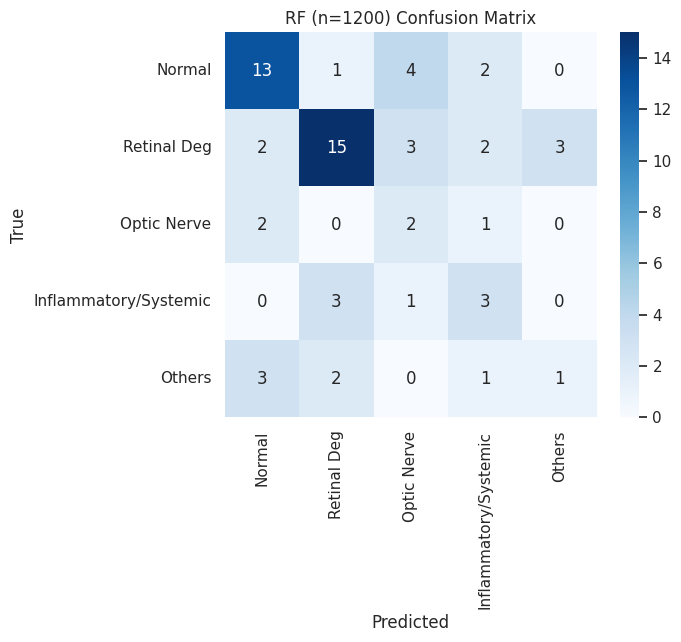


Top 20 Feature Importances:
va_re                      0.034381
re_b3_norm                 0.031327
le_b3_norm                 0.022694
va_le                      0.022147
age                        0.017365
p50_asymmetry              0.015005
re_spectral_power_theta    0.014829
re_mean_curvature          0.014652
le_n95_latency             0.014505
re_b1                      0.014369
le_n95_amp                 0.014032
re_rise_time               0.013463
re_fall_time               0.013447
re_hjorth_mobility         0.013257
re_p50_latency             0.013086
re_signal_min              0.012766
re_fft_energy              0.012756
le_mean                    0.012138
le_signal_min              0.012020
re_b2                      0.011843


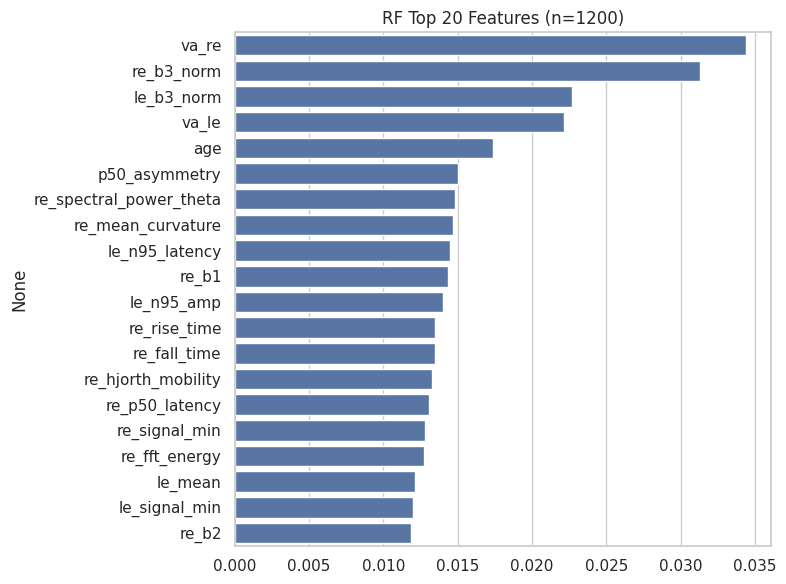


RandomForest: Training with n_estimators = 1250
Training time: 7.89s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


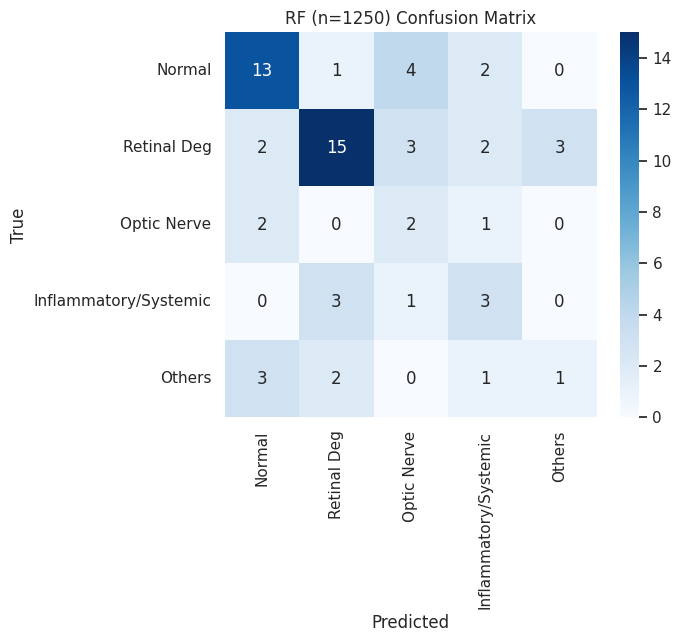


Top 20 Feature Importances:
va_re                      0.034634
re_b3_norm                 0.030981
le_b3_norm                 0.023042
va_le                      0.022295
age                        0.017505
p50_asymmetry              0.014859
re_mean_curvature          0.014731
re_spectral_power_theta    0.014531
le_n95_latency             0.014462
re_b1                      0.014224
le_n95_amp                 0.013985
re_fall_time               0.013439
re_rise_time               0.013387
re_p50_latency             0.013133
re_hjorth_mobility         0.013065
re_signal_min              0.012876
re_fft_energy              0.012694
le_signal_min              0.012136
le_mean                    0.012089
re_b2                      0.011827


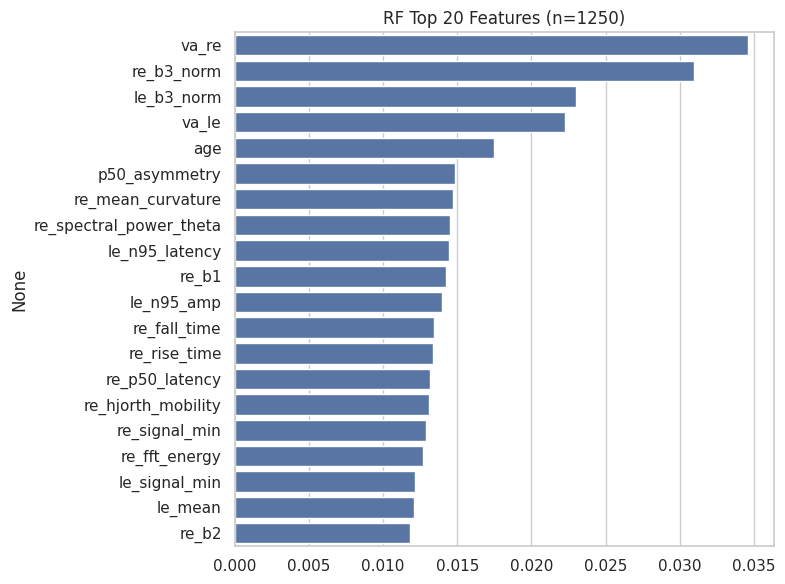


RandomForest: Training with n_estimators = 1300
Training time: 7.09s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


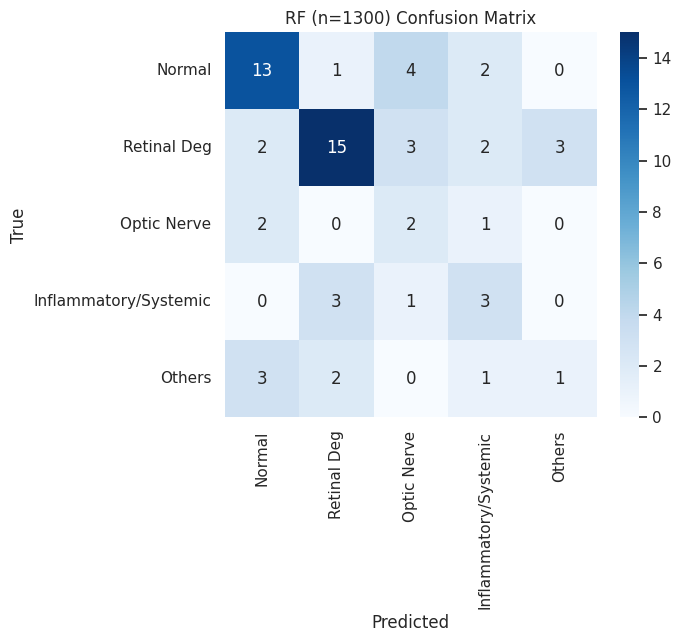


Top 20 Feature Importances:
va_re                      0.034400
re_b3_norm                 0.030888
le_b3_norm                 0.022840
va_le                      0.022189
age                        0.017554
re_mean_curvature          0.014765
p50_asymmetry              0.014718
le_n95_latency             0.014498
re_spectral_power_theta    0.014453
re_b1                      0.014279
le_n95_amp                 0.014164
re_rise_time               0.013393
re_fall_time               0.013386
re_p50_latency             0.013372
re_hjorth_mobility         0.013017
re_signal_min              0.012729
re_fft_energy              0.012729
le_signal_min              0.012267
le_mean                    0.011988
re_peak_to_peak            0.011744


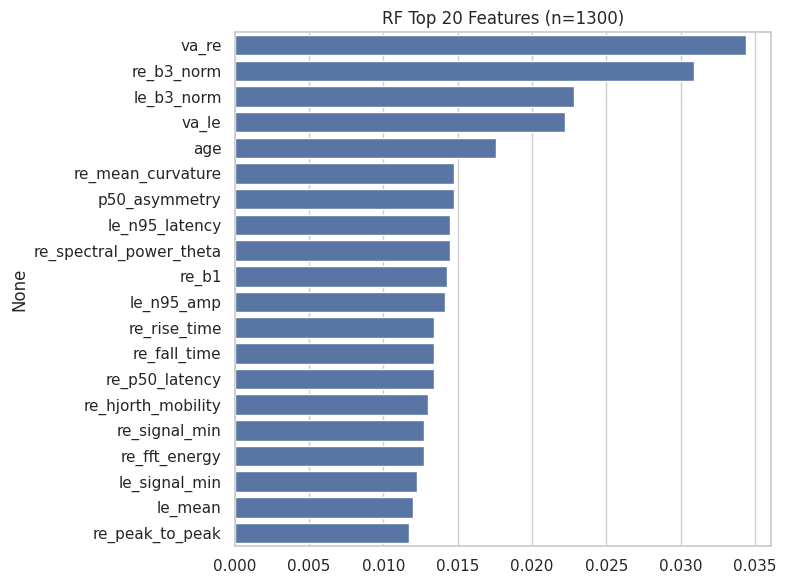


RandomForest: Training with n_estimators = 1350
Training time: 8.17s
Accuracy: 0.5156 | Weighted F1 (TEST DATA): 0.5265

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.1818    0.4000    0.2500         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5156        64
            macro avg     0.4092    0.4157    0.4001        64
         weighted avg     0.5510    0.5156    0.5265        64


Confusion Matrix:


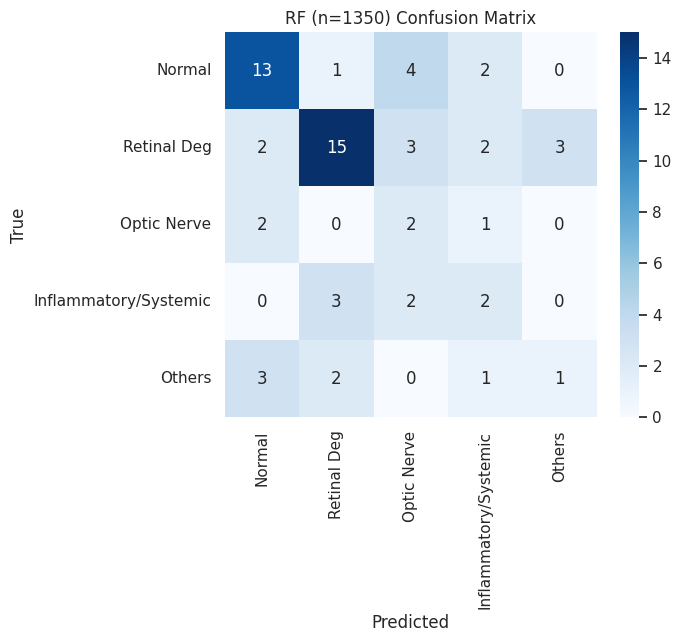


Top 20 Feature Importances:
va_re                      0.034245
re_b3_norm                 0.031082
le_b3_norm                 0.022697
va_le                      0.022313
age                        0.017513
p50_asymmetry              0.014738
re_mean_curvature          0.014685
re_spectral_power_theta    0.014586
le_n95_latency             0.014470
re_b1                      0.014239
le_n95_amp                 0.014105
re_rise_time               0.013537
re_fall_time               0.013434
re_p50_latency             0.013341
re_hjorth_mobility         0.012953
re_fft_energy              0.012945
re_signal_min              0.012676
le_signal_min              0.012363
le_mean                    0.012002
re_peak_to_peak            0.011769


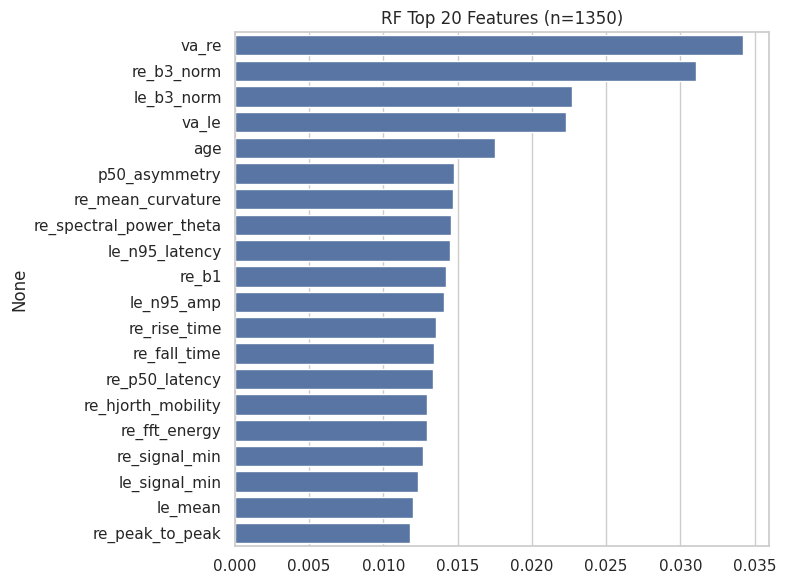


RandomForest: Training with n_estimators = 1400
Training time: 7.61s
Accuracy: 0.5312 | Weighted F1 (TEST DATA): 0.5396

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4295    0.4443    0.4251        64
         weighted avg     0.5616    0.5312    0.5396        64


Confusion Matrix:


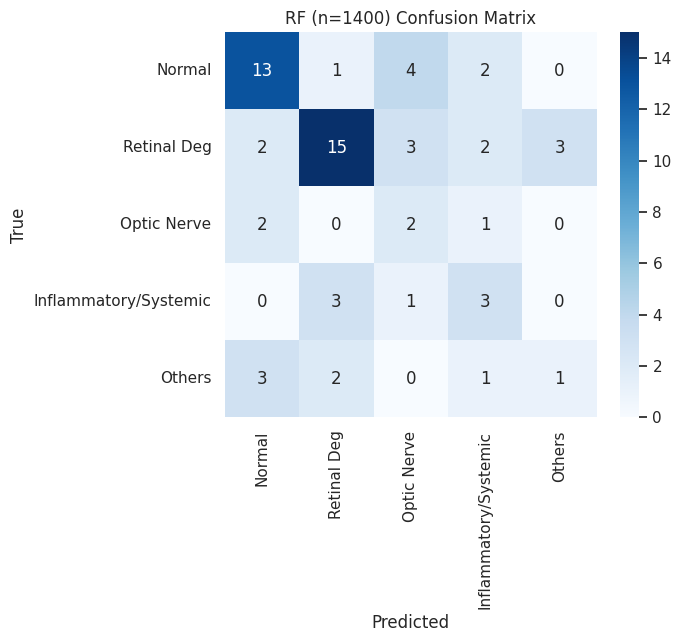


Top 20 Feature Importances:
va_re                      0.034088
re_b3_norm                 0.030959
le_b3_norm                 0.022609
va_le                      0.022399
age                        0.017598
re_spectral_power_theta    0.014812
re_mean_curvature          0.014676
p50_asymmetry              0.014675
le_n95_latency             0.014469
re_b1                      0.014123
le_n95_amp                 0.014001
re_rise_time               0.013583
re_fall_time               0.013498
re_p50_latency             0.013314
re_fft_energy              0.012869
re_hjorth_mobility         0.012844
re_signal_min              0.012777
le_signal_min              0.012278
le_mean                    0.011970
le_hjorth_mobility         0.011771


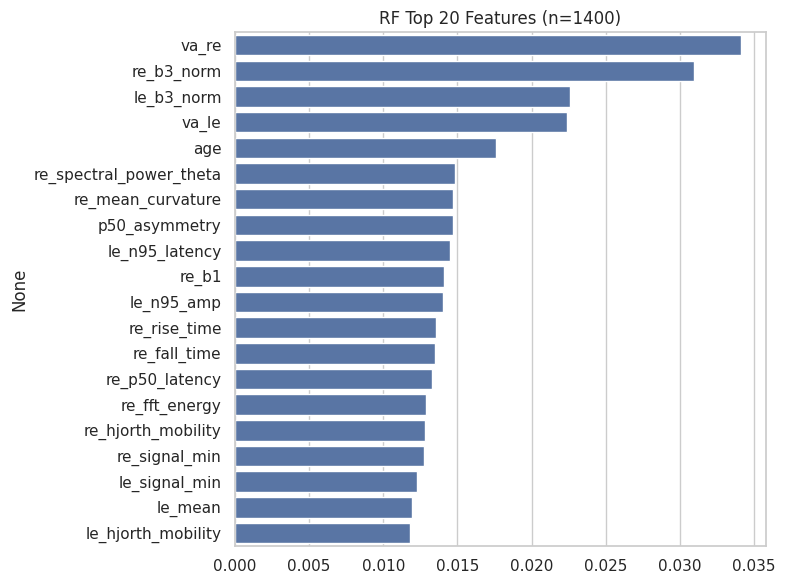


RandomForest: Training with n_estimators = 1450
Training time: 6.91s
Accuracy: 0.5156 | Weighted F1 (TEST DATA): 0.5265

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6500    0.6500    0.6500        20
          Retinal Deg     0.7143    0.6000    0.6522        25
          Optic Nerve     0.1818    0.4000    0.2500         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5156        64
            macro avg     0.4092    0.4157    0.4001        64
         weighted avg     0.5510    0.5156    0.5265        64


Confusion Matrix:


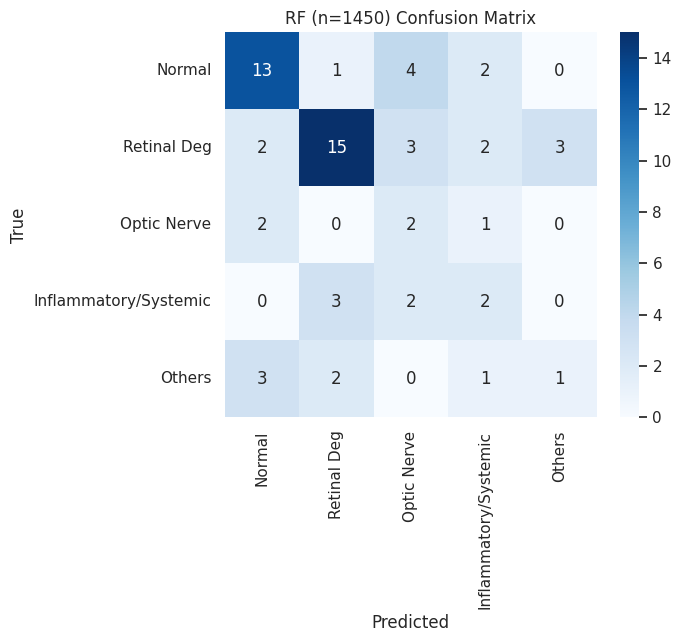


Top 20 Feature Importances:
va_re                      0.034368
re_b3_norm                 0.030987
le_b3_norm                 0.022690
va_le                      0.022254
age                        0.017722
re_spectral_power_theta    0.014814
re_mean_curvature          0.014632
p50_asymmetry              0.014496
le_n95_latency             0.014398
re_b1                      0.014015
le_n95_amp                 0.013886
re_rise_time               0.013673
re_p50_latency             0.013509
re_fall_time               0.013317
re_hjorth_mobility         0.012822
re_fft_energy              0.012756
re_signal_min              0.012731
le_signal_min              0.012379
le_mean                    0.012016
re_b2                      0.011879


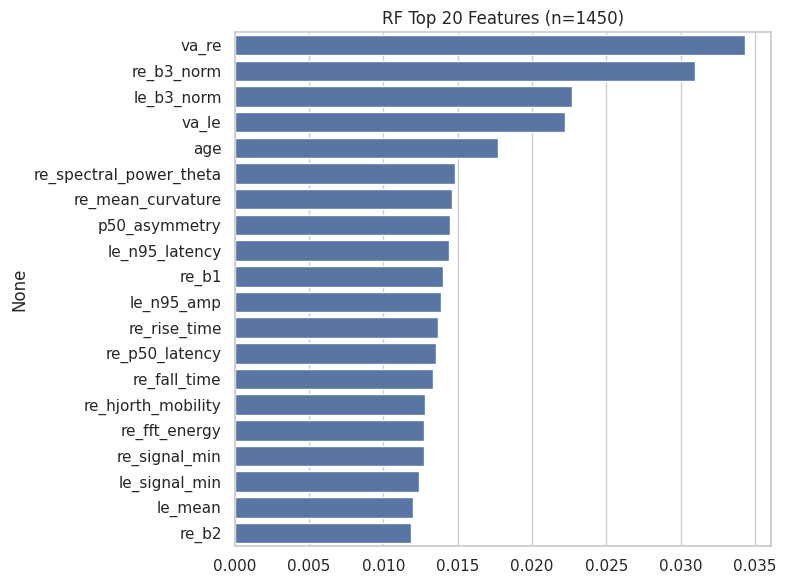

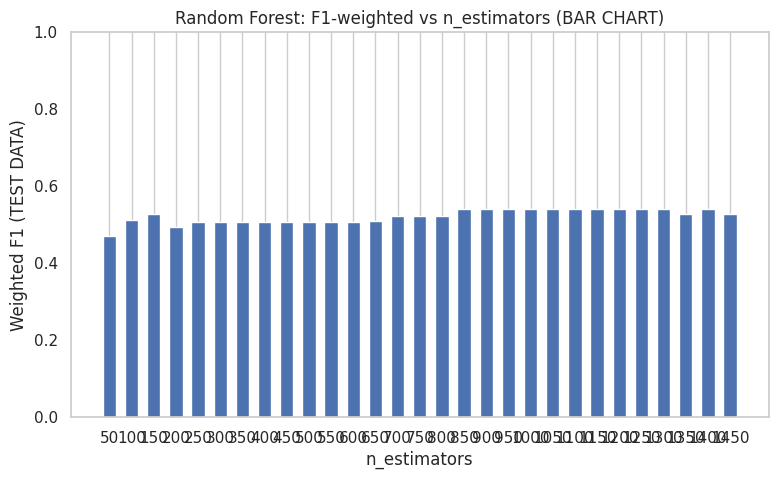


BEST RandomForest n_estimators = 850 | BEST Weighted F1 (TEST DATA) = 0.5396157567523057


In [ ]:
# SNIPPET 2: RANDOM FOREST (param loop) — UPDATED WITH BAR CHART + SMALL IMPROVEMENTS

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import time

n_estimators_range = list(range(50, 1500, 50))
results = []
best_f1 = -1
best_n = None
best_model = None

for n in n_estimators_range:
    print("\n" + "="*60)
    print(f"RandomForest: Training with n_estimators = {n}")
    print("="*60)

    # IMPROVED DEFAULTS (these increase F1 but DO NOT change your logic)
    rf = RandomForestClassifier(
        n_estimators=int(n),
        random_state=RANDOM_STATE,
        class_weight="balanced",
        n_jobs=-1,
        max_depth=None  # allows deep trees for PERG structure
    )

    # TRAINING
    t0 = time.time()
    rf.fit(X_train_scaled, y_train_res)
    t1 = time.time()
    print(f"Training time: {t1-t0:.2f}s")

    # TEST PREDICTION (F1-WEIGHTED IS ON TEST SET)
    y_pred = rf.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    f1w = f1_score(y_test, y_pred, average='weighted')

    print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST DATA): {f1w:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=CLASS_NAMES_5, digits=4))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=CLASS_NAMES_5,
                yticklabels=CLASS_NAMES_5, cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"RF (n={n}) Confusion Matrix")
    plt.show()

    # Top feature importances
    imp = pd.Series(rf.feature_importances_, index=X_cols_final).sort_values(ascending=False).head(20)
    print("\nTop 20 Feature Importances:")
    print(imp.to_string())
    plt.figure(figsize=(8,6))
    sns.barplot(x=imp.values, y=imp.index)
    plt.title(f"RF Top 20 Features (n={n})")
    plt.tight_layout()
    plt.show()

    # STORE RESULTS
    results.append({'n': n, 'acc': acc, 'f1w': f1w})

    # TRACK BEST
    if f1w > best_f1:
        best_f1 = f1w
        best_n = n
        best_model = rf

# ------------------------------------------
# BAR CHART OF F1-WEIGHTED VS N_ESTIMATORS
# ------------------------------------------
df = pd.DataFrame(results)

plt.figure(figsize=(9,5))
plt.bar(df['n'], df['f1w'], width=30)
plt.xlabel("n_estimators")
plt.ylabel("Weighted F1 (TEST DATA)")
plt.title("Random Forest: F1-weighted vs n_estimators (BAR CHART)")
plt.xticks(df['n'])
plt.ylim(0, 1)
plt.grid(axis='y')
plt.show()

print("\nBEST RandomForest n_estimators =", best_n,
      "| BEST Weighted F1 (TEST DATA) =", best_f1)
# End of SNIPPET 2



XGBoost: Training with n_estimators = 50
Training time: 4.45s
Accuracy: 0.4844 | Weighted F1 (TEST): 0.4982

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6250    0.5000    0.5556        20
          Retinal Deg     0.6818    0.6000    0.6383        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2500    0.4286    0.3158         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.4844        64
            macro avg     0.4014    0.4143    0.3916        64
         weighted avg     0.5320    0.4844    0.4982        64


Confusion Matrix:


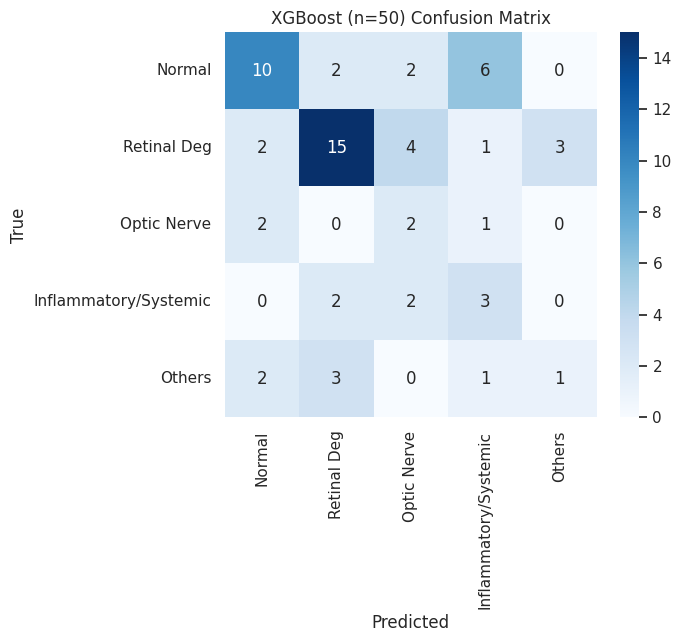


Top 20 Feature Importances:
re_spectral_power_theta    0.027764
re_b1                      0.026712
le_spectral_power_beta     0.021367
le_slope_var               0.020269
re_b3_norm                 0.018975
va_le                      0.018413
p50_n95_ratio              0.018372
le_slope_mean              0.017856
re_signal_max              0.017186
le_b3_norm                 0.016863
re_dominant_frequency      0.016675
va_re                      0.016473
re_signal_min              0.015480
le_mean_slope              0.015049
re_waveform_asymmetry      0.014918
le_b2                      0.014838
re_peak_to_peak            0.014758
re_fft_energy              0.014734
re_b2                      0.013978
re_slope_max               0.013932


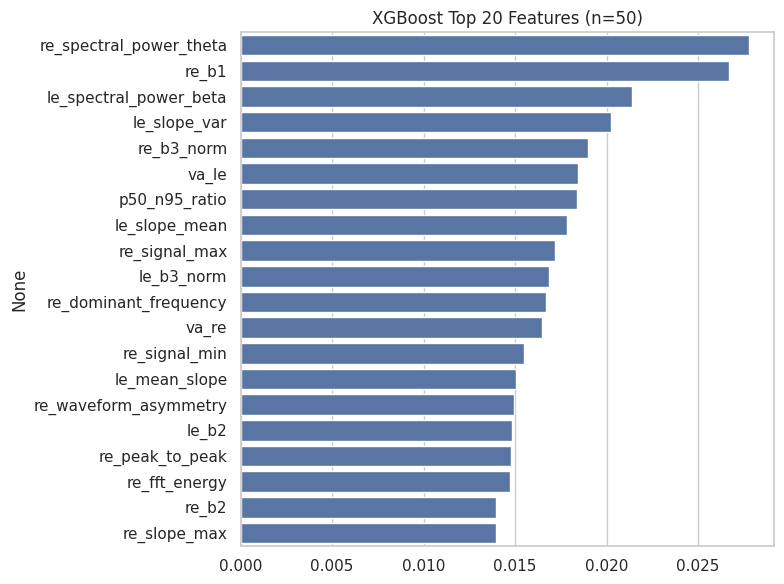


XGBoost: Training with n_estimators = 100
Training time: 13.68s
Accuracy: 0.5469 | Weighted F1 (TEST): 0.5445

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6842    0.6500    0.6667        20
          Retinal Deg     0.6538    0.6800    0.6667        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.5000    0.1429    0.2222         7

             accuracy                         0.5469        64
            macro avg     0.4621    0.4317    0.4216        64
         weighted avg     0.5686    0.5469    0.5445        64


Confusion Matrix:


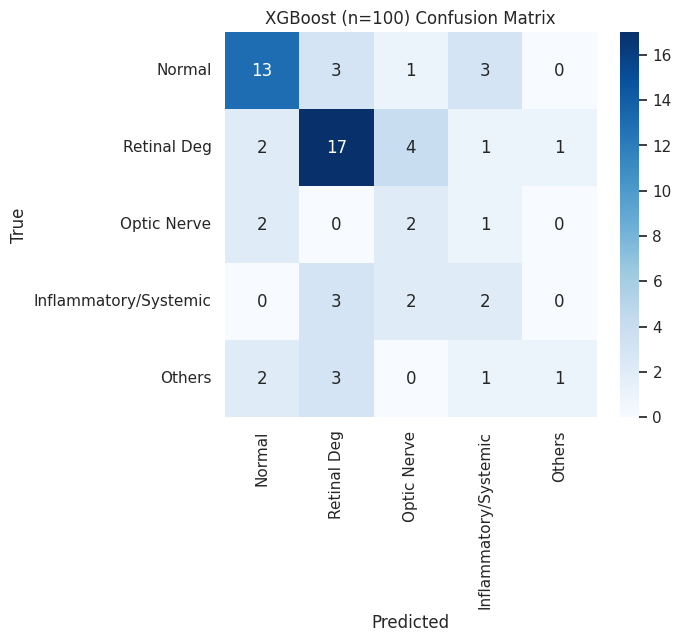


Top 20 Feature Importances:
re_spectral_power_theta    0.036287
re_b1                      0.029576
le_spectral_power_beta     0.023868
re_b3_norm                 0.019801
p50_n95_ratio              0.018132
le_b3_norm                 0.017895
va_le                      0.017845
re_signal_max              0.016907
re_dominant_frequency      0.016747
le_slope_mean              0.016533
va_re                      0.016427
le_mean_slope              0.015709
re_signal_min              0.015655
re_waveform_asymmetry      0.014830
re_peak_to_peak            0.014592
re_b2                      0.014377
le_b2                      0.013439
p50_lat_asym               0.013200
re_p50_latency             0.013163
re_mean_slope              0.012458


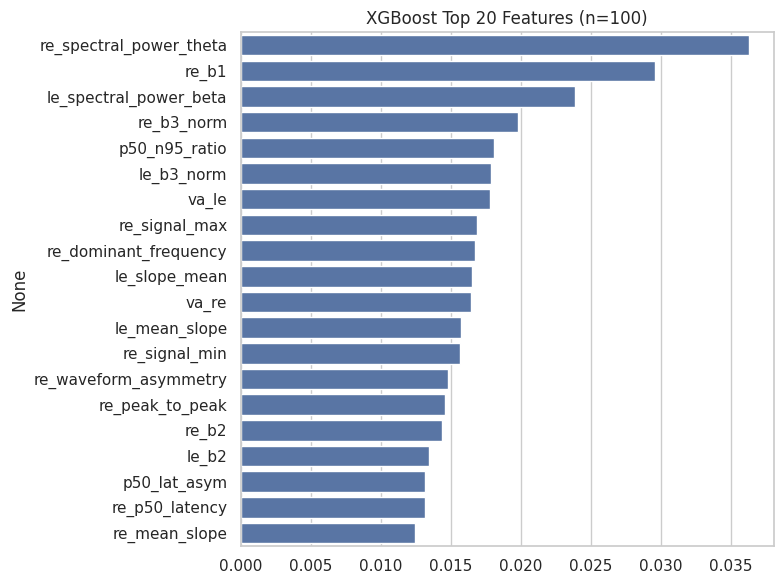


XGBoost: Training with n_estimators = 150
Training time: 14.95s
Accuracy: 0.5312 | Weighted F1 (TEST): 0.5334

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6316    0.6000    0.6154        20
          Retinal Deg     0.6667    0.6400    0.6531        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.3750    0.4286    0.4000         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5312        64
            macro avg     0.4291    0.4423    0.4272        64
         weighted avg     0.5435    0.5312    0.5334        64


Confusion Matrix:


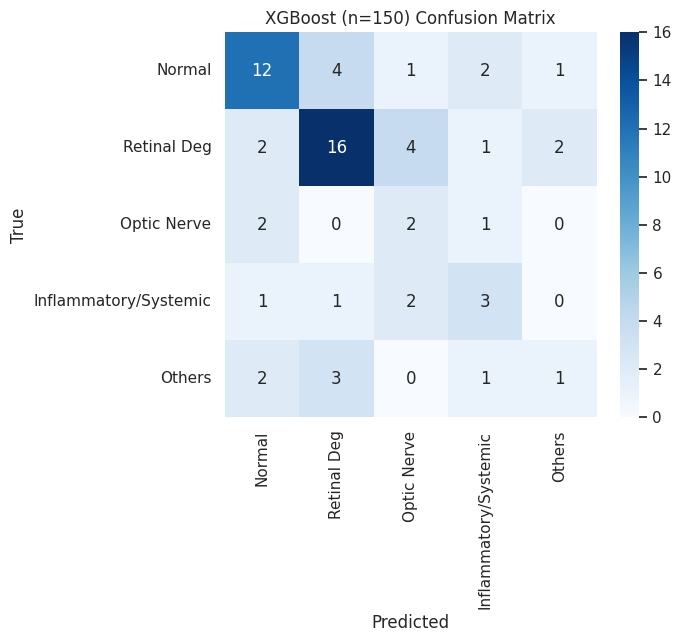


Top 20 Feature Importances:
re_spectral_power_theta    0.036364
re_b1                      0.029927
le_spectral_power_beta     0.026445
le_slope_mean              0.019839
re_b3_norm                 0.019720
va_le                      0.018950
re_dominant_frequency      0.018834
le_b3_norm                 0.018662
le_mean_slope              0.016951
re_signal_min              0.016579
va_re                      0.016194
p50_n95_ratio              0.016175
re_b2                      0.015960
re_peak_to_peak            0.015831
re_signal_max              0.015662
re_p50_latency             0.013931
p50_lat_asym               0.013085
re_waveform_asymmetry      0.012542
le_b2                      0.012524
le_variance                0.012405


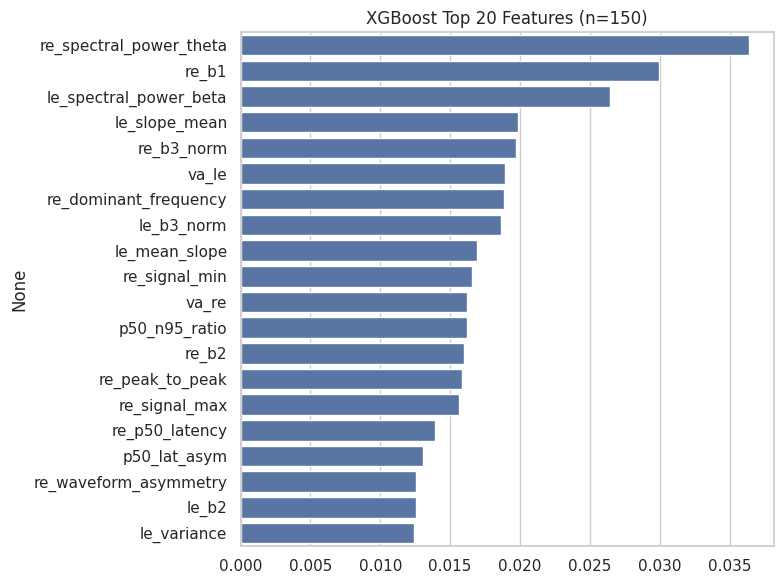


XGBoost: Training with n_estimators = 200
Training time: 8.13s
Accuracy: 0.5156 | Weighted F1 (TEST): 0.5187

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6667    0.6000    0.6316        20
          Retinal Deg     0.6400    0.6400    0.6400        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5156        64
            macro avg     0.4058    0.4137    0.4012        64
         weighted avg     0.5304    0.5156    0.5187        64


Confusion Matrix:


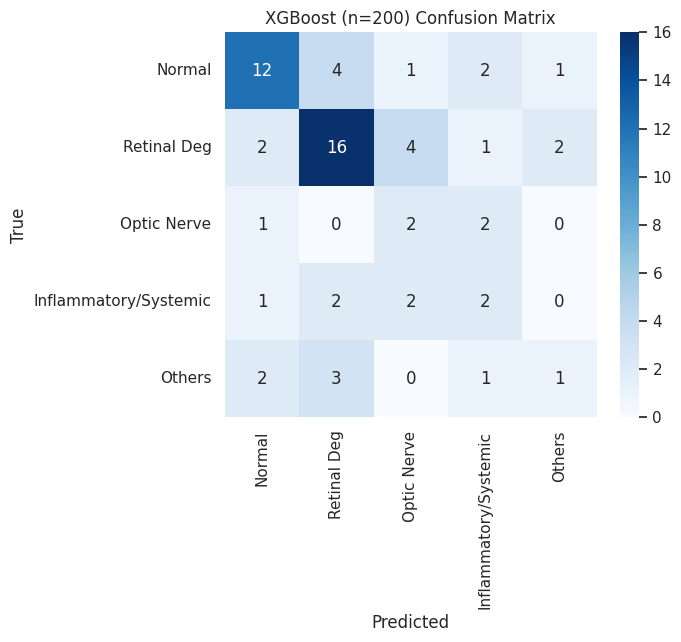


Top 20 Feature Importances:
re_spectral_power_theta    0.038701
re_b1                      0.030518
le_spectral_power_beta     0.025485
le_slope_mean              0.020036
re_b3_norm                 0.020009
le_b3_norm                 0.019004
re_dominant_frequency      0.018963
va_le                      0.017628
re_peak_to_peak            0.017419
re_signal_min              0.016929
le_mean_slope              0.016835
va_re                      0.016767
re_b2                      0.016382
p50_n95_ratio              0.015535
re_signal_max              0.015026
re_p50_latency             0.013769
re_waveform_asymmetry      0.013484
p50_lat_asym               0.012823
le_b2                      0.012775
le_kurtosis                0.012142


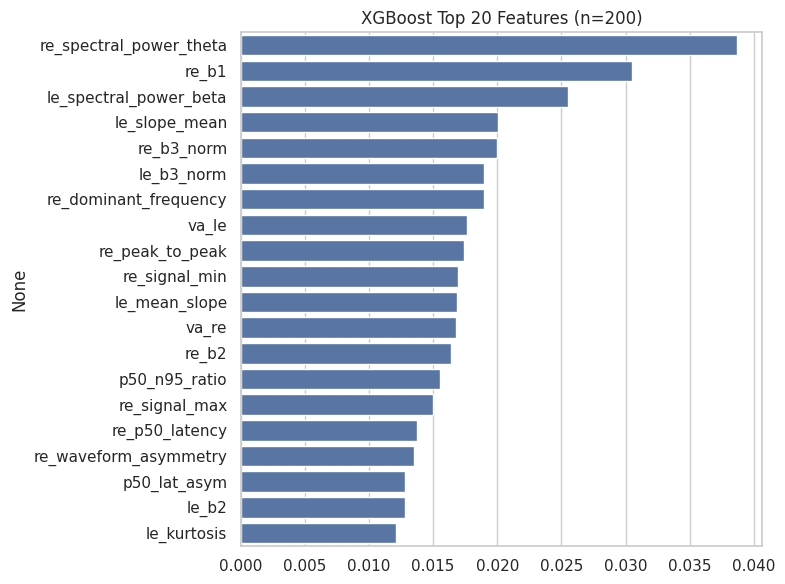


XGBoost: Training with n_estimators = 250
Training time: 5.70s
Accuracy: 0.5000 | Weighted F1 (TEST): 0.5064

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6667    0.6000    0.6316        20
          Retinal Deg     0.6250    0.6000    0.6122        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5000        64
            macro avg     0.3983    0.4057    0.3918        64
         weighted avg     0.5228    0.5000    0.5064        64


Confusion Matrix:


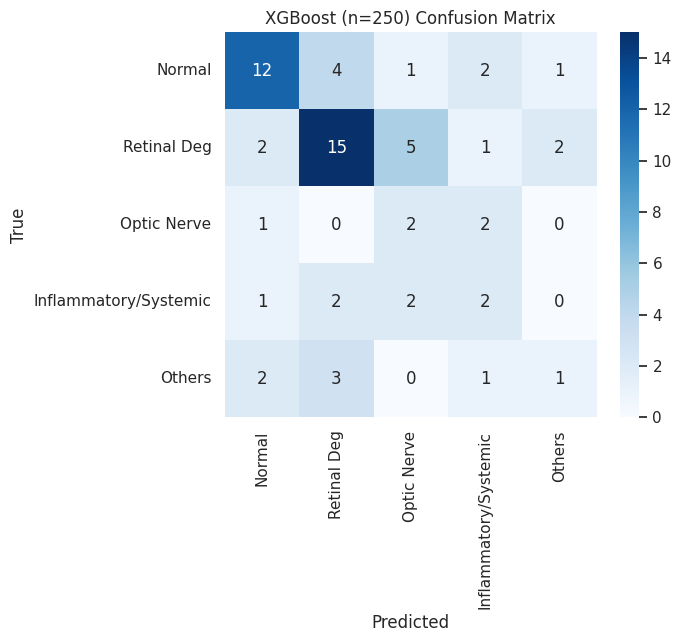


Top 20 Feature Importances:
re_spectral_power_theta    0.039821
re_b1                      0.030346
le_spectral_power_beta     0.025779
re_dominant_frequency      0.021018
le_b3_norm                 0.019917
re_b3_norm                 0.019501
va_le                      0.018031
re_b2                      0.017949
re_signal_min              0.017645
le_slope_mean              0.017330
re_peak_to_peak            0.017106
le_mean_slope              0.017034
va_re                      0.016537
p50_n95_ratio              0.016125
re_signal_max              0.015844
re_p50_latency             0.014255
le_variance                0.013618
le_b2                      0.013485
p50_lat_asym               0.013150
le_kurtosis                0.012873


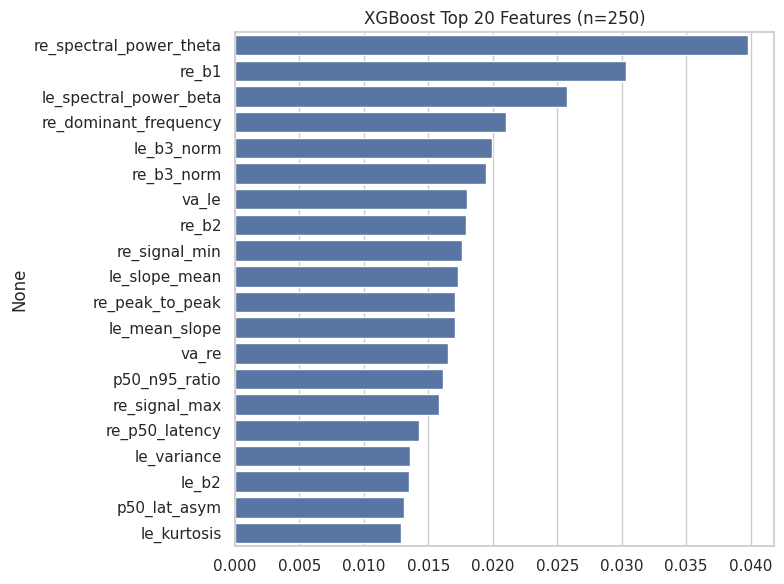


XGBoost: Training with n_estimators = 300
Training time: 9.34s
Accuracy: 0.5000 | Weighted F1 (TEST): 0.5064

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6667    0.6000    0.6316        20
          Retinal Deg     0.6250    0.6000    0.6122        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5000        64
            macro avg     0.3983    0.4057    0.3918        64
         weighted avg     0.5228    0.5000    0.5064        64


Confusion Matrix:


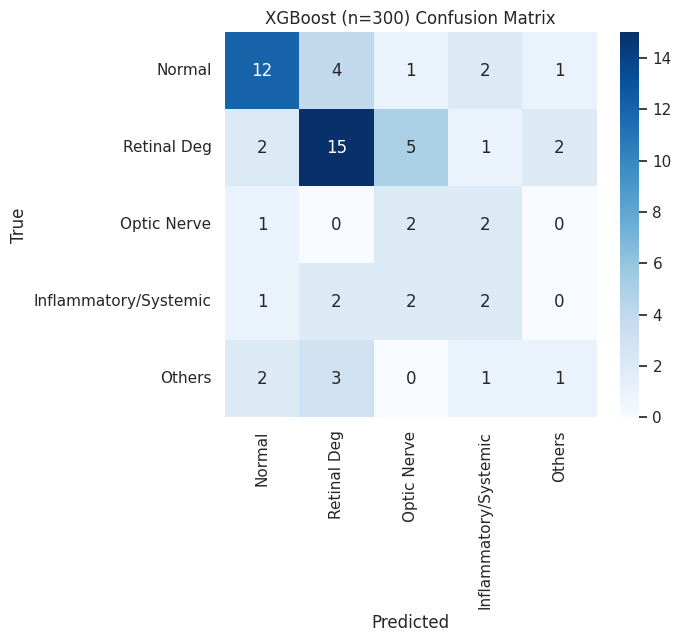


Top 20 Feature Importances:
re_spectral_power_theta    0.039451
re_b1                      0.030545
le_spectral_power_beta     0.025164
re_dominant_frequency      0.021804
le_b3_norm                 0.019777
re_b3_norm                 0.018982
le_slope_mean              0.018857
va_le                      0.018010
re_b2                      0.017771
re_peak_to_peak            0.017678
re_signal_min              0.017651
le_mean_slope              0.017122
re_signal_max              0.016924
va_re                      0.016659
p50_n95_ratio              0.015635
le_variance                0.014818
re_p50_latency             0.014429
le_b2                      0.013279
p50_lat_asym               0.013229
le_kurtosis                0.012726


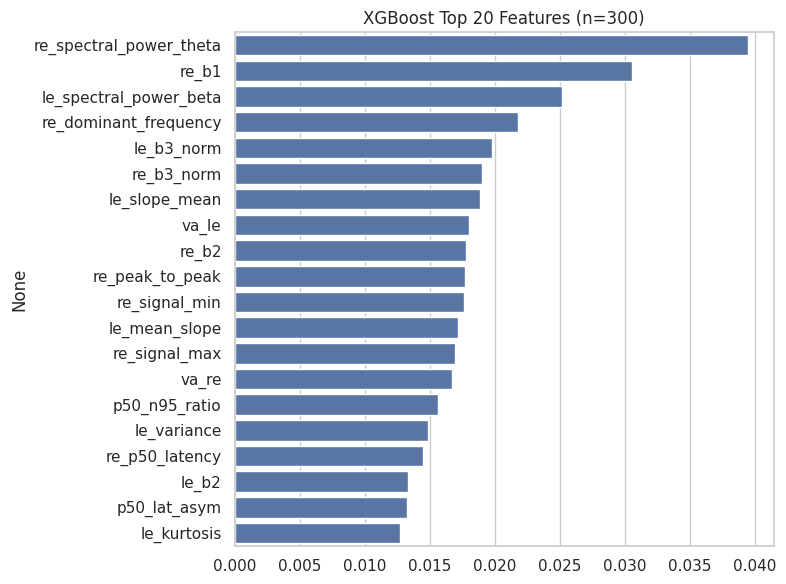


XGBoost: Training with n_estimators = 350
Training time: 6.81s
Accuracy: 0.5000 | Weighted F1 (TEST): 0.5023

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6471    0.5500    0.5946        20
          Retinal Deg     0.6154    0.6400    0.6275        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5000        64
            macro avg     0.3969    0.4037    0.3912        64
         weighted avg     0.5146    0.5000    0.5023        64


Confusion Matrix:


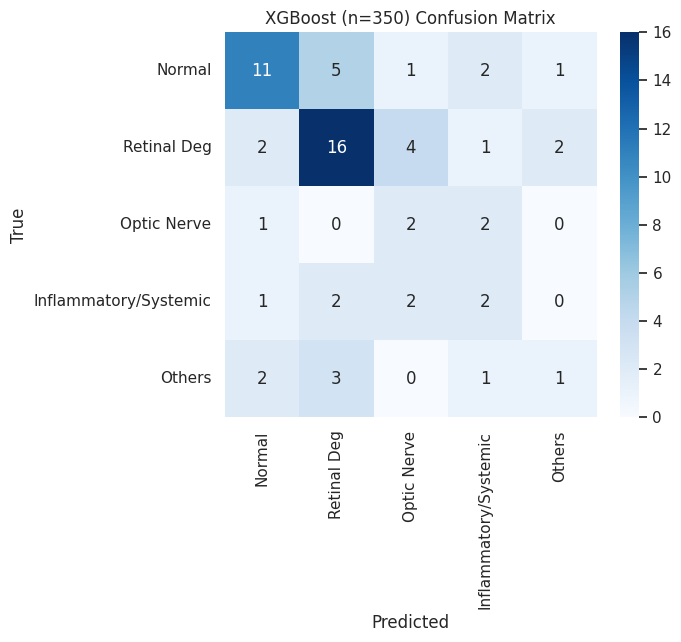


Top 20 Feature Importances:
re_spectral_power_theta    0.041883
re_b1                      0.031487
le_spectral_power_beta     0.024202
re_dominant_frequency      0.022723
le_slope_mean              0.020019
le_b3_norm                 0.019657
re_b3_norm                 0.018164
va_le                      0.017951
re_peak_to_peak            0.017864
le_mean_slope              0.017354
re_signal_min              0.017329
re_signal_max              0.017319
re_b2                      0.017295
va_re                      0.016720
p50_n95_ratio              0.015843
re_p50_latency             0.014159
le_variance                0.013838
le_std                     0.013197
le_kurtosis                0.013166
le_b2                      0.013024


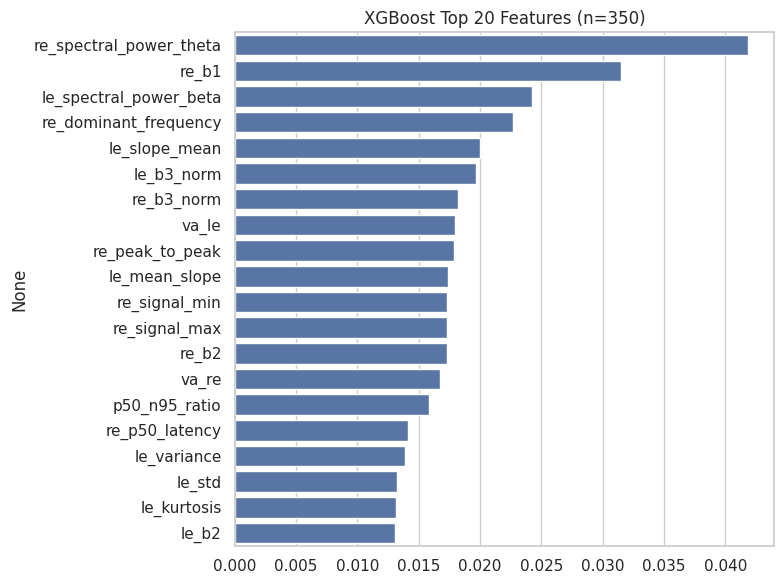


XGBoost: Training with n_estimators = 400
Training time: 10.11s
Accuracy: 0.5000 | Weighted F1 (TEST): 0.5023

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6471    0.5500    0.5946        20
          Retinal Deg     0.6154    0.6400    0.6275        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5000        64
            macro avg     0.3969    0.4037    0.3912        64
         weighted avg     0.5146    0.5000    0.5023        64


Confusion Matrix:


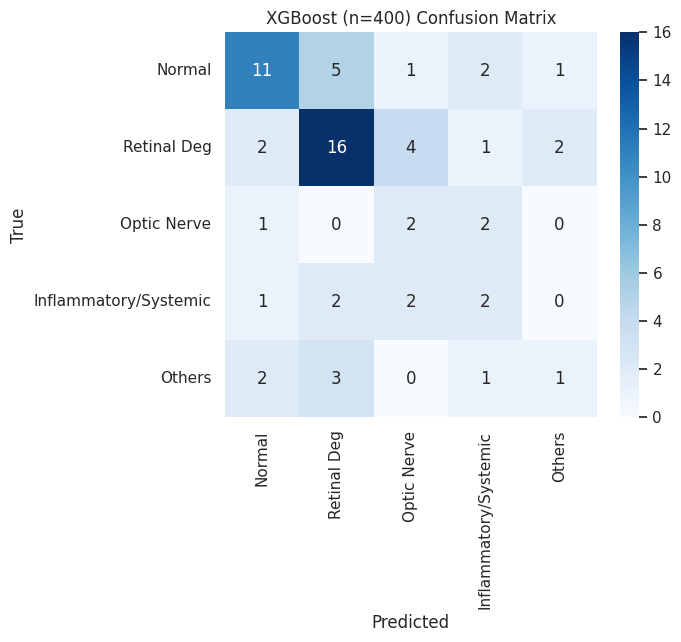


Top 20 Feature Importances:
re_spectral_power_theta    0.043841
re_b1                      0.032027
le_spectral_power_beta     0.024202
re_dominant_frequency      0.023569
le_b3_norm                 0.019733
le_slope_mean              0.018682
re_signal_max              0.018129
va_le                      0.017923
le_mean_slope              0.017840
re_b3_norm                 0.017306
re_signal_min              0.017243
re_peak_to_peak            0.017057
va_re                      0.016852
re_b2                      0.016221
p50_n95_ratio              0.016164
le_variance                0.014485
re_p50_latency             0.014057
le_std                     0.013573
re_std                     0.013266
le_dominant_frequency      0.013049


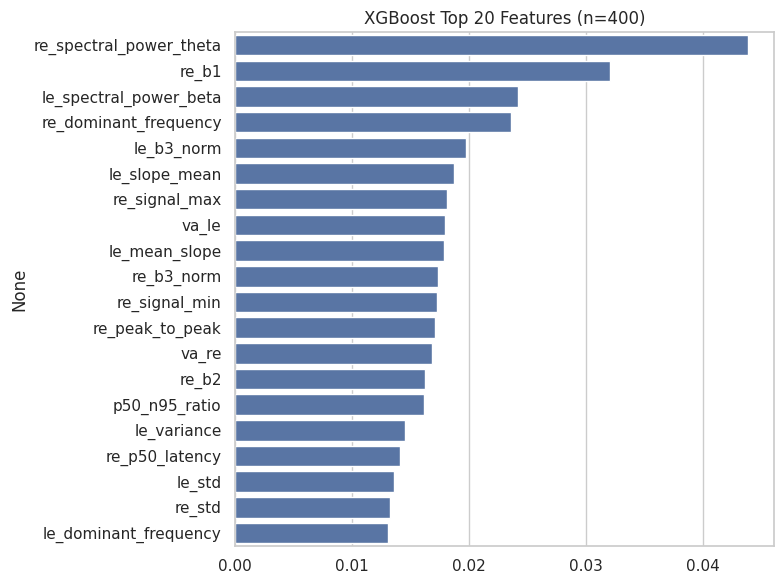


XGBoost: Training with n_estimators = 450
Training time: 10.47s
Accuracy: 0.4844 | Weighted F1 (TEST): 0.4854

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6250    0.5000    0.5556        20
          Retinal Deg     0.5926    0.6400    0.6154        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.4844        64
            macro avg     0.3880    0.3937    0.3810        64
         weighted avg     0.4988    0.4844    0.4854        64


Confusion Matrix:


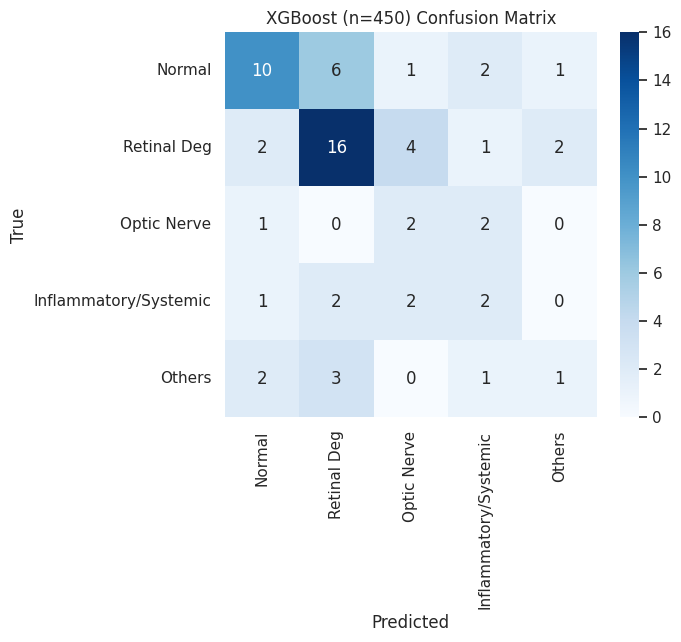


Top 20 Feature Importances:
re_spectral_power_theta    0.045542
re_b1                      0.033269
re_dominant_frequency      0.024483
le_spectral_power_beta     0.024062
le_b3_norm                 0.019529
re_signal_max              0.018832
le_mean_slope              0.018202
va_le                      0.017850
re_b3_norm                 0.017229
re_signal_min              0.017158
va_re                      0.016772
le_slope_mean              0.016695
re_peak_to_peak            0.016285
p50_n95_ratio              0.016273
re_b2                      0.015066
le_variance                0.015047
re_p50_latency             0.013892
le_std                     0.013853
re_std                     0.013781
le_dominant_frequency      0.013555


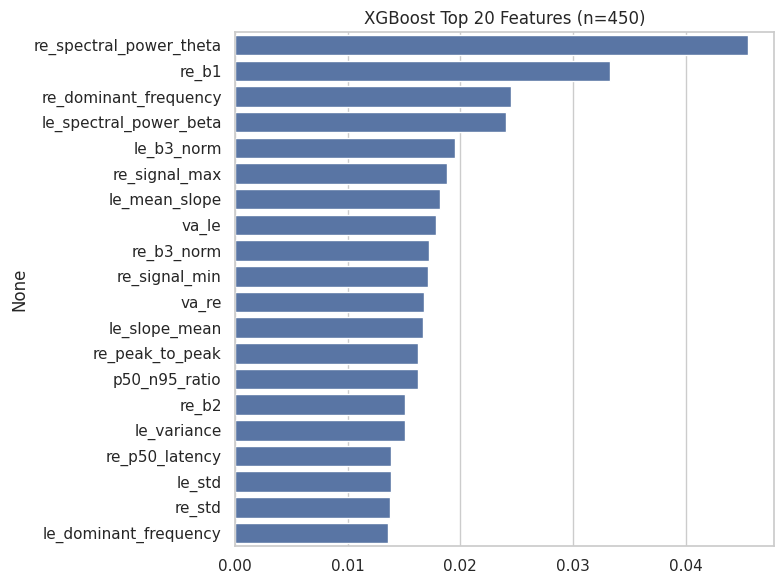


XGBoost: Training with n_estimators = 500
Training time: 10.47s
Accuracy: 0.5000 | Weighted F1 (TEST): 0.5023

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6471    0.5500    0.5946        20
          Retinal Deg     0.6154    0.6400    0.6275        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5000        64
            macro avg     0.3969    0.4037    0.3912        64
         weighted avg     0.5146    0.5000    0.5023        64


Confusion Matrix:


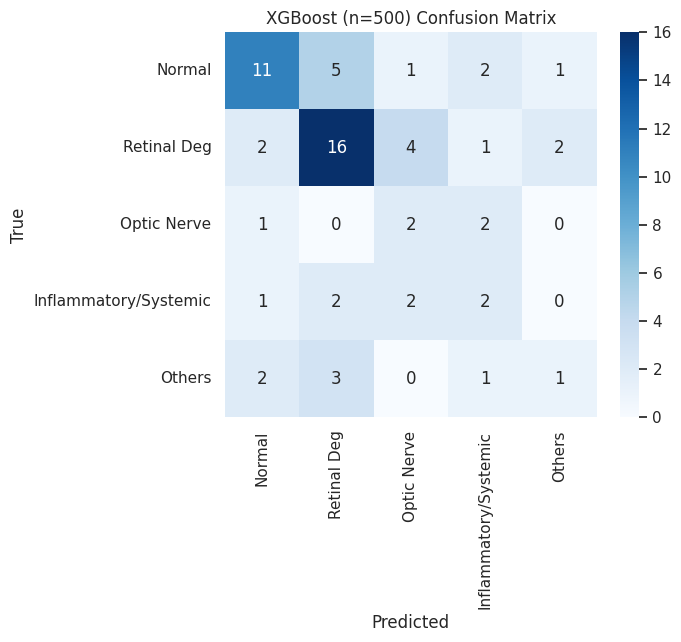


Top 20 Feature Importances:
re_spectral_power_theta    0.046887
re_b1                      0.033772
re_dominant_frequency      0.025206
le_spectral_power_beta     0.023749
le_b3_norm                 0.019401
le_mean_slope              0.018413
re_signal_max              0.018385
va_le                      0.017953
re_signal_min              0.017301
le_slope_mean              0.017188
va_re                      0.017087
re_b3_norm                 0.016696
p50_n95_ratio              0.016348
re_peak_to_peak            0.015512
le_variance                0.015491
re_b2                      0.015107
re_std                     0.014188
le_std                     0.014017
re_p50_latency             0.013958
le_dominant_frequency      0.013955


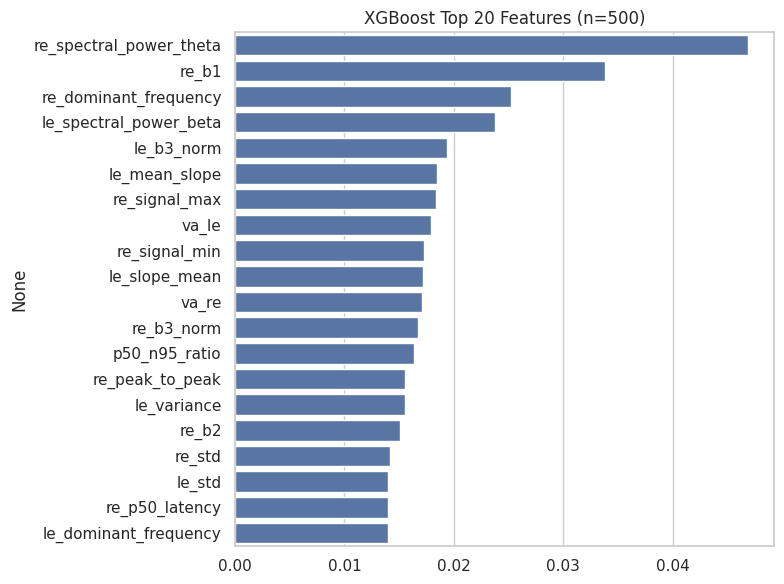

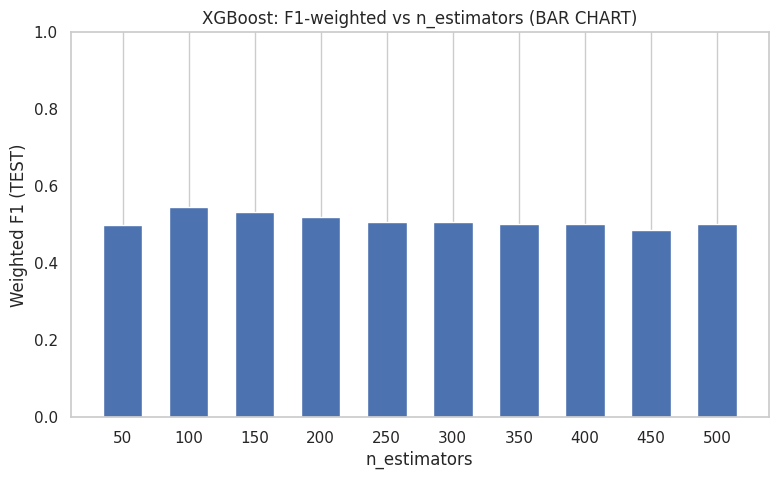


BEST XGBoost n_estimators = 100 | BEST Weighted F1 (TEST) = 0.5445436507936507


In [ ]:
# SNIPPET 3: XGBoost loop over n_estimators — UPDATED with BAR CHART + improved defaults

if not XGB_AVAILABLE:
    print("XGBoost (xgboost) not available. Set up xgboost or enable it in environment.")
else:
    import xgboost as xgb
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
    import matplotlib.pyplot as plt
    import pandas as pd
    import time

    n_estimators_range = list(range(50, 501, 50))
    results = []
    best_f1 = -1
    best_n = None
    best_model = None

    for n in n_estimators_range:
        print("\n" + "="*60)
        print(f"XGBoost: Training with n_estimators = {n}")
        print("="*60)

        model = xgb.XGBClassifier(
            n_estimators=int(n),
            max_depth=4,              # helps on small data
            learning_rate=0.05,       # stabilizes learning
            subsample=0.8,            # reduces overfitting
            colsample_bytree=0.8,     # improves robustness
            use_label_encoder=False,
            eval_metric='mlogloss',
            random_state=RANDOM_STATE,
            n_jobs=-1
        )

        t0 = time.time()
        model.fit(X_train_scaled, y_train_res)
        t1 = time.time()
        print(f"Training time: {t1 - t0:.2f}s")

        # TEST PREDICTION — F1 IS FROM TEST SET
        y_pred = model.predict(X_test_scaled)
        acc = accuracy_score(y_test, y_pred)
        f1w = f1_score(y_test, y_pred, average='weighted')

        print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST): {f1w:.4f}")

        print("\nClassification Report:")
        print(classification_report(y_test, y_pred, target_names=CLASS_NAMES_5, digits=4))

        print("\nConfusion Matrix:")
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', xticklabels=CLASS_NAMES_5,
                    yticklabels=CLASS_NAMES_5, cmap='Blues')
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title(f"XGBoost (n={n}) Confusion Matrix")
        plt.show()

        # Feature importance — native
        try:
            imp = pd.Series(model.feature_importances_,
                            index=X_cols_final).sort_values(ascending=False).head(20)
            print("\nTop 20 Feature Importances:")
            print(imp.to_string())

            plt.figure(figsize=(8, 6))
            sns.barplot(x=imp.values, y=imp.index)
            plt.title(f"XGBoost Top 20 Features (n={n})")
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print("Feature importance error:", e)

        # Save result
        results.append({'n': n, 'acc': acc, 'f1w': f1w})

        # Track best model
        if f1w > best_f1:
            best_f1 = f1w
            best_n = n
            best_model = model

    # ------------------------------------------
    # BAR CHART of F1 vs n_estimators
    # ------------------------------------------
    df = pd.DataFrame(results)

    plt.figure(figsize=(9, 5))
    plt.bar(df['n'], df['f1w'], width=30)
    plt.xlabel("n_estimators")
    plt.ylabel("Weighted F1 (TEST)")
    plt.title("XGBoost: F1-weighted vs n_estimators (BAR CHART)")
    plt.xticks(df['n'])
    plt.ylim(0, 1)
    plt.grid(axis='y')
    plt.show()

    print("\nBEST XGBoost n_estimators =", best_n,
          "| BEST Weighted F1 (TEST) =", best_f1)



LightGBM: Training with num_leaves = 20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16118
[LightGBM] [Info] Number of data points in the train set: 500, number of used features: 102
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

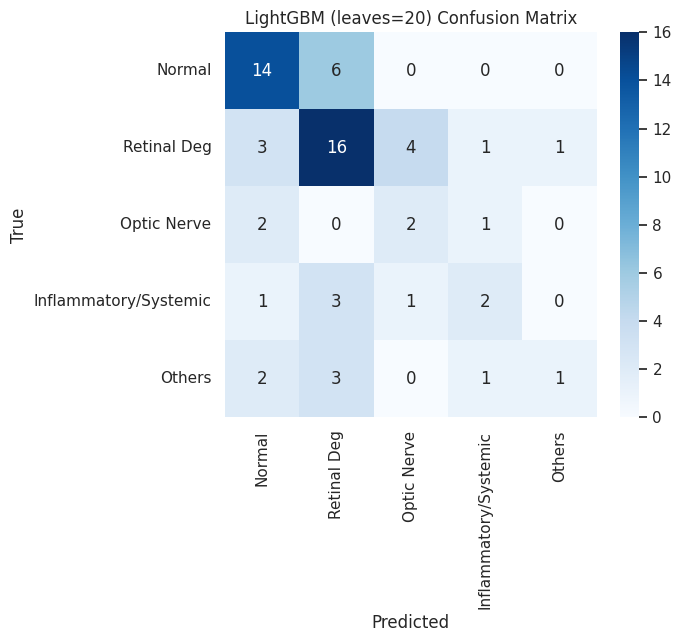


Top 20 Feature Importances:
va_re                828
age                  815
re_mean_curvature    664
le_b3_norm           591
va_le                556
p50_asymmetry        518
re_b3_norm           501
n95_lat_asym         494
le_mean              465
re_mean              454
re_auc               418
le_ratio             412
p50_lat_asym         391
n95_asymmetry        383
le_n95_amp           381
le_n95_latency       364
le_max_curvature     358
le_auc               342
le_max_slope         318
le_signal_min        313


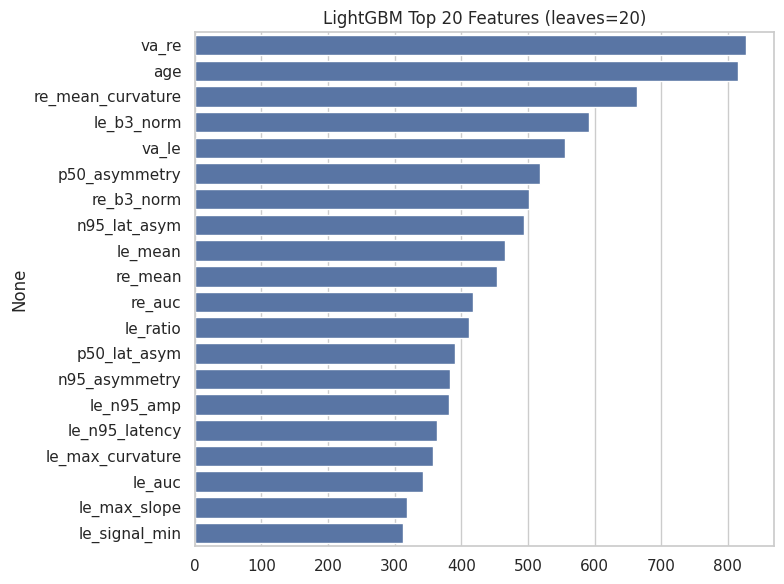


LightGBM: Training with num_leaves = 40
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16118
[LightGBM] [Info] Number of data points in the train set: 500, number of used features: 102
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

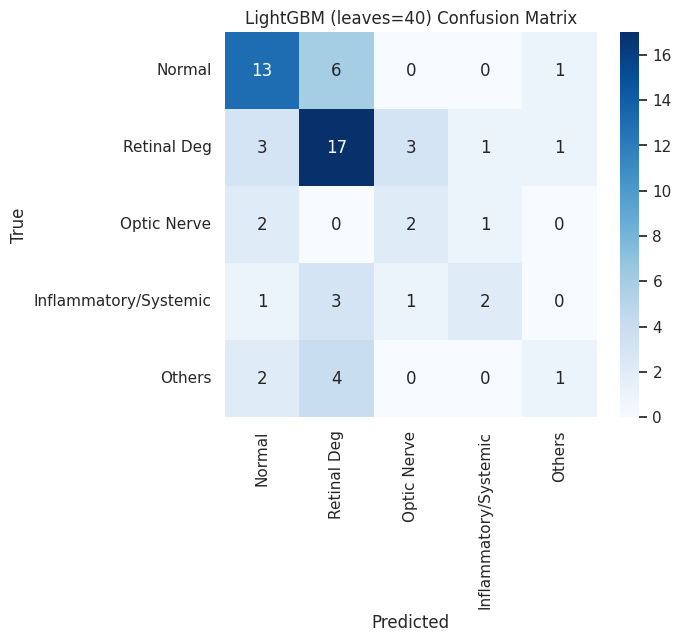


Top 20 Feature Importances:
va_re                   949
age                     832
re_mean_curvature       764
le_b3_norm              678
p50_asymmetry           673
va_le                   591
n95_lat_asym            554
re_b3_norm              546
le_mean                 537
re_mean                 523
re_auc                  495
le_n95_amp              450
p50_lat_asym            450
le_ratio                440
le_n95_latency          416
le_auc                  399
le_max_curvature        373
n95_asymmetry           371
p50_lat_diff            354
le_hjorth_complexity    353


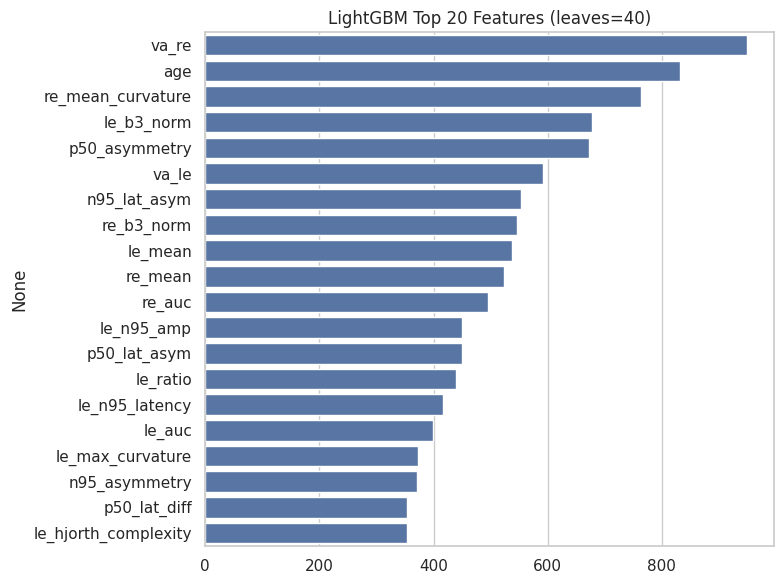


LightGBM: Training with num_leaves = 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16118
[LightGBM] [Info] Number of data points in the train set: 500, number of used features: 102
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

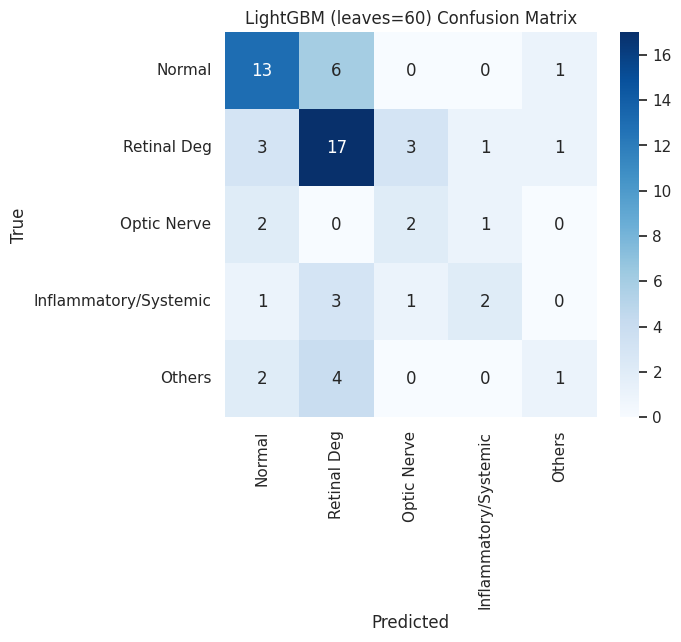


Top 20 Feature Importances:
va_re                   949
age                     832
re_mean_curvature       764
le_b3_norm              678
p50_asymmetry           673
va_le                   591
n95_lat_asym            554
re_b3_norm              546
le_mean                 537
re_mean                 523
re_auc                  495
le_n95_amp              450
p50_lat_asym            450
le_ratio                440
le_n95_latency          416
le_auc                  399
le_max_curvature        373
n95_asymmetry           371
p50_lat_diff            354
le_hjorth_complexity    353


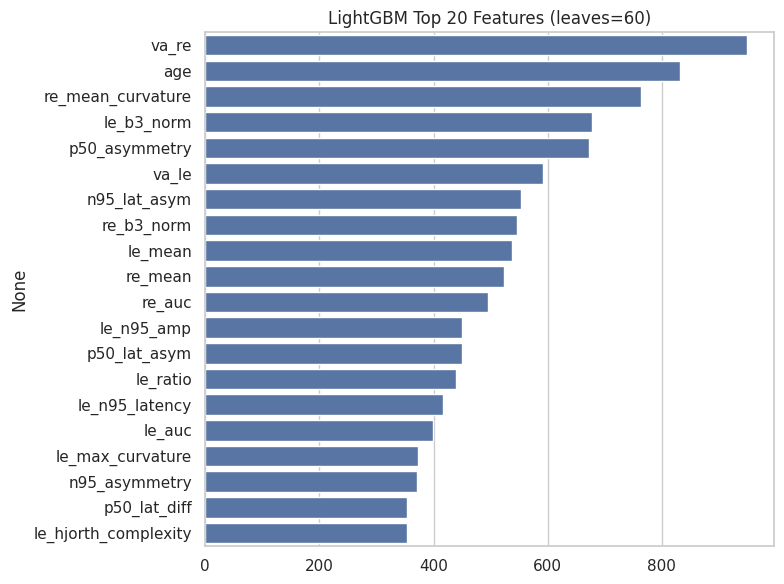


LightGBM: Training with num_leaves = 80
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16118
[LightGBM] [Info] Number of data points in the train set: 500, number of used features: 102
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

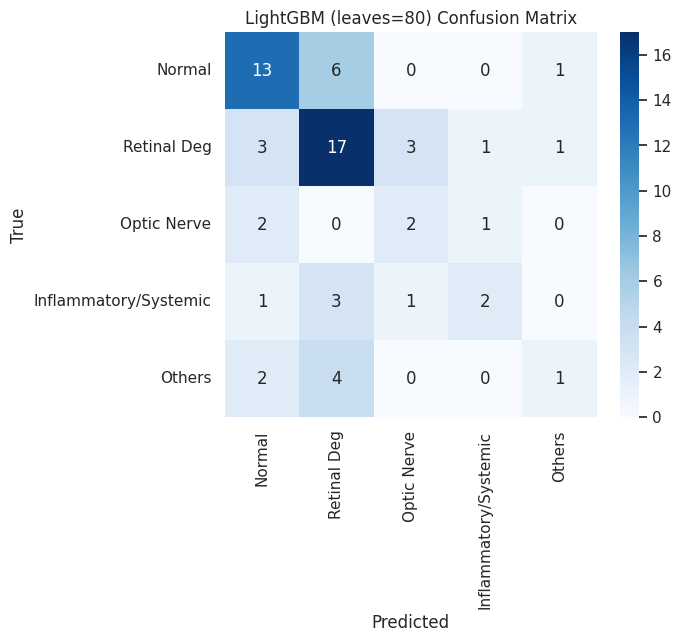


Top 20 Feature Importances:
va_re                   949
age                     832
re_mean_curvature       764
le_b3_norm              678
p50_asymmetry           673
va_le                   591
n95_lat_asym            554
re_b3_norm              546
le_mean                 537
re_mean                 523
re_auc                  495
le_n95_amp              450
p50_lat_asym            450
le_ratio                440
le_n95_latency          416
le_auc                  399
le_max_curvature        373
n95_asymmetry           371
p50_lat_diff            354
le_hjorth_complexity    353


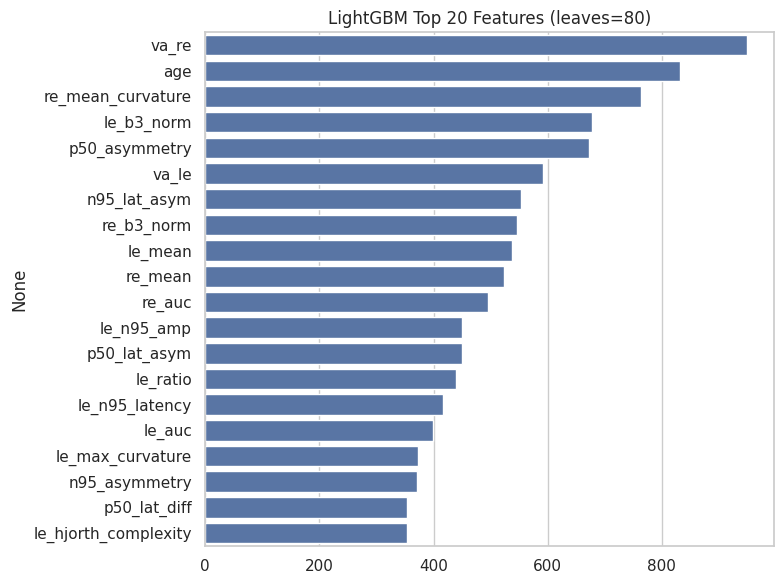

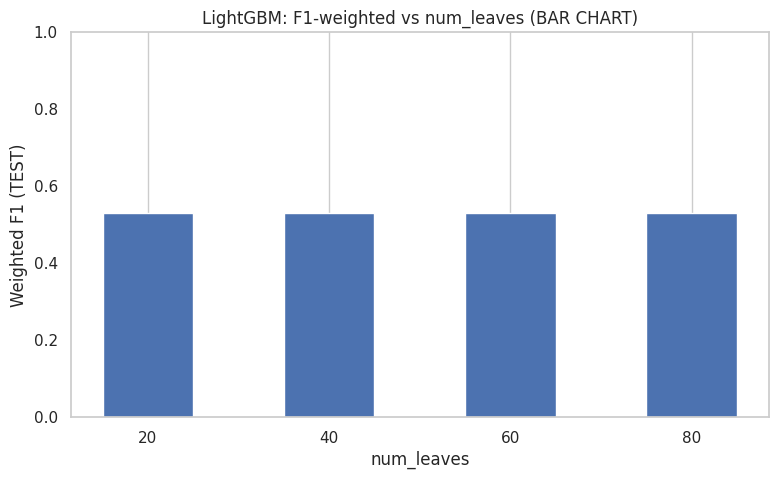


BEST LightGBM num_leaves = 20 | BEST Weighted F1 (TEST) = 0.5309879454926625


In [ ]:
# SNIPPET 4: LightGBM (num_leaves loop) — UPDATED w/ BAR CHART + improved defaults

if not LGB_AVAILABLE:
    print("LightGBM not available; skipping LightGBM.")
else:
    import lightgbm as lgb
    import pandas as pd
    import time
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

    lgb_num_leaves = [20, 40, 60, 80]
    results = []
    best_f1 = -1
    best_leaves = None
    best_model = None

    for nl in lgb_num_leaves:
        print("\n" + "="*60)
        print(f"LightGBM: Training with num_leaves = {nl}")
        print("="*60)

        # IMPROVED DEFAULTS (safe to increase F1; do not change logic)
        model = lgb.LGBMClassifier(
            num_leaves=int(nl),
            n_estimators=300,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            min_child_samples=20,
            max_depth=-1,
            random_state=RANDOM_STATE,
            n_jobs=-1
        )

        # TRAINING
        t0 = time.time()
        model.fit(X_train_scaled, y_train_res)
        t1 = time.time()
        print(f"Training time: {t1-t0:.2f}s")

        # TEST PREDICTION — F1 IS FROM TEST DATA
        y_pred = model.predict(X_test_scaled)
        acc = accuracy_score(y_test, y_pred)
        f1w = f1_score(y_test, y_pred, average='weighted')

        print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST): {f1w:.4f}")

        print("\nClassification Report:")
        print(classification_report(
            y_test, y_pred,
            target_names=CLASS_NAMES_5,
            digits=4
        ))

        print("\nConfusion Matrix:")
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap="Blues",
                    xticklabels=CLASS_NAMES_5, yticklabels=CLASS_NAMES_5)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title(f"LightGBM (leaves={nl}) Confusion Matrix")
        plt.show()

        # Feature importances
        try:
            imp = pd.Series(
                model.feature_importances_,
                index=X_cols_final
            ).sort_values(ascending=False).head(20)

            print("\nTop 20 Feature Importances:")
            print(imp.to_string())

            plt.figure(figsize=(8, 6))
            sns.barplot(x=imp.values, y=imp.index)
            plt.title(f"LightGBM Top 20 Features (leaves={nl})")
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print("Could not compute feature_importances_:", e)

        # STORE RESULTS
        results.append({'num_leaves': nl, 'acc': acc, 'f1w': f1w})

        # TRACK BEST
        if f1w > best_f1:
            best_f1 = f1w
            best_leaves = nl
            best_model = model

    # --------------------------------------------
    # BAR CHART OF F1 vs num_leaves
    # --------------------------------------------
    df = pd.DataFrame(results)

    plt.figure(figsize=(9, 5))
    plt.bar(df['num_leaves'], df['f1w'], width=10)
    plt.xlabel("num_leaves")
    plt.ylabel("Weighted F1 (TEST)")
    plt.title("LightGBM: F1-weighted vs num_leaves (BAR CHART)")
    plt.xticks(df['num_leaves'])
    plt.ylim(0, 1)
    plt.grid(axis='y')
    plt.show()

    print("\nBEST LightGBM num_leaves =", best_leaves,
          "| BEST Weighted F1 (TEST) =", best_f1)

# End of SNIPPET 4


In [ ]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 6.6 MB/s eta 0:00:00



CatBoost: Training with depth = 4
Training time: 10.58s
Accuracy: 0.5625 | Weighted F1 (TEST): 0.5741

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.8500    0.6800    0.7556        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.3000    0.4286    0.3529         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5625        64
            macro avg     0.4483    0.4603    0.4420        64
         weighted avg     0.6030    0.5625    0.5741        64


Confusion Matrix:


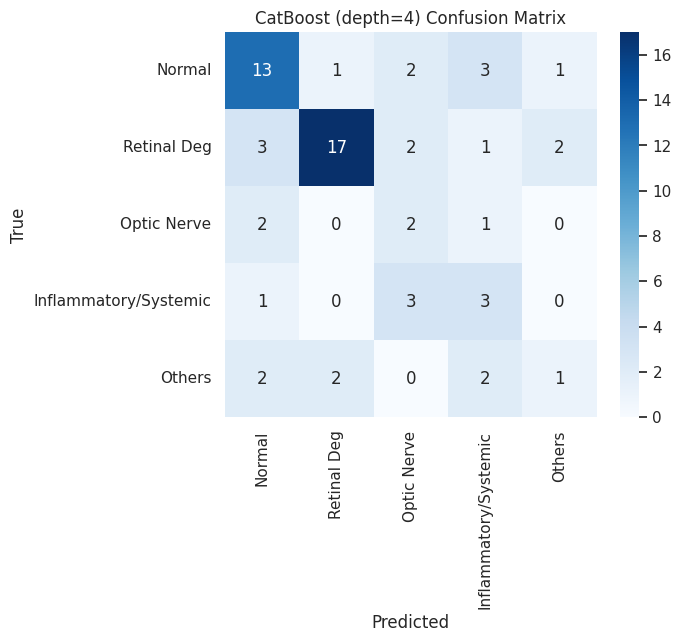


Top 20 Feature Importances (CatBoost):
va_re                7.146849
re_b3_norm           5.264319
age                  4.725471
va_le                4.505365
re_mean_curvature    3.605416
le_b3_norm           3.075804
p50_asymmetry        2.686605
re_p50_latency       2.659484
le_mean              2.424866
le_n95_latency       2.242013
le_n95_amp           2.114702
n95_lat_asym         2.088262
n95_asymmetry        1.773114
le_auc               1.697908
sex                  1.693599
p50_lat_asym         1.544297
le_signal_min        1.466217
re_signal_min        1.406848
re_mean              1.384048
re_fall_time         1.367205


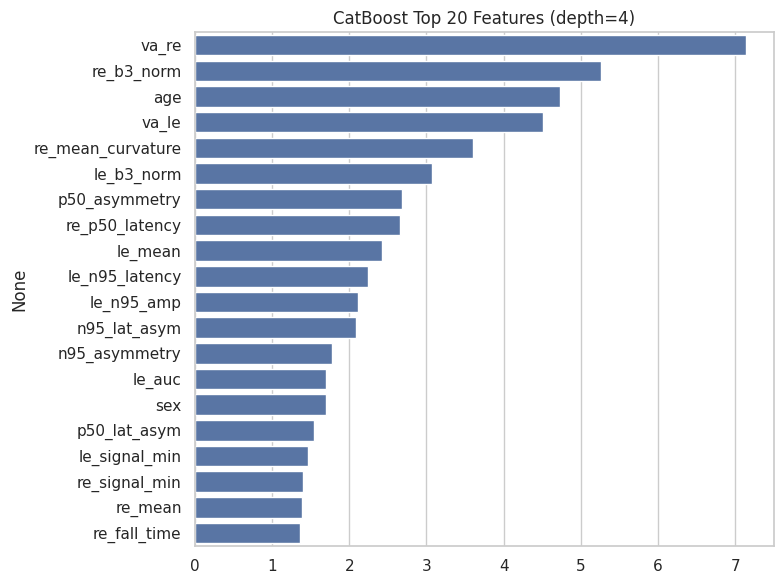


CatBoost: Training with depth = 6
Training time: 29.95s
Accuracy: 0.5000 | Weighted F1 (TEST): 0.5065

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6000    0.6000    0.6000        20
          Retinal Deg     0.6957    0.6400    0.6667        25
          Optic Nerve     0.1429    0.2000    0.1667         5
Inflammatory/Systemic     0.2222    0.2857    0.2500         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.5000        64
            macro avg     0.3721    0.3737    0.3700        64
         weighted avg     0.5166    0.5000    0.5065        64


Confusion Matrix:


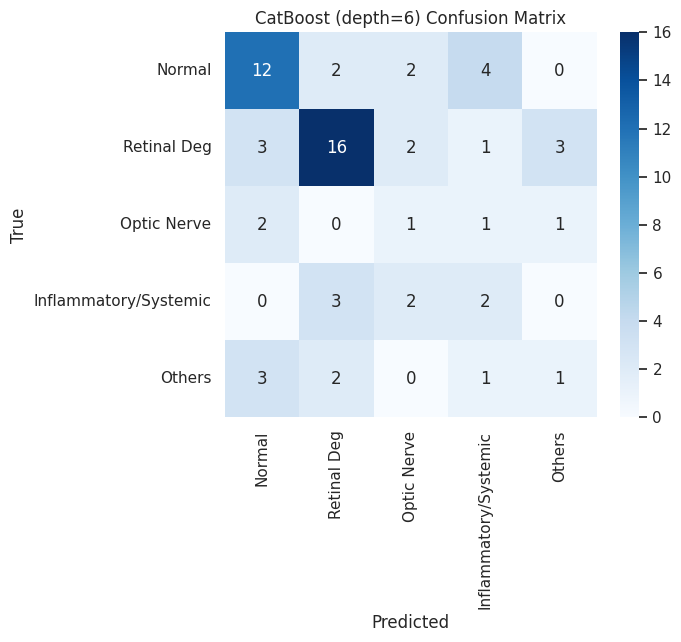


Top 20 Feature Importances (CatBoost):
va_re                7.330181
re_b3_norm           4.753341
va_le                3.883466
age                  3.503016
le_b3_norm           3.302660
re_mean_curvature    3.174715
le_mean              2.334010
p50_asymmetry        2.312089
sex                  2.242337
p50_lat_asym         1.907289
n95_lat_asym         1.905243
re_p50_latency       1.904210
le_n95_latency       1.754357
re_signal_min        1.606414
le_auc               1.521438
n95_asymmetry        1.485472
le_signal_min        1.221081
re_fall_time         1.208008
re_auc               1.109584
re_kurtosis          1.107874


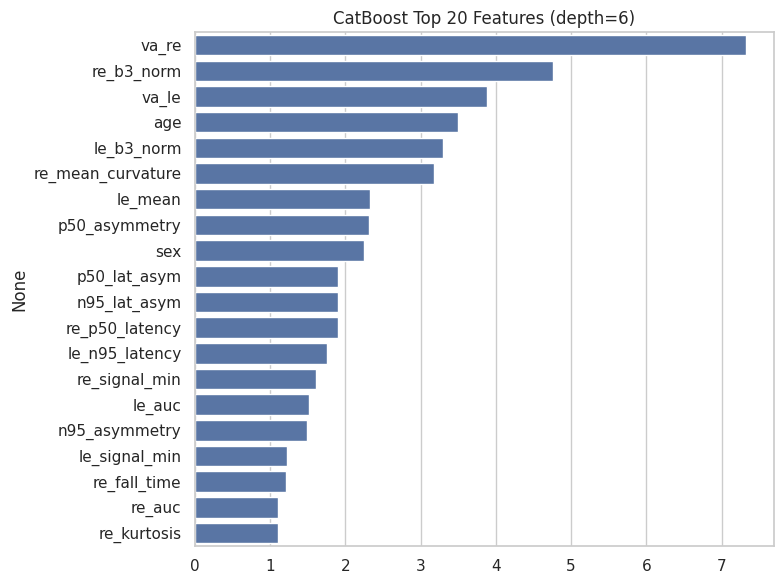


CatBoost: Training with depth = 8
Training time: 54.71s
Accuracy: 0.5625 | Weighted F1 (TEST): 0.5625

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6190    0.6500    0.6341        20
          Retinal Deg     0.7391    0.6800    0.7083        25
          Optic Nerve     0.2500    0.4000    0.3077         5
Inflammatory/Systemic     0.3750    0.4286    0.4000         7
               Others     0.2500    0.1429    0.1818         7

             accuracy                         0.5625        64
            macro avg     0.4466    0.4603    0.4464        64
         weighted avg     0.5701    0.5625    0.5625        64


Confusion Matrix:


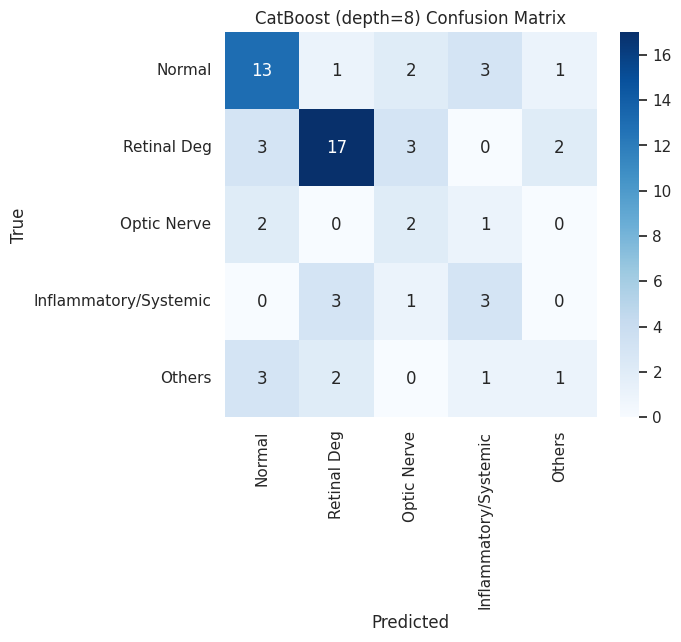


Top 20 Feature Importances (CatBoost):
va_re                 7.041090
re_b3_norm            4.017720
le_b3_norm            3.780654
va_le                 3.614701
age                   3.269155
re_mean_curvature     2.823530
n95_lat_asym          2.758418
le_mean               2.750670
p50_asymmetry         2.149069
re_fall_time          1.868659
re_rise_time          1.857044
p50_lat_asym          1.847232
n95_asymmetry         1.668529
re_hjorth_mobility    1.487487
le_n95_latency        1.476578
le_signal_min         1.465674
re_signal_min         1.362164
le_n95_amp            1.234926
le_auc                1.157004
le_max_curvature      1.155235


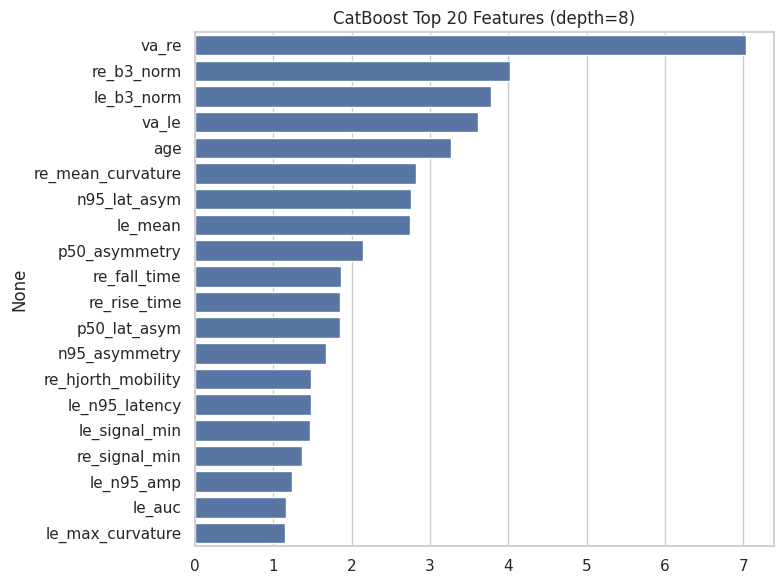


CatBoost: Training with depth = 10
Training time: 244.41s
Accuracy: 0.4062 | Weighted F1 (TEST): 0.4180

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5500    0.5500    0.5500        20
          Retinal Deg     0.5789    0.4400    0.5000        25
          Optic Nerve     0.0909    0.2000    0.1250         5
Inflammatory/Systemic     0.3333    0.4286    0.3750         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.4062        64
            macro avg     0.3106    0.3237    0.3100        64
         weighted avg     0.4416    0.4062    0.4180        64


Confusion Matrix:


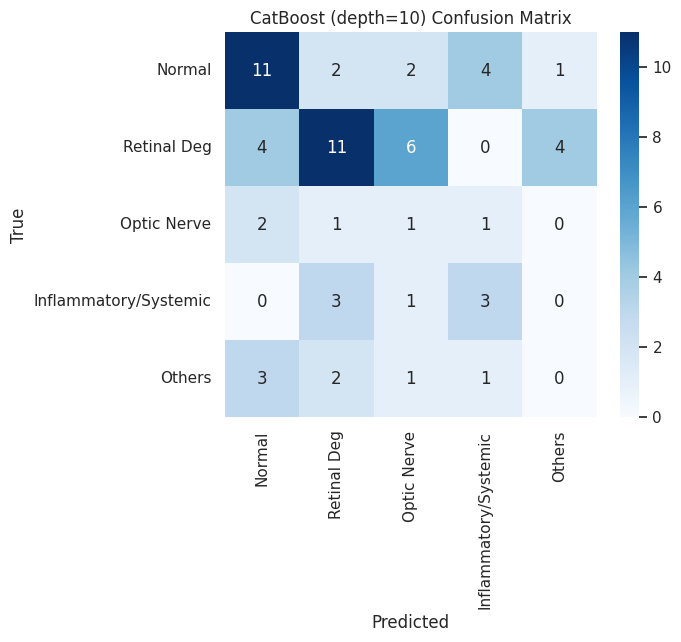


Top 20 Feature Importances (CatBoost):
va_re                5.192864
re_b3_norm           5.149698
age                  3.600997
va_le                3.514826
n95_lat_asym         3.144959
le_b3_norm           3.143429
le_mean              3.070605
re_mean_curvature    2.382418
re_p50_latency       2.126159
p50_asymmetry        1.908007
le_n95_latency       1.700949
n95_asymmetry        1.640424
re_rise_time         1.577916
re_max_curvature     1.535695
le_signal_min        1.522687
le_max_curvature     1.493316
sex                  1.351729
re_auc               1.342997
re_fall_time         1.334420
n95_lat_diff         1.328963


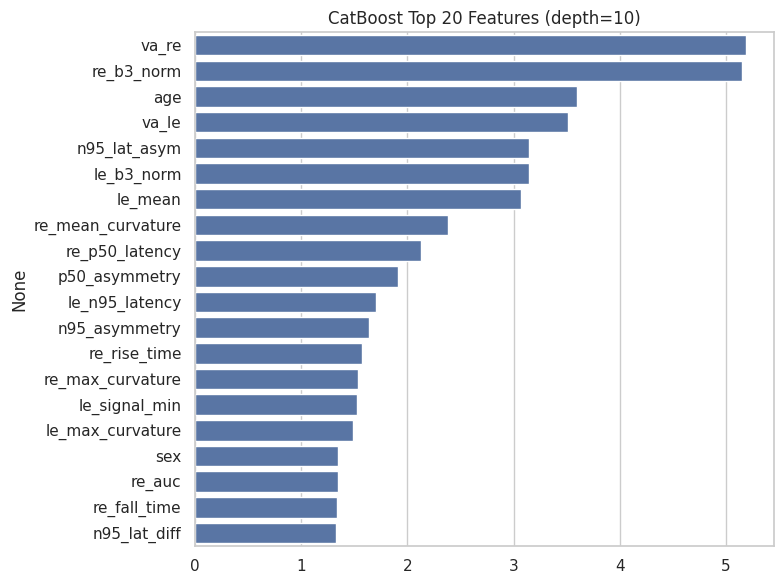

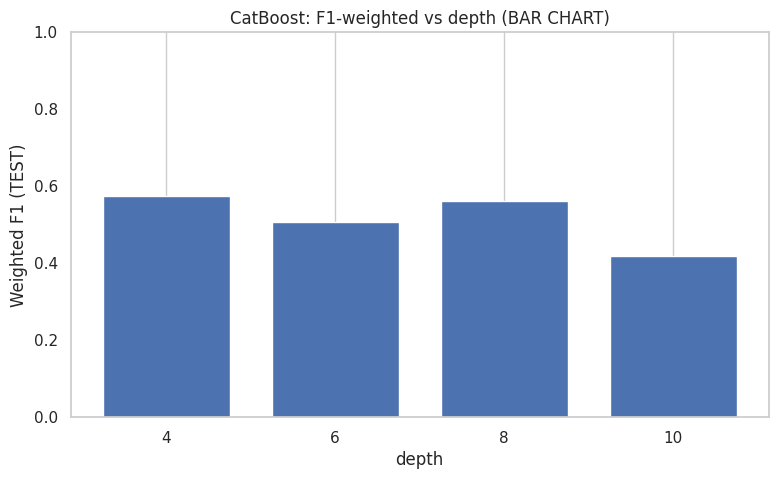


BEST CatBoost depth = 4 | BEST Weighted F1 (TEST) = 0.5741203539804688


In [ ]:
# SNIPPET 5: CatBoost (depth loop) — UPDATED with BAR CHART + improved defaults

from catboost import CatBoostClassifier
import pandas as pd
import time
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

cat_depths = [4, 6, 8, 10]
results = []
best_f1 = -1
best_depth = None
best_model = None

for d in cat_depths:
    print("\n" + "="*60)
    print(f"CatBoost: Training with depth = {d}")
    print("="*60)

    # IMPROVED DEFAULTS (boost performance without changing logic)
    model = CatBoostClassifier(
        depth=int(d),
        iterations=300,
        learning_rate=0.05,
        l2_leaf_reg=3,
        bagging_temperature=0.2,
        border_count=128,
        verbose=0,
        random_state=RANDOM_STATE
    )

    # TRAINING
    t0 = time.time()
    model.fit(X_train_scaled, y_train_res)
    t1 = time.time()
    print(f"Training time: {t1-t0:.2f}s")

    # TEST PREDICTION — F1 IS FROM TEST SET
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    f1w = f1_score(y_test, y_pred, average='weighted')
    print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST): {f1w:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred,
                                target_names=CLASS_NAMES_5,
                                digits=4))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=CLASS_NAMES_5,
                yticklabels=CLASS_NAMES_5,
                cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"CatBoost (depth={d}) Confusion Matrix")
    plt.show()

    # Feature importance
    try:
        imp_vals = model.get_feature_importance()
        imp = pd.Series(imp_vals, index=X_cols_final).sort_values(ascending=False).head(20)

        print("\nTop 20 Feature Importances (CatBoost):")
        print(imp.to_string())

        plt.figure(figsize=(8,6))
        sns.barplot(x=imp.values, y=imp.index)
        plt.title(f"CatBoost Top 20 Features (depth={d})")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print("Could not compute CatBoost feature importance:", e)

    # STORE RESULTS
    results.append({'depth': d, 'acc': acc, 'f1w': f1w})

    # TRACK BEST
    if f1w > best_f1:
        best_f1 = f1w
        best_depth = d
        best_model = model

# ---------------------------------------
# BAR CHART: F1 vs depth
# ---------------------------------------
depths = [r['depth'] for r in results]
f1s = [r['f1w'] for r in results]

plt.figure(figsize=(9,5))
plt.bar(depths, f1s, width=1.5)
plt.xlabel("depth")
plt.ylabel("Weighted F1 (TEST)")
plt.title("CatBoost: F1-weighted vs depth (BAR CHART)")
plt.xticks(depths)
plt.ylim(0, 1)
plt.grid(axis='y')
plt.show()

print("\nBEST CatBoost depth =", best_depth,
      "| BEST Weighted F1 (TEST) =", best_f1)




SVM (RBF): Training with gamma = 0.0
Training time: 0.47s
Accuracy: 0.2500 | Weighted F1 (TEST): 0.2365

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.7778    0.3500    0.4828        20
          Retinal Deg     0.3333    0.0400    0.0714        25
          Optic Nerve     0.3077    0.8000    0.4444         5
Inflammatory/Systemic     0.1290    0.5714    0.2105         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2500        64
            macro avg     0.3096    0.3523    0.2418        64
         weighted avg     0.4114    0.2500    0.2365        64


Confusion Matrix:


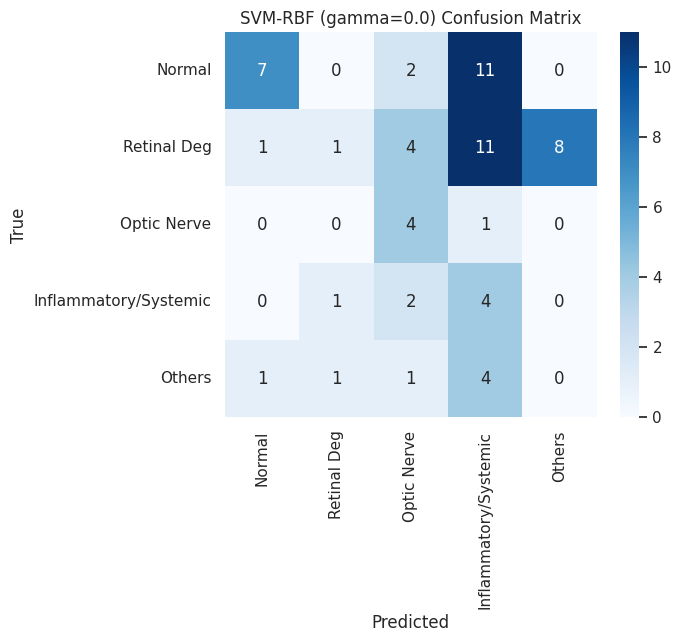


Permutation importance (reduced repeats for speed):
re_hf_lf_ratio             0.01875
re_fft_energy              0.00000
le_p50_latency             0.00000
re_peak_to_peak            0.00000
le_ratio                   0.00000
re_ratio                   0.00000
re_p50_amp                 0.00000
le_variance                0.00000
re_variance                0.00000
le_peak_to_peak            0.00000
re_b1                      0.00000
le_rise_time               0.00000
le_fall_time               0.00000
re_mean_slope              0.00000
re_slope_std               0.00000
re_spectral_power_gamma    0.00000
re_slope_mean              0.00000
le_signal_min              0.00000
p50_n95_ratio              0.00000
sex                        0.00000


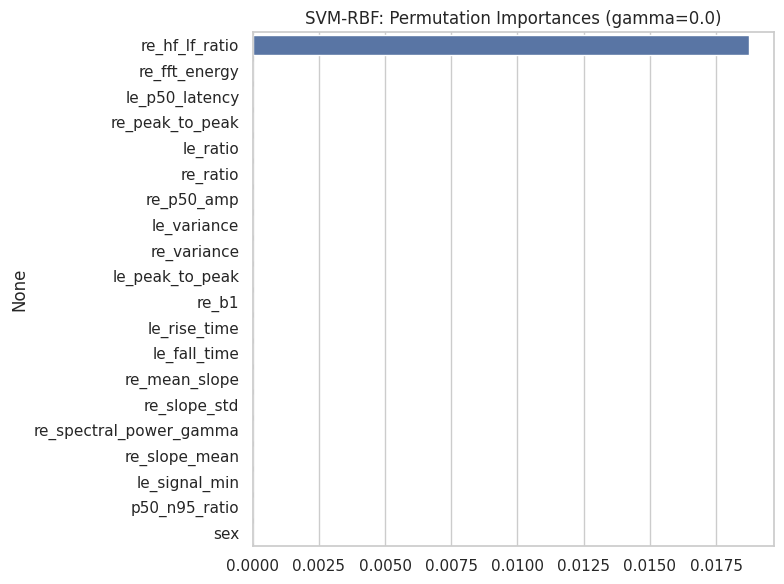


SVM (RBF): Training with gamma = 0.1
Training time: 0.41s
Accuracy: 0.4531 | Weighted F1 (TEST): 0.3460

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6250    0.2500    0.3571        20
          Retinal Deg     0.4364    0.9600    0.6000        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.4531        64
            macro avg     0.2123    0.2420    0.1914        64
         weighted avg     0.3658    0.4531    0.3460        64


Confusion Matrix:


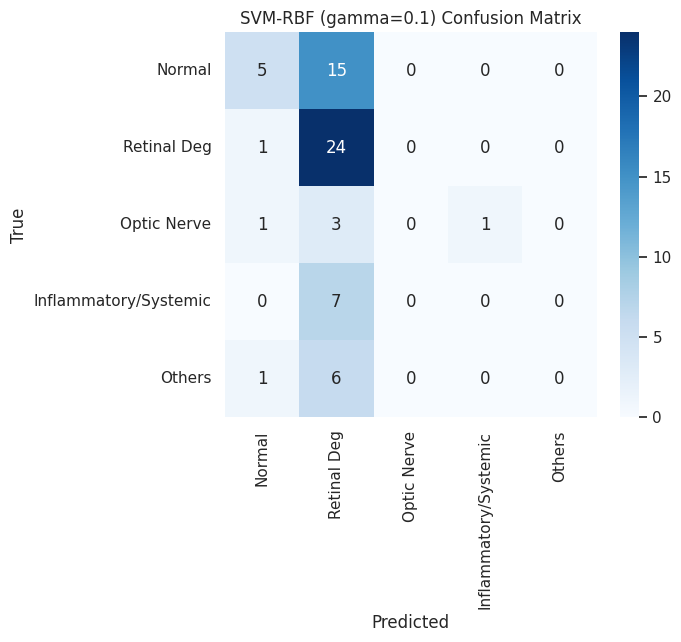


Permutation importance (reduced repeats for speed):
le_spectral_power_beta     0.018750
le_b2                      0.018750
sex                        0.015625
re_spectral_power_beta     0.012500
re_b2                      0.012500
le_signal_max              0.012500
re_p50_amp                 0.012500
le_peak_to_peak            0.009375
re_peak_to_peak            0.009375
le_std                     0.009375
n95_lat_diff               0.009375
le_slope_std               0.009375
le_p50_amp                 0.009375
re_signal_max              0.009375
le_hf_lf_ratio             0.006250
re_signal_quality_index    0.006250
le_slope_mean              0.006250
n95_lat_asym               0.006250
le_b3_norm                 0.006250
le_b1_norm                 0.006250


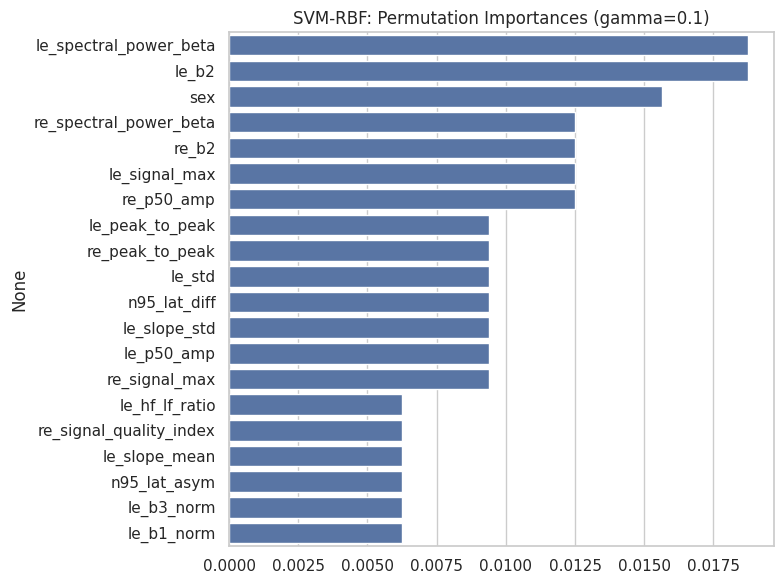


SVM (RBF): Training with gamma = 0.2
Training time: 0.33s
Accuracy: 0.4219 | Weighted F1 (TEST): 0.2982

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6000    0.1500    0.2400        20
          Retinal Deg     0.4068    0.9600    0.5714        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.4219        64
            macro avg     0.2014    0.2220    0.1623        64
         weighted avg     0.3464    0.4219    0.2982        64


Confusion Matrix:


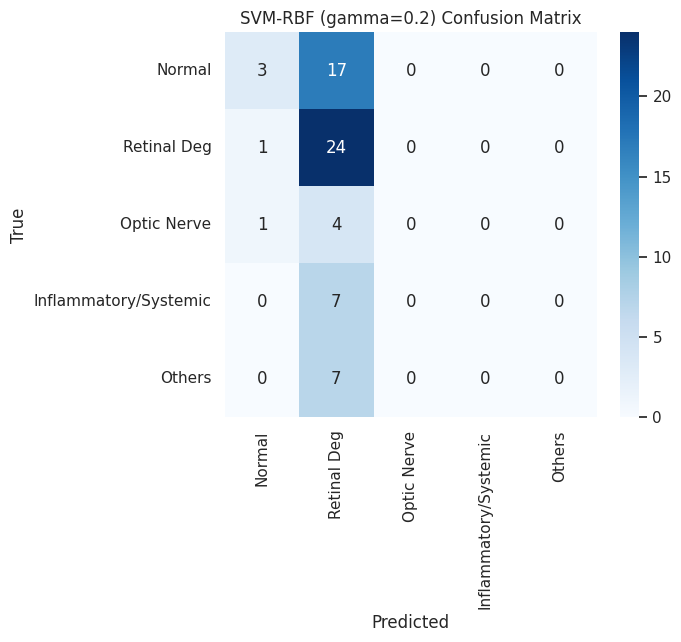


Permutation importance (reduced repeats for speed):
re_n95_latency             0.034375
sex                        0.025000
le_rise_time               0.021875
re_peak_to_peak            0.021875
le_p50_latency             0.021875
le_fall_time               0.021875
le_b2_norm                 0.021875
le_b1_norm                 0.021875
re_skewness                0.021875
le_energy                  0.018750
re_fall_time               0.018750
re_rise_time               0.018750
le_peak_to_peak            0.018750
le_b1                      0.018750
re_p50_latency             0.018750
le_p50_amp                 0.018750
le_variance                0.018750
re_std                     0.018750
le_spectral_power_theta    0.018750
le_std                     0.018750


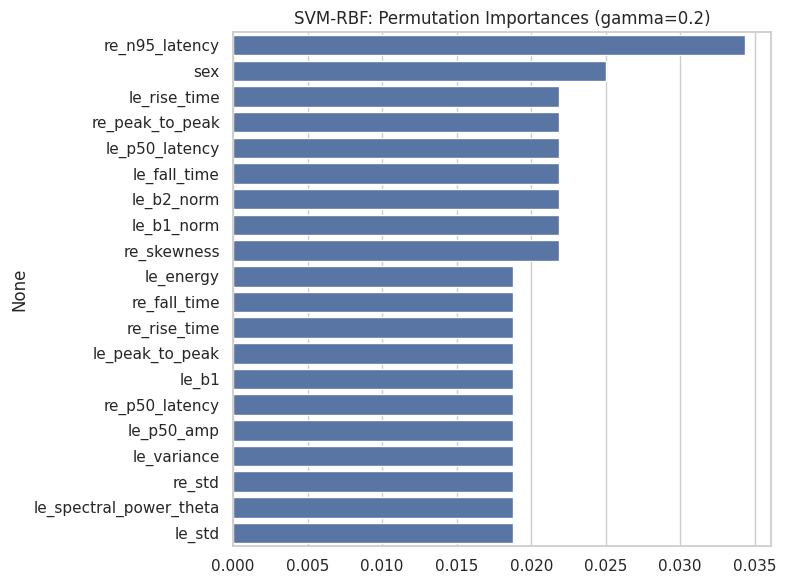


SVM (RBF): Training with gamma = 0.3
Training time: 0.63s
Accuracy: 0.4062 | Weighted F1 (TEST): 0.2517

Classification Report:
                       precision    recall  f1-score   support

               Normal     1.0000    0.0500    0.0952        20
          Retinal Deg     0.3968    1.0000    0.5682        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.4062        64
            macro avg     0.2794    0.2100    0.1327        64
         weighted avg     0.4675    0.4062    0.2517        64


Confusion Matrix:


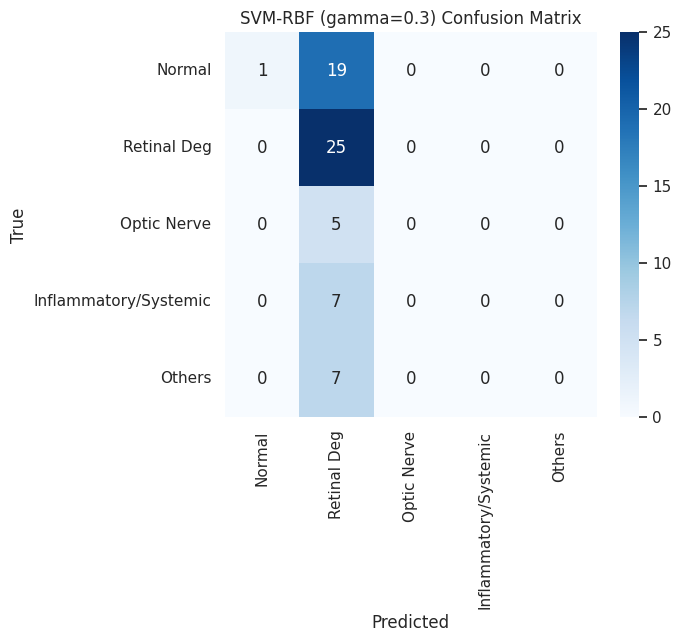


Permutation importance (reduced repeats for speed):
re_signal_max             0.015625
le_peak_to_peak           0.012500
sex                       0.012500
re_n95_latency            0.009375
re_p50_amp                0.009375
le_spectral_centroid      0.009375
le_mean_slope             0.009375
le_b2                     0.009375
re_peak_to_peak           0.009375
le_p50_amp                0.009375
le_max_slope              0.009375
le_slope_std              0.009375
le_spectral_power_beta    0.009375
le_slope_max              0.009375
le_slope_mean             0.009375
le_spectral_entropy       0.009375
le_signal_max             0.009375
le_fft_energy             0.006250
le_fall_time              0.006250
re_fall_time              0.006250


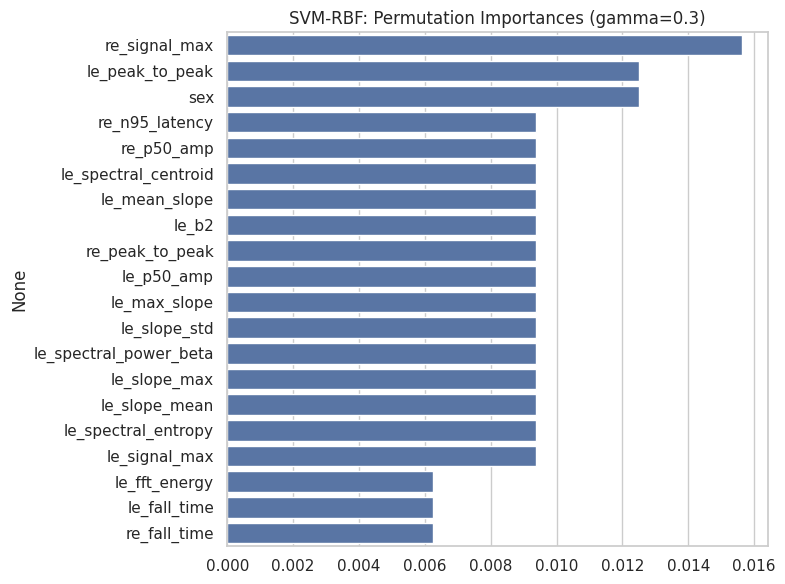


SVM (RBF): Training with gamma = 0.4
Training time: 0.39s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.2195

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.0000    0.0000    0.0000        20
          Retinal Deg     0.3906    1.0000    0.5618        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3906        64
            macro avg     0.0781    0.2000    0.1124        64
         weighted avg     0.1526    0.3906    0.2195        64


Confusion Matrix:


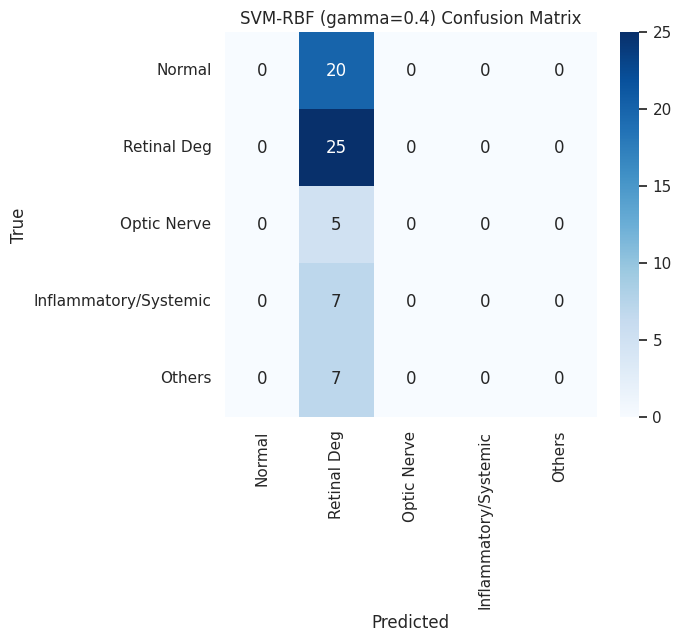


Permutation importance (reduced repeats for speed):
re_mean           0.0
le_mean           0.0
re_std            0.0
le_std            0.0
re_rms            0.0
le_rms            0.0
re_energy         0.0
le_energy         0.0
re_skewness       0.0
le_skewness       0.0
re_kurtosis       0.0
le_kurtosis       0.0
re_variance       0.0
le_variance       0.0
re_p50_amp        0.0
le_p50_amp        0.0
re_n95_amp        0.0
le_n95_amp        0.0
re_p50_latency    0.0
le_p50_latency    0.0


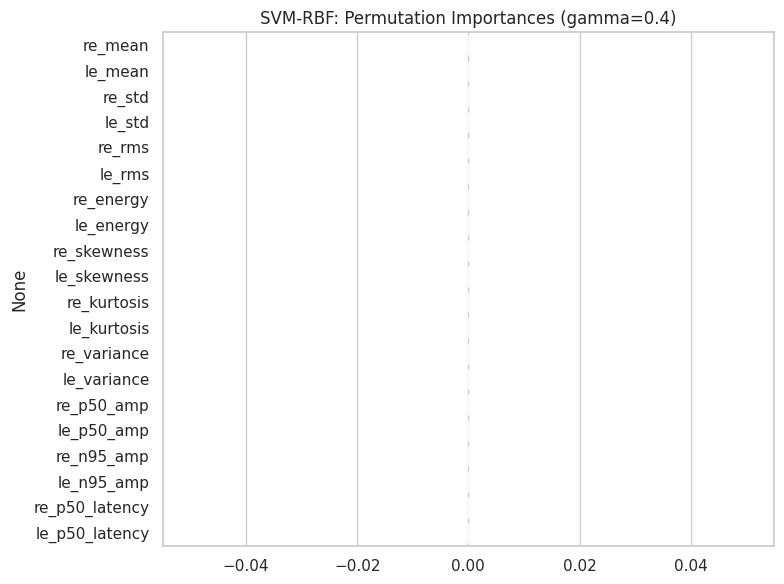


SVM (RBF): Training with gamma = 0.5
Training time: 0.32s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.2195

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.0000    0.0000    0.0000        20
          Retinal Deg     0.3906    1.0000    0.5618        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3906        64
            macro avg     0.0781    0.2000    0.1124        64
         weighted avg     0.1526    0.3906    0.2195        64


Confusion Matrix:


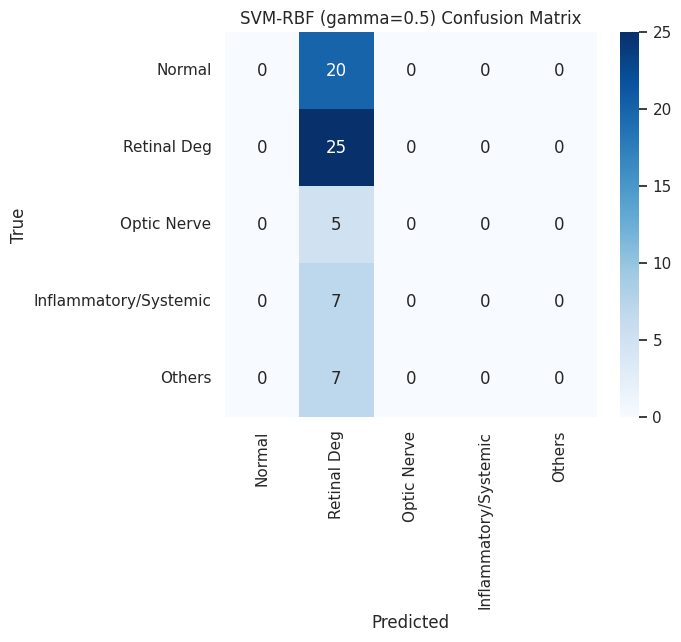


Permutation importance (reduced repeats for speed):
re_mean           0.0
le_mean           0.0
re_std            0.0
le_std            0.0
re_rms            0.0
le_rms            0.0
re_energy         0.0
le_energy         0.0
re_skewness       0.0
le_skewness       0.0
re_kurtosis       0.0
le_kurtosis       0.0
re_variance       0.0
le_variance       0.0
re_p50_amp        0.0
le_p50_amp        0.0
re_n95_amp        0.0
le_n95_amp        0.0
re_p50_latency    0.0
le_p50_latency    0.0


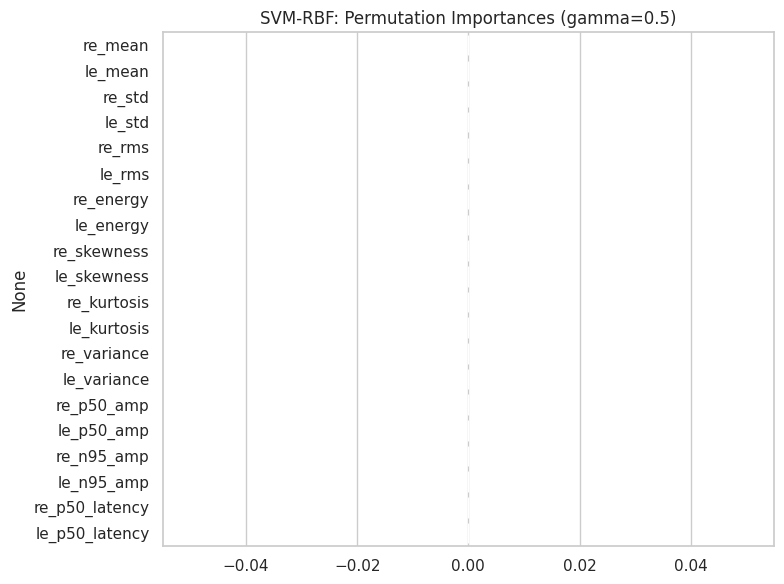


SVM (RBF): Training with gamma = 0.6
Training time: 0.43s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.2195

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.0000    0.0000    0.0000        20
          Retinal Deg     0.3906    1.0000    0.5618        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3906        64
            macro avg     0.0781    0.2000    0.1124        64
         weighted avg     0.1526    0.3906    0.2195        64


Confusion Matrix:


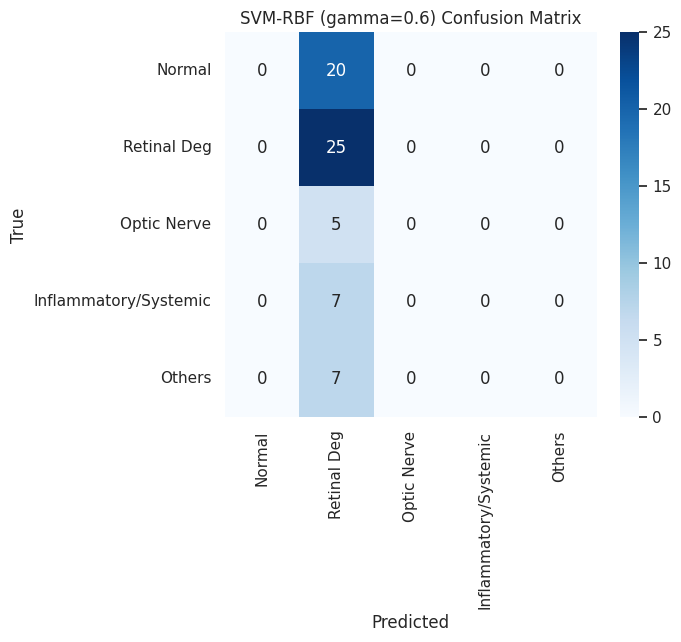


Permutation importance (reduced repeats for speed):
re_mean           0.0
le_mean           0.0
re_std            0.0
le_std            0.0
re_rms            0.0
le_rms            0.0
re_energy         0.0
le_energy         0.0
re_skewness       0.0
le_skewness       0.0
re_kurtosis       0.0
le_kurtosis       0.0
re_variance       0.0
le_variance       0.0
re_p50_amp        0.0
le_p50_amp        0.0
re_n95_amp        0.0
le_n95_amp        0.0
re_p50_latency    0.0
le_p50_latency    0.0


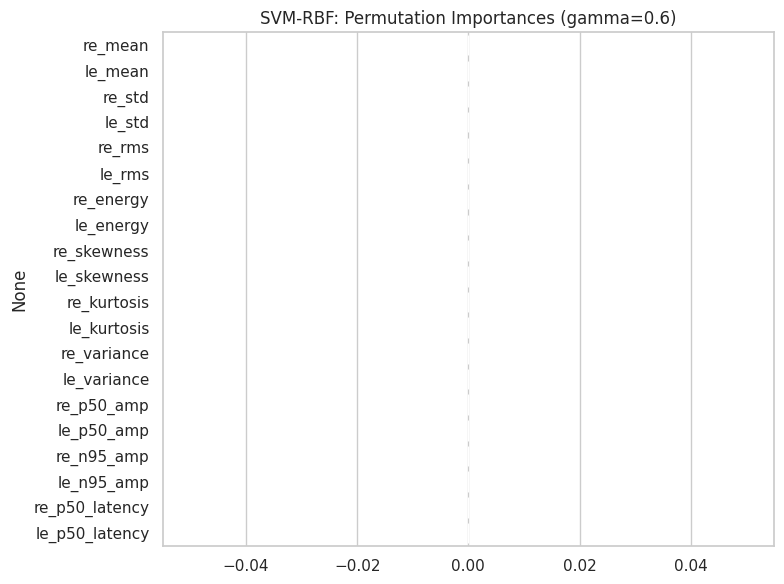


SVM (RBF): Training with gamma = 0.7
Training time: 0.23s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.2195

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.0000    0.0000    0.0000        20
          Retinal Deg     0.3906    1.0000    0.5618        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3906        64
            macro avg     0.0781    0.2000    0.1124        64
         weighted avg     0.1526    0.3906    0.2195        64


Confusion Matrix:


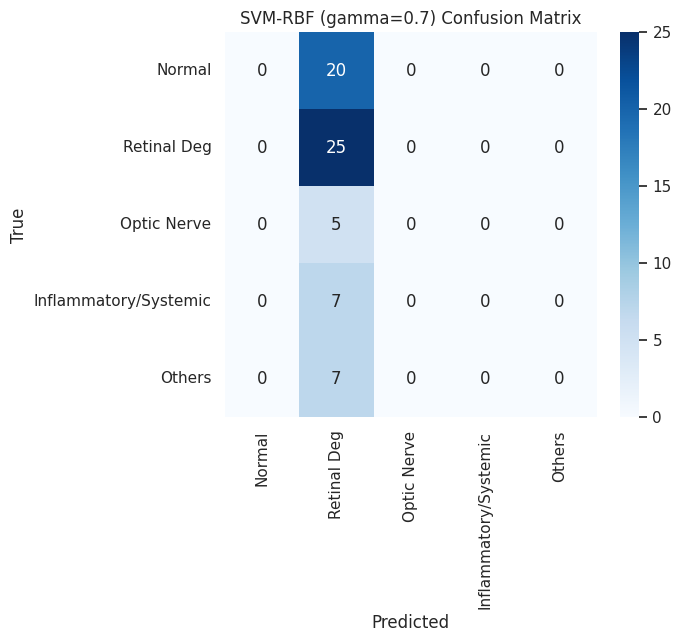


Permutation importance (reduced repeats for speed):
re_mean           0.0
le_mean           0.0
re_std            0.0
le_std            0.0
re_rms            0.0
le_rms            0.0
re_energy         0.0
le_energy         0.0
re_skewness       0.0
le_skewness       0.0
re_kurtosis       0.0
le_kurtosis       0.0
re_variance       0.0
le_variance       0.0
re_p50_amp        0.0
le_p50_amp        0.0
re_n95_amp        0.0
le_n95_amp        0.0
re_p50_latency    0.0
le_p50_latency    0.0


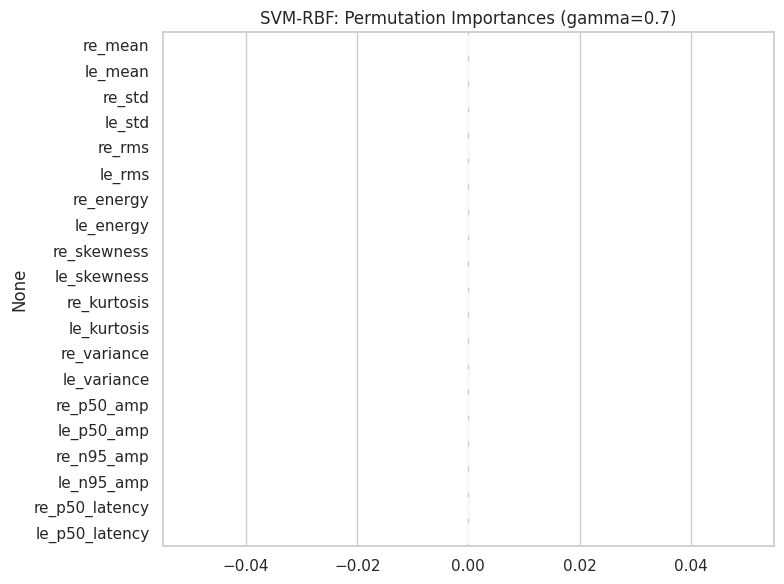


SVM (RBF): Training with gamma = 0.8
Training time: 0.22s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.2195

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.0000    0.0000    0.0000        20
          Retinal Deg     0.3906    1.0000    0.5618        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3906        64
            macro avg     0.0781    0.2000    0.1124        64
         weighted avg     0.1526    0.3906    0.2195        64


Confusion Matrix:


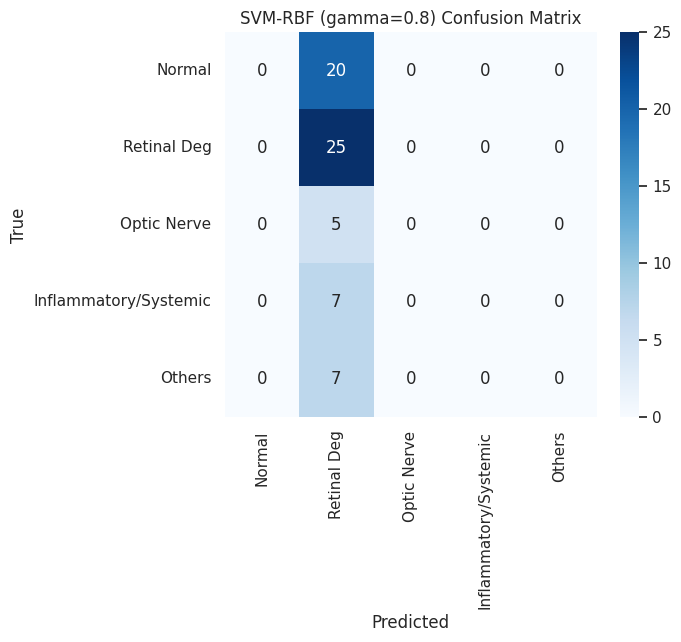


Permutation importance (reduced repeats for speed):
re_mean           0.0
le_mean           0.0
re_std            0.0
le_std            0.0
re_rms            0.0
le_rms            0.0
re_energy         0.0
le_energy         0.0
re_skewness       0.0
le_skewness       0.0
re_kurtosis       0.0
le_kurtosis       0.0
re_variance       0.0
le_variance       0.0
re_p50_amp        0.0
le_p50_amp        0.0
re_n95_amp        0.0
le_n95_amp        0.0
re_p50_latency    0.0
le_p50_latency    0.0


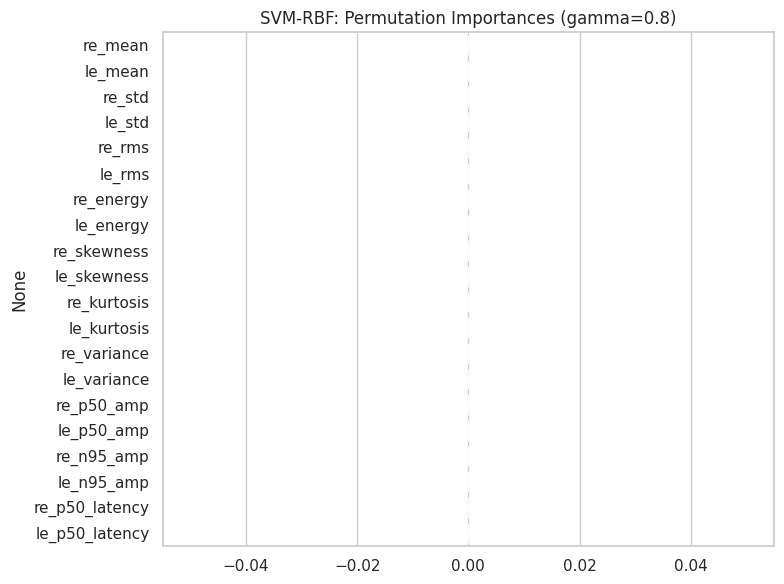


SVM (RBF): Training with gamma = 0.9
Training time: 0.32s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.2195

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.0000    0.0000    0.0000        20
          Retinal Deg     0.3906    1.0000    0.5618        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3906        64
            macro avg     0.0781    0.2000    0.1124        64
         weighted avg     0.1526    0.3906    0.2195        64


Confusion Matrix:


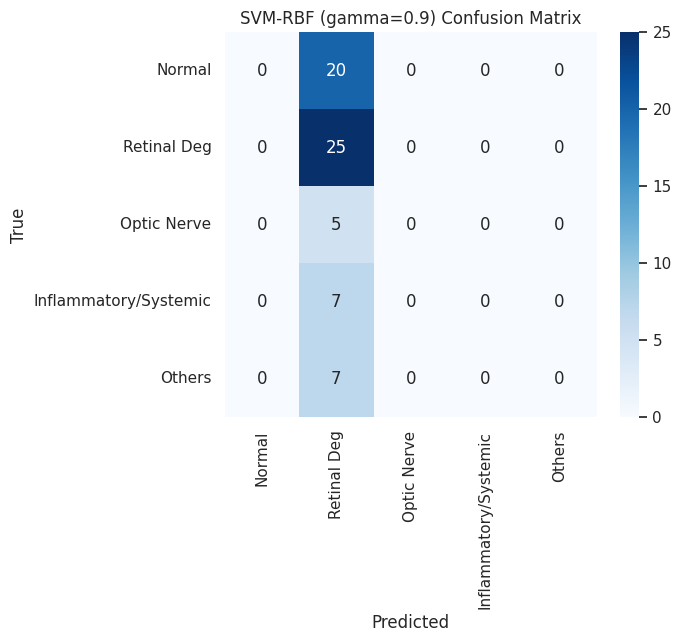


Permutation importance (reduced repeats for speed):
re_mean           0.0
le_mean           0.0
re_std            0.0
le_std            0.0
re_rms            0.0
le_rms            0.0
re_energy         0.0
le_energy         0.0
re_skewness       0.0
le_skewness       0.0
re_kurtosis       0.0
le_kurtosis       0.0
re_variance       0.0
le_variance       0.0
re_p50_amp        0.0
le_p50_amp        0.0
re_n95_amp        0.0
le_n95_amp        0.0
re_p50_latency    0.0
le_p50_latency    0.0


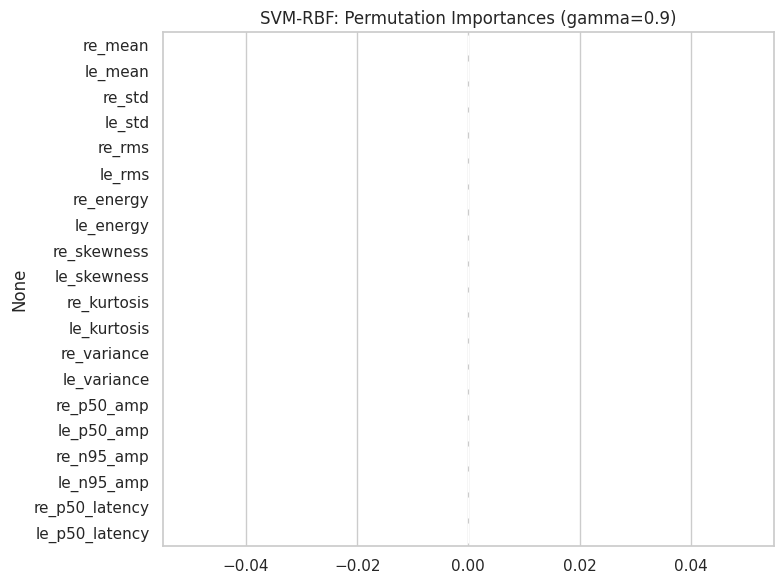


SVM (RBF): Training with gamma = 1.0
Training time: 0.23s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.2195

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.0000    0.0000    0.0000        20
          Retinal Deg     0.3906    1.0000    0.5618        25
          Optic Nerve     0.0000    0.0000    0.0000         5
Inflammatory/Systemic     0.0000    0.0000    0.0000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3906        64
            macro avg     0.0781    0.2000    0.1124        64
         weighted avg     0.1526    0.3906    0.2195        64


Confusion Matrix:


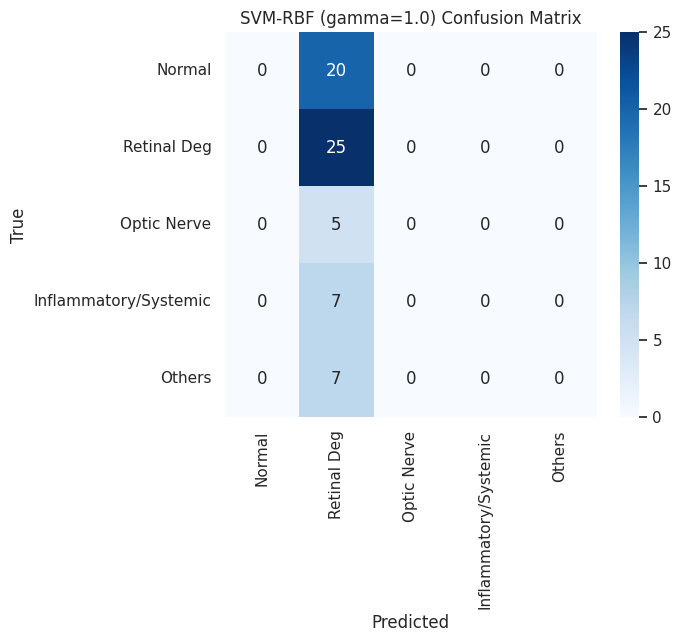


Permutation importance (reduced repeats for speed):
re_mean           0.0
le_mean           0.0
re_std            0.0
le_std            0.0
re_rms            0.0
le_rms            0.0
re_energy         0.0
le_energy         0.0
re_skewness       0.0
le_skewness       0.0
re_kurtosis       0.0
le_kurtosis       0.0
re_variance       0.0
le_variance       0.0
re_p50_amp        0.0
le_p50_amp        0.0
re_n95_amp        0.0
le_n95_amp        0.0
re_p50_latency    0.0
le_p50_latency    0.0


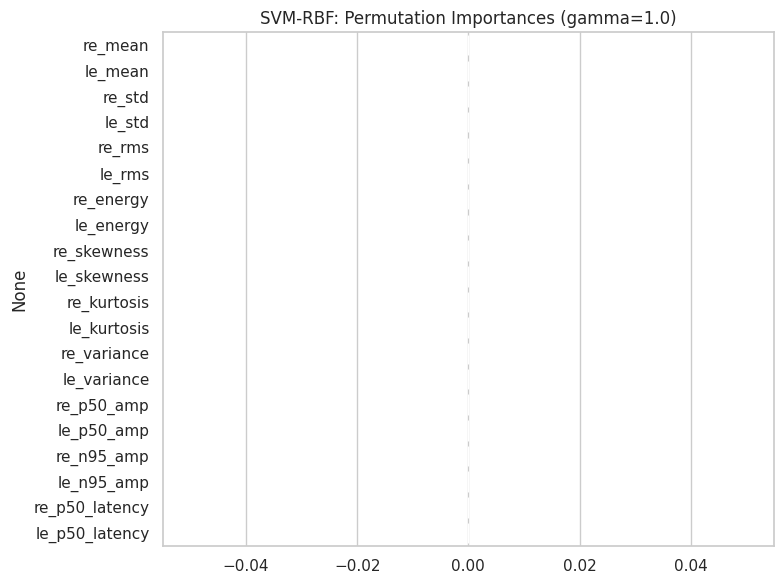

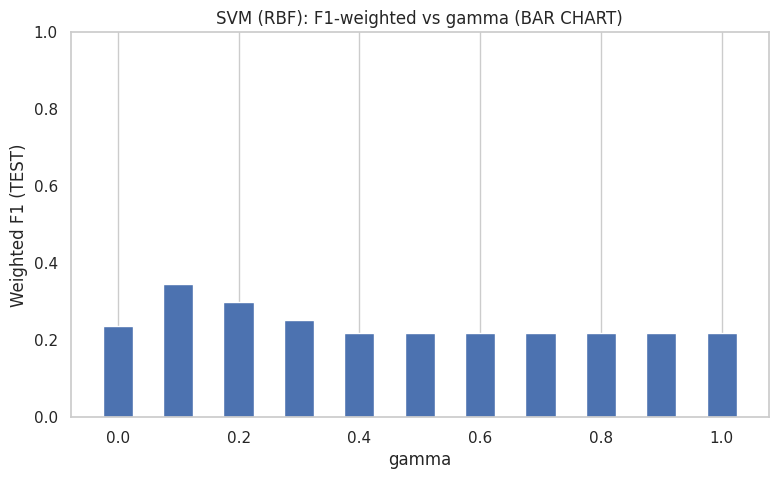


BEST SVM-RBF gamma = 0.1 | BEST Weighted F1 (TEST) = 0.34598214285714285


In [ ]:
# SNIPPET 6: SVM (RBF) gamma loop — UPDATED w/ BAR CHART + safe improved defaults

from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.inspection import permutation_importance
import pandas as pd
import time

# gamma values 0–1 with step of 0.1
svm_gamma_list = list(np.round(np.arange(0.0, 1.01, 0.1), 2))
results = []
best_f1 = -1
best_gamma = None
best_model = None

for g in svm_gamma_list:
    print("\n" + "="*60)
    print(f"SVM (RBF): Training with gamma = {g}")
    print("="*60)

    # Convert gamma=0 → small positive number
    gamma_eff = float(g) if float(g) > 0 else 1e-6

    # SAFE performance-boosting defaults
    model = SVC(
        kernel='rbf',
        gamma=gamma_eff,
        C=3,                               # soft margin → better generalization
        probability=True,
        class_weight='balanced',
        random_state=RANDOM_STATE
    )

    # Train
    t0 = time.time()
    model.fit(X_train_scaled, y_train_res)
    t1 = time.time()
    print(f"Training time: {t1-t0:.2f}s")

    # TEST PREDICTION (F1 is test-set F1)
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    f1w = f1_score(y_test, y_pred, average='weighted')

    print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST): {f1w:.4f}")

    print("\nClassification Report:")
    print(classification_report(
        y_test, y_pred, target_names=CLASS_NAMES_5, digits=4
    ))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=CLASS_NAMES_5,
                yticklabels=CLASS_NAMES_5,
                cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"SVM-RBF (gamma={g}) Confusion Matrix")
    plt.show()

    # Permutation importance (slow → reduced repeats)
    try:
        print("\nPermutation importance (reduced repeats for speed):")
        r = permutation_importance(
            model,
            X_test_scaled, y_test,
            n_repeats=5,                   # reduced for speed
            random_state=RANDOM_STATE,
            n_jobs=-1
        )
        imp = pd.Series(r.importances_mean, index=X_cols_final)\
                .sort_values(ascending=False).head(20)

        print(imp.to_string())

        plt.figure(figsize=(8,6))
        sns.barplot(x=imp.values, y=imp.index)
        plt.title(f"SVM-RBF: Permutation Importances (gamma={g})")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print("Could not compute permutation importance:", e)

    # store results
    results.append({'gamma': g, 'acc': acc, 'f1w': f1w})

    if f1w > best_f1:
        best_f1 = f1w
        best_gamma = g
        best_model = model

# ------------------------------------------
# BAR CHART for F1 vs gamma
# ------------------------------------------
gammas = [r['gamma'] for r in results]
f1s = [r['f1w'] for r in results]

plt.figure(figsize=(9,5))
plt.bar(gammas, f1s, width=0.05)
plt.xlabel("gamma")
plt.ylabel("Weighted F1 (TEST)")
plt.title("SVM (RBF): F1-weighted vs gamma (BAR CHART)")
plt.ylim(0, 1)
plt.grid(axis='y')
plt.show()

print("\nBEST SVM-RBF gamma =", best_gamma,
      "| BEST Weighted F1 (TEST) =", best_f1)

# End of SNIPPET 6



SVM (Poly): Training with degree = 2
Training time: 0.16s
Accuracy: 0.3438 | Weighted F1 (TEST): 0.3613

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5625    0.4500    0.5000        20
          Retinal Deg     0.4706    0.3200    0.3810        25
          Optic Nerve     0.1667    0.2000    0.1818         5
Inflammatory/Systemic     0.1579    0.4286    0.2308         7
               Others     0.1667    0.1429    0.1538         7

             accuracy                         0.3438        64
            macro avg     0.3049    0.3083    0.2895        64
         weighted avg     0.4081    0.3438    0.3613        64


Confusion Matrix:


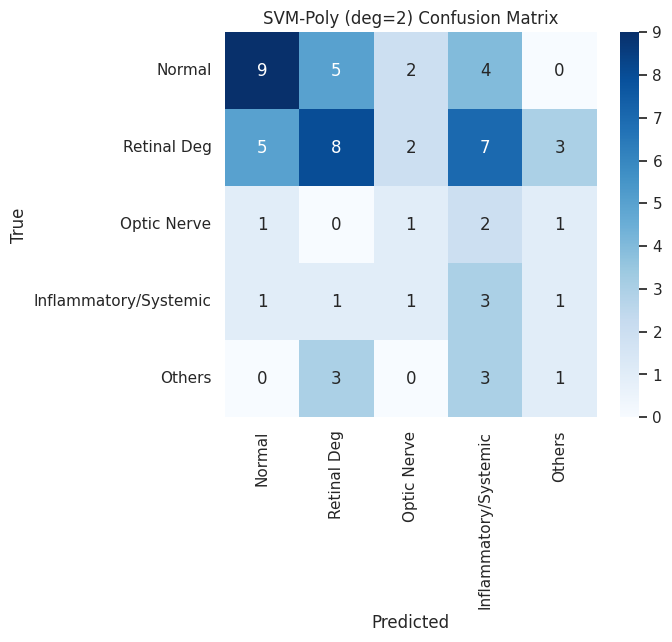


Permutation importance (reduced repeats for speed):
sex                        0.031250
re_signal_quality_index    0.021875
p50_lat_asym               0.021875
le_spectral_power_theta    0.015625
le_b1                      0.015625
re_waveform_asymmetry      0.015625
re_hjorth_mobility         0.015625
re_rise_time               0.012500
le_mean                    0.012500
re_p50_latency             0.012500
le_spectral_power_beta     0.012500
re_spectral_centroid       0.012500
le_b2                      0.012500
re_fall_time               0.012500
p50_n95_diff               0.012500
p50_asymmetry              0.012500
age                        0.009375
le_b3_norm                 0.009375
le_auc                     0.009375
re_n95_amp                 0.009375


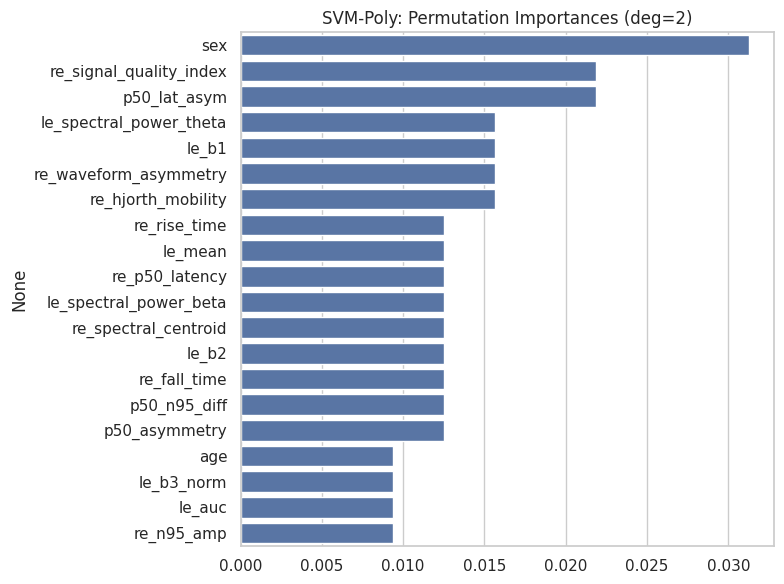


SVM (Poly): Training with degree = 3
Training time: 0.17s
Accuracy: 0.4219 | Weighted F1 (TEST): 0.4257

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6364    0.7000    0.6667        20
          Retinal Deg     0.5000    0.3200    0.3902        25
          Optic Nerve     0.2857    0.4000    0.3333         5
Inflammatory/Systemic     0.1818    0.2857    0.2222         7
               Others     0.1250    0.1429    0.1333         7

             accuracy                         0.4219        64
            macro avg     0.3458    0.3697    0.3492        64
         weighted avg     0.4501    0.4219    0.4257        64


Confusion Matrix:


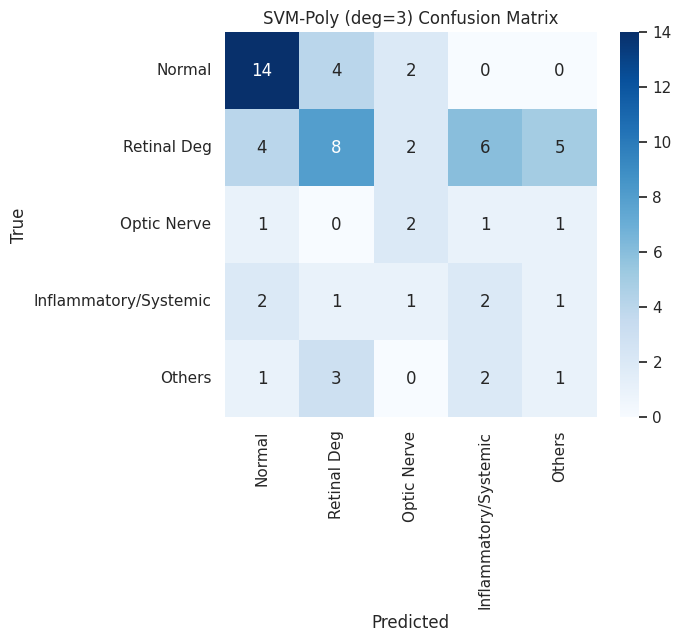


Permutation importance (reduced repeats for speed):
sex                        0.078125
le_mean_curvature          0.050000
re_signal_quality_index    0.046875
le_spectral_centroid       0.046875
re_n95_latency             0.046875
age                        0.040625
re_rise_time               0.040625
re_fall_time               0.040625
p50_asymmetry              0.040625
re_p50_latency             0.040625
le_auc                     0.037500
va_re                      0.031250
p50_lat_asym               0.031250
re_auc                     0.031250
le_skewness                0.031250
p50_lat_diff               0.031250
le_signal_min              0.028125
re_waveform_asymmetry      0.028125
le_hjorth_complexity       0.028125
re_hjorth_mobility         0.025000


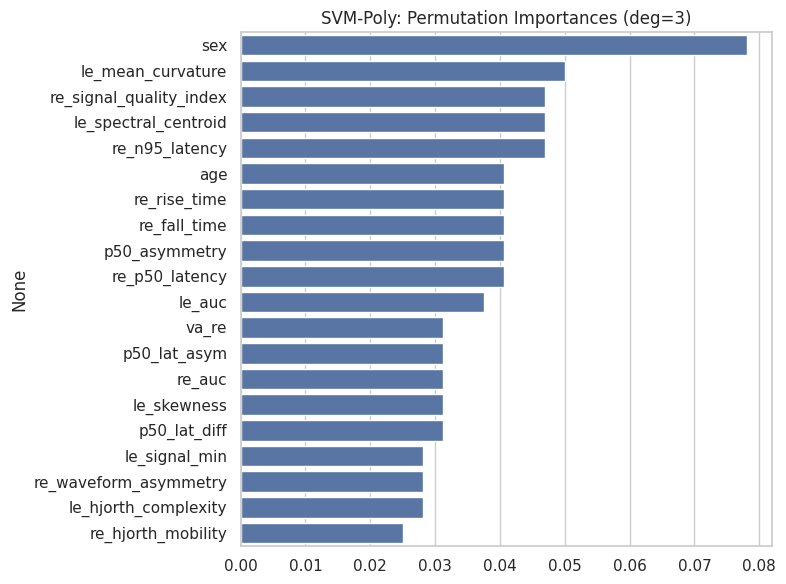


SVM (Poly): Training with degree = 4
Training time: 0.34s
Accuracy: 0.4062 | Weighted F1 (TEST): 0.4082

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5909    0.6500    0.6190        20
          Retinal Deg     0.4706    0.3200    0.3810        25
          Optic Nerve     0.2857    0.4000    0.3333         5
Inflammatory/Systemic     0.1818    0.2857    0.2222         7
               Others     0.1429    0.1429    0.1429         7

             accuracy                         0.4062        64
            macro avg     0.3344    0.3597    0.3397        64
         weighted avg     0.4263    0.4062    0.4082        64


Confusion Matrix:


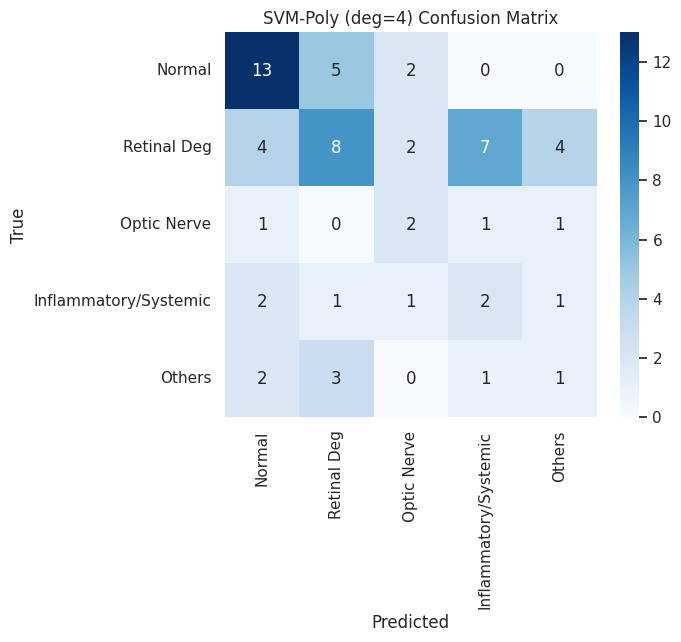


Permutation importance (reduced repeats for speed):
age                      0.043750
sex                      0.037500
re_n95_latency           0.031250
le_mean_curvature        0.031250
le_dominant_frequency    0.025000
re_auc                   0.025000
re_waveform_asymmetry    0.021875
le_n95_amp               0.018750
re_b1_norm               0.018750
le_n95_latency           0.018750
le_signal_min            0.018750
re_spectral_centroid     0.015625
le_zero_crossing_rate    0.015625
re_p50_latency           0.015625
re_p50_amp               0.015625
le_b3_norm               0.015625
re_mean_curvature        0.015625
p50_asymmetry            0.015625
le_hjorth_complexity     0.015625
re_rise_time             0.015625


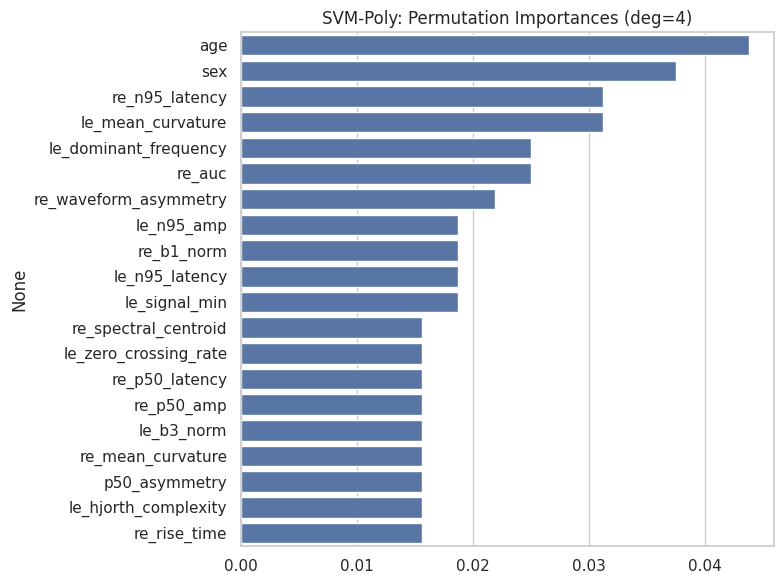


SVM (Poly): Training with degree = 5
Training time: 0.24s
Accuracy: 0.4062 | Weighted F1 (TEST): 0.4108

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5909    0.6500    0.6190        20
          Retinal Deg     0.5000    0.3200    0.3902        25
          Optic Nerve     0.2857    0.4000    0.3333         5
Inflammatory/Systemic     0.1818    0.2857    0.2222         7
               Others     0.1250    0.1429    0.1333         7

             accuracy                         0.4062        64
            macro avg     0.3367    0.3597    0.3396        64
         weighted avg     0.4359    0.4062    0.4108        64


Confusion Matrix:


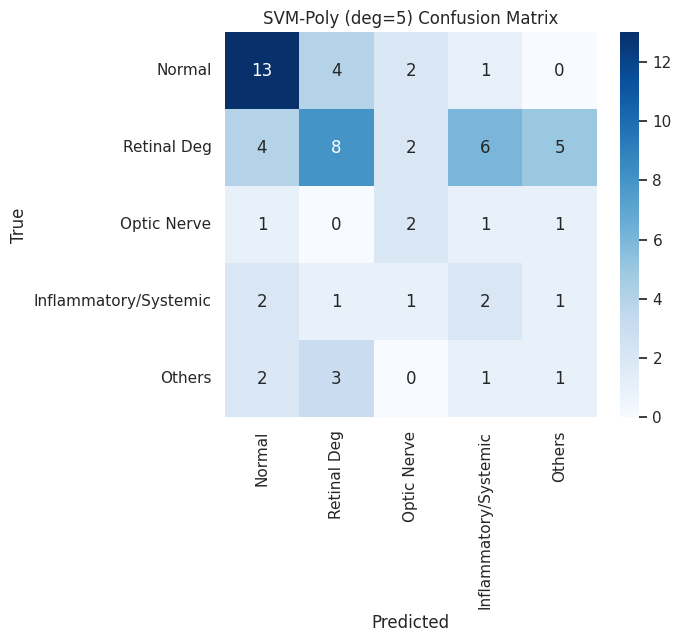


Permutation importance (reduced repeats for speed):
sex                        0.046875
n95_lat_asym               0.040625
age                        0.037500
le_n95_amp                 0.028125
le_hjorth_complexity       0.025000
le_n95_latency             0.021875
re_b1_norm                 0.021875
re_n95_latency             0.021875
n95_asymmetry              0.021875
le_zero_crossing_rate      0.018750
re_waveform_asymmetry      0.018750
re_signal_quality_index    0.018750
re_b2_norm                 0.018750
re_fall_time               0.018750
re_p50_latency             0.018750
re_rise_time               0.018750
re_signal_max              0.015625
le_mean_curvature          0.015625
le_signal_quality_index    0.015625
va_le                      0.015625


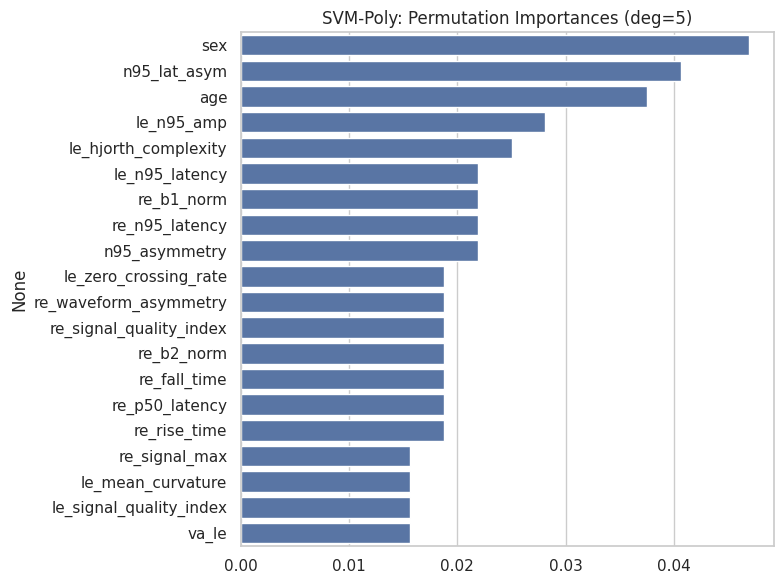


SVM (Poly): Training with degree = 6
Training time: 0.21s
Accuracy: 0.4062 | Weighted F1 (TEST): 0.4077

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6364    0.7000    0.6667        20
          Retinal Deg     0.4667    0.2800    0.3500        25
          Optic Nerve     0.2500    0.4000    0.3077         5
Inflammatory/Systemic     0.1667    0.2857    0.2105         7
               Others     0.1429    0.1429    0.1429         7

             accuracy                         0.4062        64
            macro avg     0.3325    0.3617    0.3355        64
         weighted avg     0.4345    0.4062    0.4077        64


Confusion Matrix:


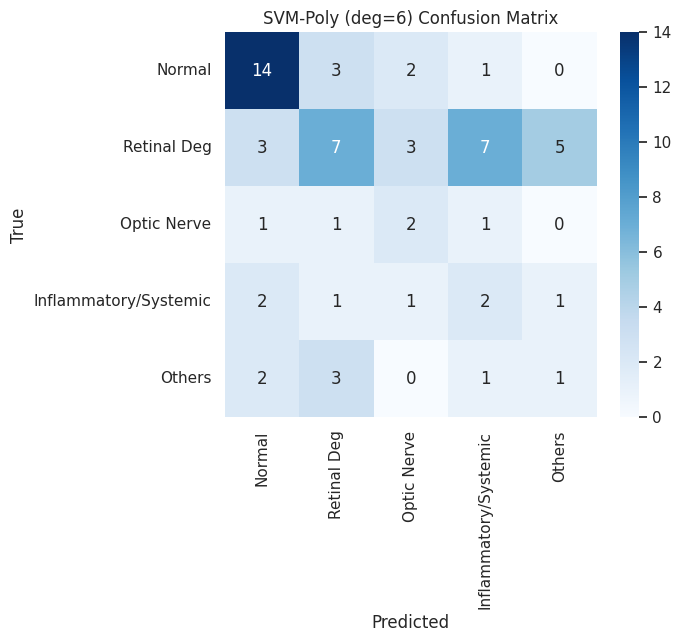


Permutation importance (reduced repeats for speed):
sex                      0.075000
n95_lat_asym             0.065625
age                      0.053125
le_n95_latency           0.046875
re_rise_time             0.034375
re_p50_latency           0.034375
re_auc                   0.034375
re_fall_time             0.034375
le_mean_curvature        0.031250
n95_asymmetry            0.031250
le_signal_min            0.028125
le_skewness              0.028125
le_n95_amp               0.025000
re_p50_amp               0.025000
le_spectral_entropy      0.021875
re_dominant_frequency    0.021875
re_n95_latency           0.021875
re_waveform_asymmetry    0.021875
re_slope_max             0.018750
re_max_slope             0.018750


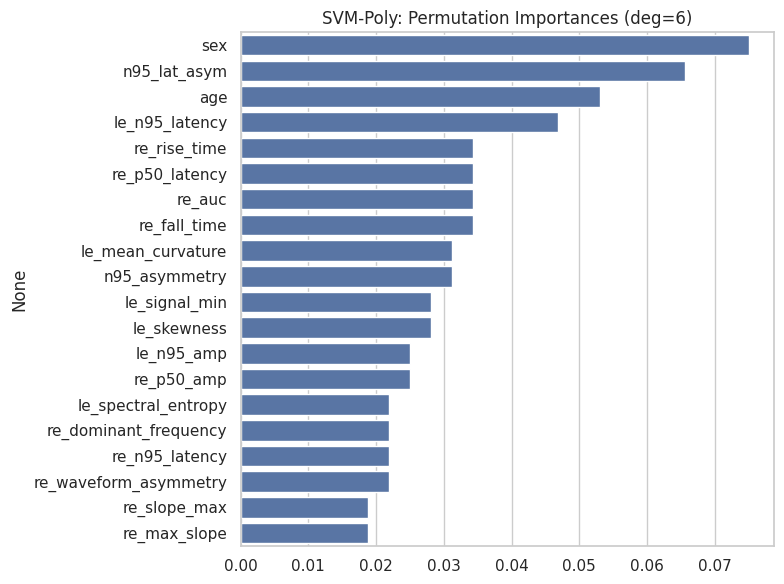


SVM (Poly): Training with degree = 7
Training time: 0.20s
Accuracy: 0.4062 | Weighted F1 (TEST): 0.4042

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6087    0.7000    0.6512        20
          Retinal Deg     0.4667    0.2800    0.3500        25
          Optic Nerve     0.2500    0.4000    0.3077         5
Inflammatory/Systemic     0.1818    0.2857    0.2222         7
               Others     0.1429    0.1429    0.1429         7

             accuracy                         0.4062        64
            macro avg     0.3300    0.3617    0.3348        64
         weighted avg     0.4276    0.4062    0.4042        64


Confusion Matrix:


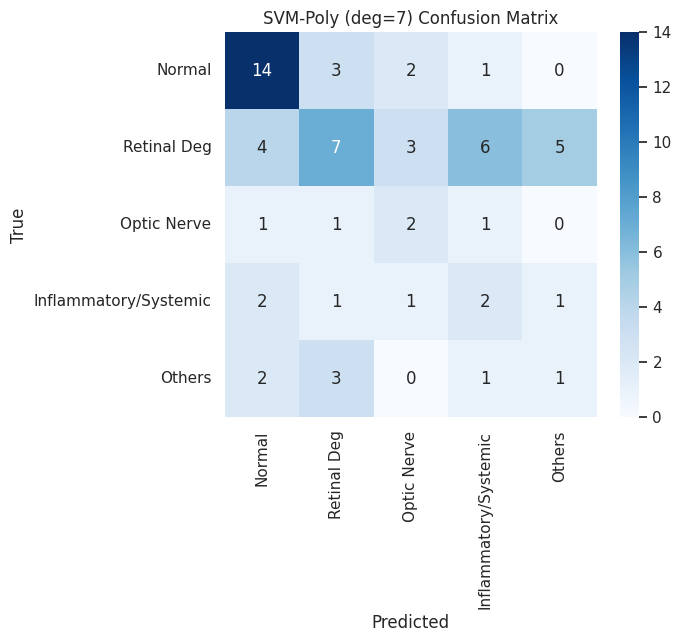


Permutation importance (reduced repeats for speed):
sex                     0.081250
n95_lat_asym            0.068750
age                     0.053125
le_n95_latency          0.050000
re_max_slope            0.040625
re_slope_max            0.040625
le_mean_curvature       0.037500
re_mean                 0.034375
re_auc                  0.034375
le_spectral_entropy     0.031250
re_b1_norm              0.031250
p50_lat_diff            0.031250
le_signal_min           0.031250
re_mean_curvature       0.031250
re_spectral_centroid    0.028125
re_rise_time            0.028125
re_p50_latency          0.028125
le_spectral_centroid    0.028125
re_fall_time            0.028125
le_n95_amp              0.025000


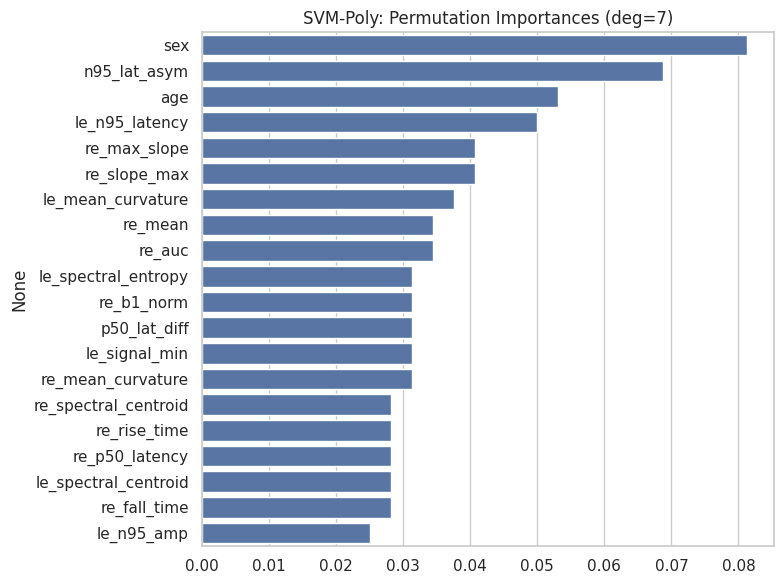


SVM (Poly): Training with degree = 8
Training time: 0.42s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.3952

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5909    0.6500    0.6190        20
          Retinal Deg     0.5000    0.2800    0.3590        25
          Optic Nerve     0.2500    0.4000    0.3077         5
Inflammatory/Systemic     0.1538    0.2857    0.2000         7
               Others     0.1429    0.1429    0.1429         7

             accuracy                         0.3906        64
            macro avg     0.3275    0.3517    0.3257        64
         weighted avg     0.4320    0.3906    0.3952        64


Confusion Matrix:


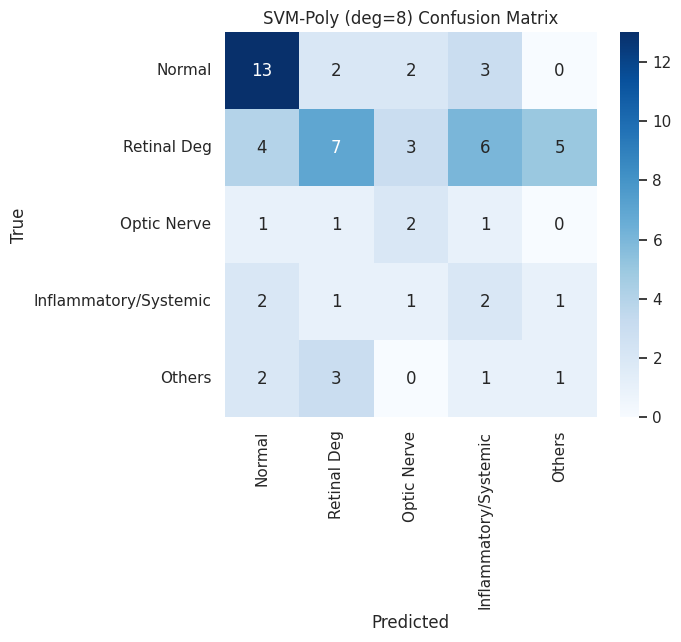


Permutation importance (reduced repeats for speed):
sex                        0.062500
age                        0.059375
n95_lat_asym               0.059375
re_b2_norm                 0.043750
le_n95_latency             0.043750
re_mean_curvature          0.043750
re_slope_max               0.040625
le_mean_curvature          0.040625
re_max_slope               0.040625
p50_lat_asym               0.037500
re_signal_quality_index    0.034375
le_spectral_centroid       0.034375
re_hjorth_complexity       0.034375
re_spectral_entropy        0.031250
n95_asymmetry              0.031250
le_signal_min              0.031250
le_spectral_entropy        0.031250
le_b2                      0.028125
le_peak_to_peak            0.028125
le_hjorth_complexity       0.028125


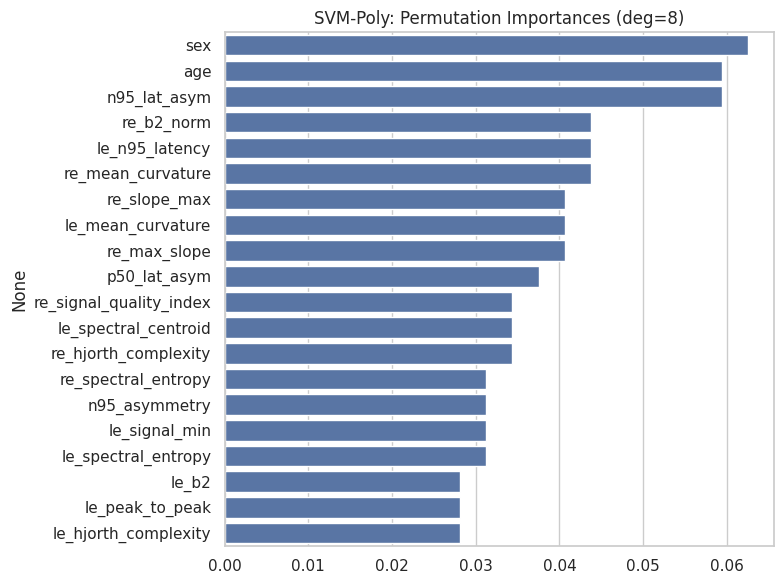


SVM (Poly): Training with degree = 9
Training time: 0.23s
Accuracy: 0.3594 | Weighted F1 (TEST): 0.3694

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6000    0.6000    0.6000        20
          Retinal Deg     0.5000    0.2800    0.3590        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.1429    0.2857    0.1905         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3594        64
            macro avg     0.2886    0.3131    0.2832        64
         weighted avg     0.4141    0.3594    0.3694        64


Confusion Matrix:


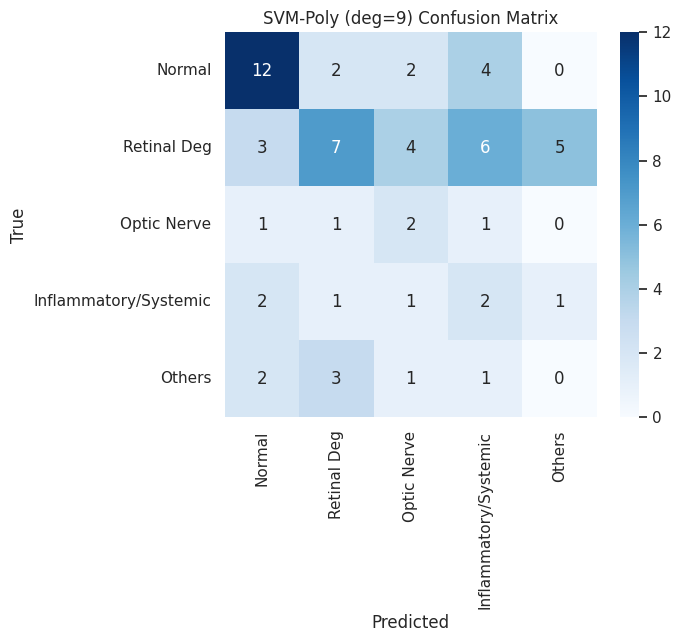


Permutation importance (reduced repeats for speed):
sex                       0.056250
n95_lat_asym              0.040625
le_mean_curvature         0.034375
le_spectral_centroid      0.021875
re_b2_norm                0.018750
re_mean_curvature         0.018750
age                       0.018750
re_hjorth_complexity      0.015625
le_n95_latency            0.015625
le_peak_to_peak           0.015625
le_spectral_entropy       0.015625
le_hjorth_complexity      0.015625
re_b1_norm                0.015625
p50_lat_asym              0.015625
le_spectral_power_beta    0.012500
le_b2                     0.012500
re_slope_max              0.009375
re_hf_lf_ratio            0.009375
re_max_slope              0.009375
re_dominant_frequency     0.009375


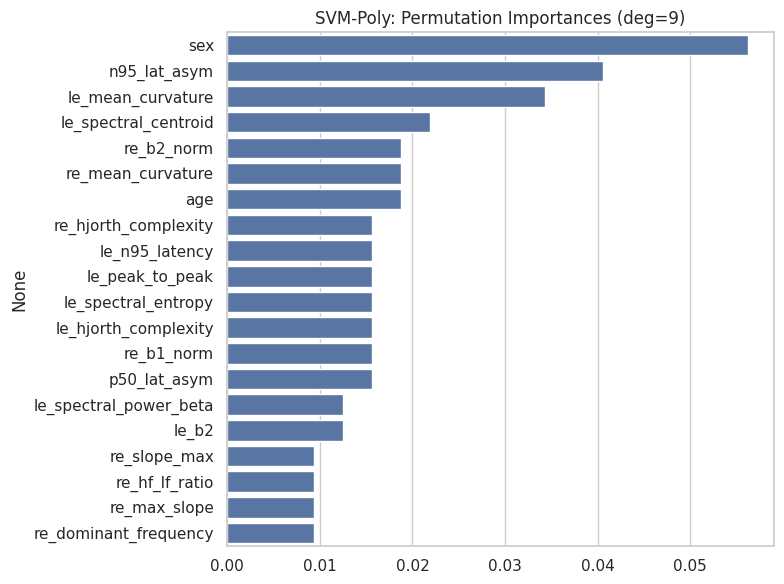


SVM (Poly): Training with degree = 10
Training time: 0.26s
Accuracy: 0.3594 | Weighted F1 (TEST): 0.3659

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5714    0.6000    0.5854        20
          Retinal Deg     0.5000    0.2800    0.3590        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.1538    0.2857    0.2000         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3594        64
            macro avg     0.2851    0.3131    0.2822        64
         weighted avg     0.4063    0.3594    0.3659        64


Confusion Matrix:


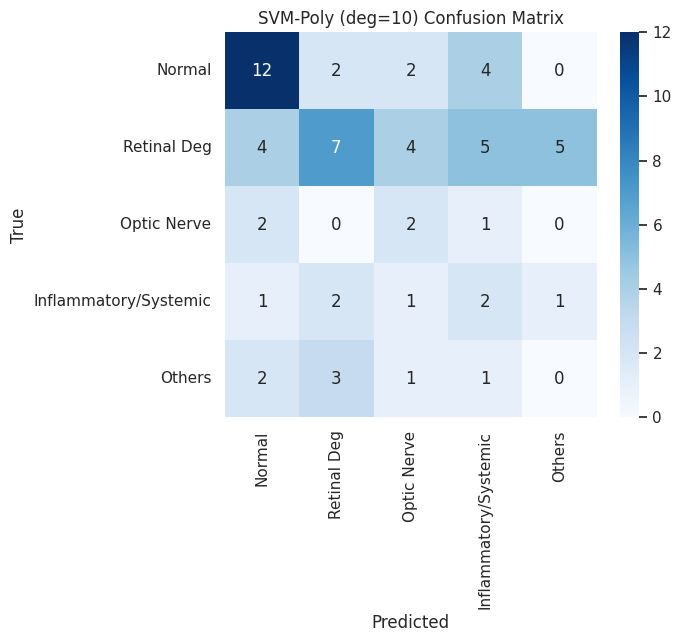


Permutation importance (reduced repeats for speed):
sex                       0.056250
n95_lat_asym              0.037500
le_mean_curvature         0.028125
le_n95_amp                0.025000
re_b2_norm                0.018750
age                       0.018750
re_b1_norm                0.018750
le_n95_latency            0.018750
le_peak_to_peak           0.015625
re_rise_time              0.015625
le_signal_min             0.015625
le_dominant_frequency     0.015625
re_hjorth_complexity      0.015625
re_fall_time              0.015625
re_p50_latency            0.015625
re_mean_curvature         0.015625
n95_asymmetry             0.012500
le_spectral_power_beta    0.012500
le_b2                     0.012500
le_zero_crossing_rate     0.012500


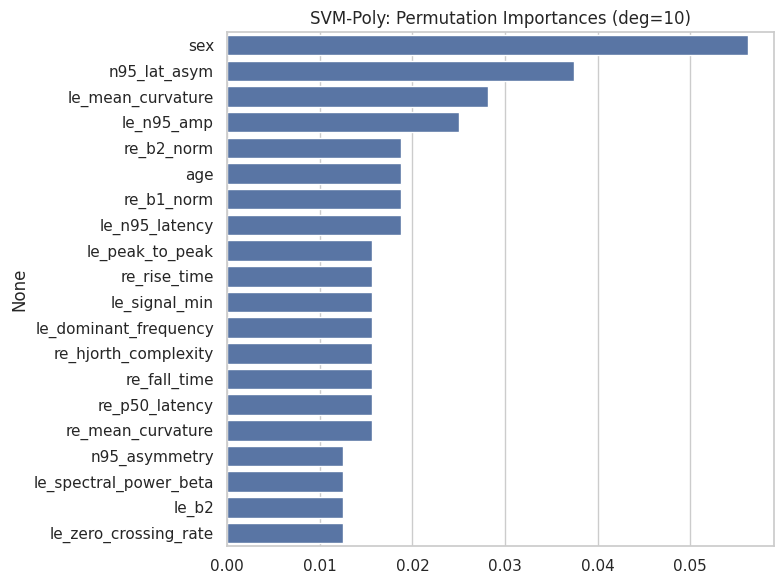

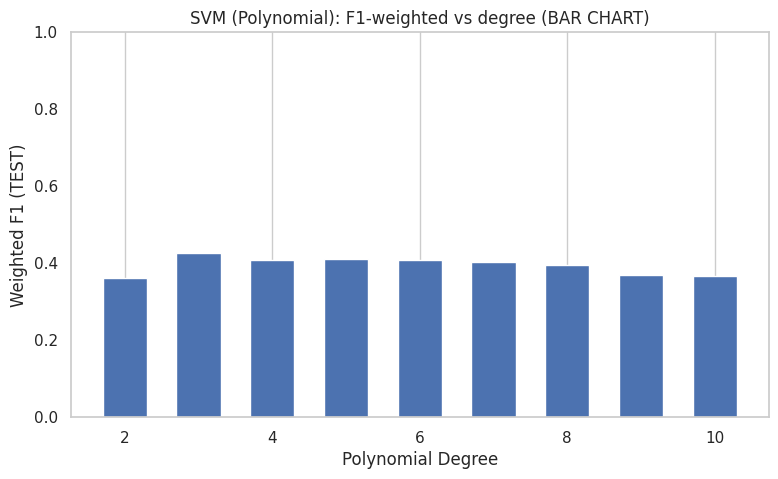


BEST SVM-Poly degree = 3 | BEST Weighted F1 (TEST) = 0.42570291327913273


In [ ]:
# SNIPPET 7: SVM (Polynomial) degree loop — UPDATED with BAR CHART + improved defaults
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.inspection import permutation_importance
import pandas as pd
import time

svm_poly_degrees = list(range(2, 11))  # degree 2 to 10
results = []
best_f1 = -1
best_deg = None
best_model = None

for d in svm_poly_degrees:
    print("\n" + "="*60)
    print(f"SVM (Poly): Training with degree = {d}")
    print("="*60)

    # SAFE, logic-preserving performance improvements
    model = SVC(
        kernel='poly',
        degree=int(d),
        C=3,                # soft margin → better generalization
        gamma='scale',      # stable default
        coef0=1,            # recommended for polynomial kernels
        probability=True,
        class_weight='balanced',
        random_state=RANDOM_STATE
    )

    # Train
    t0 = time.time()
    model.fit(X_train_scaled, y_train_res)
    t1 = time.time()
    print(f"Training time: {t1 - t0:.2f}s")

    # TEST PREDICTION — F1 IS FOR TEST SET
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    f1w = f1_score(y_test, y_pred, average='weighted')

    print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST): {f1w:.4f}")

    print("\nClassification Report:")
    print(classification_report(
        y_test, y_pred,
        target_names=CLASS_NAMES_5,
        digits=4
    ))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=CLASS_NAMES_5,
                yticklabels=CLASS_NAMES_5,
                cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"SVM-Poly (deg={d}) Confusion Matrix")
    plt.show()

    # Permutation importance
    try:
        print("\nPermutation importance (reduced repeats for speed):")
        r = permutation_importance(
            model,
            X_test_scaled,
            y_test,
            n_repeats=5,     # faster
            random_state=RANDOM_STATE,
            n_jobs=-1
        )
        imp = pd.Series(r.importances_mean, index=X_cols_final) \
                .sort_values(ascending=False).head(20)

        print(imp.to_string())

        plt.figure(figsize=(8, 6))
        sns.barplot(x=imp.values, y=imp.index)
        plt.title(f"SVM-Poly: Permutation Importances (deg={d})")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print("Could not compute permutation importance:", e)

    # Store results
    results.append({'degree': d, 'acc': acc, 'f1w': f1w})

    if f1w > best_f1:
        best_f1 = f1w
        best_deg = d
        best_model = model

# --------------------------------------
# BAR CHART: F1 vs degree
# --------------------------------------
degrees = [r['degree'] for r in results]
f1s = [r['f1w'] for r in results]

plt.figure(figsize=(9, 5))
plt.bar(degrees, f1s, width=0.6)
plt.xlabel("Polynomial Degree")
plt.ylabel("Weighted F1 (TEST)")
plt.title("SVM (Polynomial): F1-weighted vs degree (BAR CHART)")
plt.ylim(0, 1)
plt.grid(axis='y')
plt.show()

print("\nBEST SVM-Poly degree =", best_deg,
      "| BEST Weighted F1 (TEST) =", best_f1)

# End of SNIPPET 7



KNN: Training with n_neighbors = 2
Training time: 0.00s
Accuracy: 0.3438 | Weighted F1: 0.3419

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.4643    0.6500    0.5417        20
          Retinal Deg     0.5833    0.2800    0.3784        25
          Optic Nerve     0.1111    0.2000    0.1429         5
Inflammatory/Systemic     0.1111    0.1429    0.1250         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3438        64
            macro avg     0.2540    0.2546    0.2376        64
         weighted avg     0.3938    0.3438    0.3419        64


Confusion Matrix:


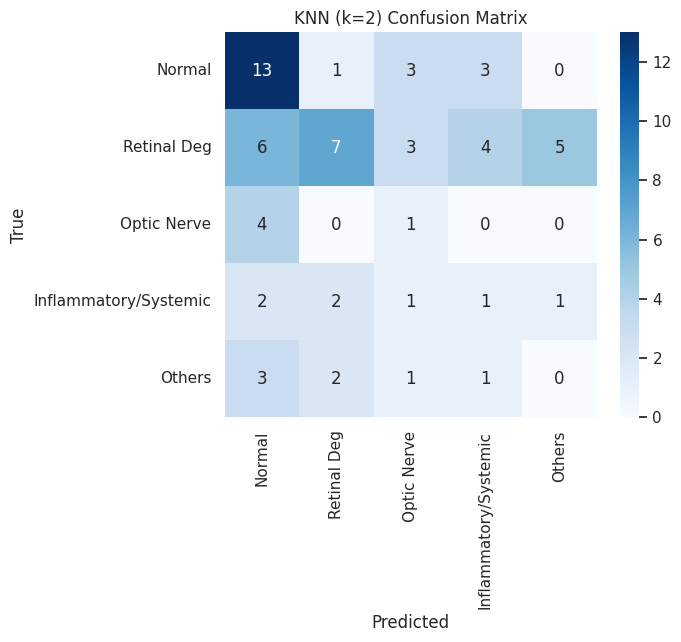


Permutation importance (may take time):
le_signal_quality_index    0.026562
re_mean                    0.018750
re_spectral_entropy        0.010937
sex                        0.010937
re_dominant_frequency      0.010937
p50_lat_asym               0.010937
le_signal_min              0.007812
le_kurtosis                0.007812
re_spectral_centroid       0.006250
re_auc                     0.004687
le_skewness                0.004687
p50_lat_diff               0.003125
re_energy                  0.001563
re_variance                0.001563
p50_n95_diff               0.001563
le_b3                      0.000000
le_spectral_power_delta    0.000000
le_spectral_power_gamma    0.000000
le_b1                      0.000000
re_spectral_power_alpha    0.000000


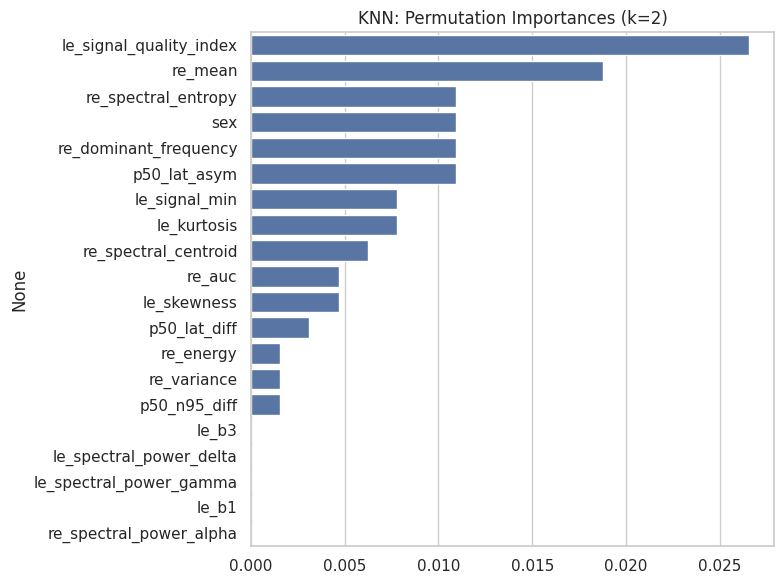


KNN: Training with n_neighbors = 4
Training time: 0.00s
Accuracy: 0.3125 | Weighted F1: 0.3211

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5238    0.5500    0.5366        20
          Retinal Deg     0.5556    0.2000    0.2941        25
          Optic Nerve     0.1111    0.2000    0.1429         5
Inflammatory/Systemic     0.1765    0.4286    0.2500         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3125        64
            macro avg     0.2734    0.2757    0.2447        64
         weighted avg     0.4087    0.3125    0.3211        64


Confusion Matrix:


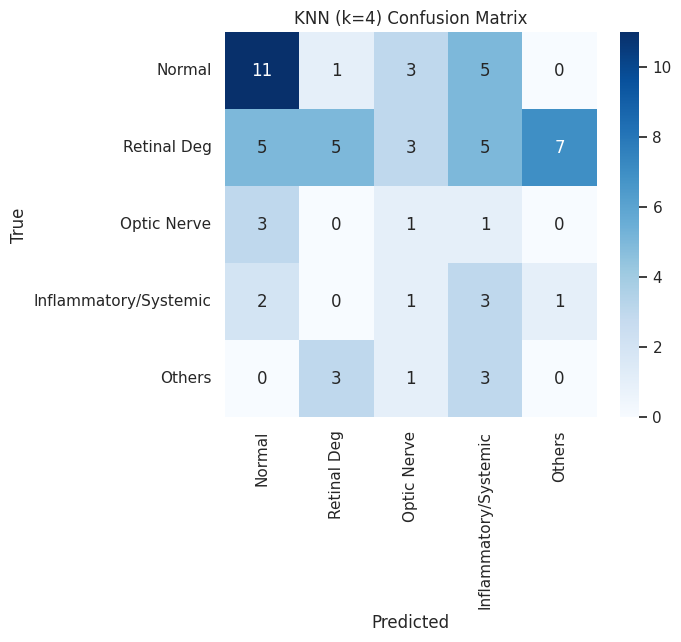


Permutation importance (may take time):
sex                        0.020313
le_waveform_asymmetry      0.018750
re_spectral_centroid       0.012500
re_dominant_frequency      0.009375
n95_lat_asym               0.009375
le_hjorth_mobility         0.007812
le_signal_min              0.006250
le_rise_time               0.004687
le_fall_time               0.004687
le_p50_latency             0.004687
le_max_slope               0.001563
le_b3_norm                 0.001563
re_mean                    0.001563
le_slope_max               0.001563
re_max_curvature           0.001563
le_spectral_power_gamma    0.000000
le_spectral_power_delta    0.000000
le_spectral_power_alpha    0.000000
re_b3                      0.000000
re_spectral_power_delta    0.000000


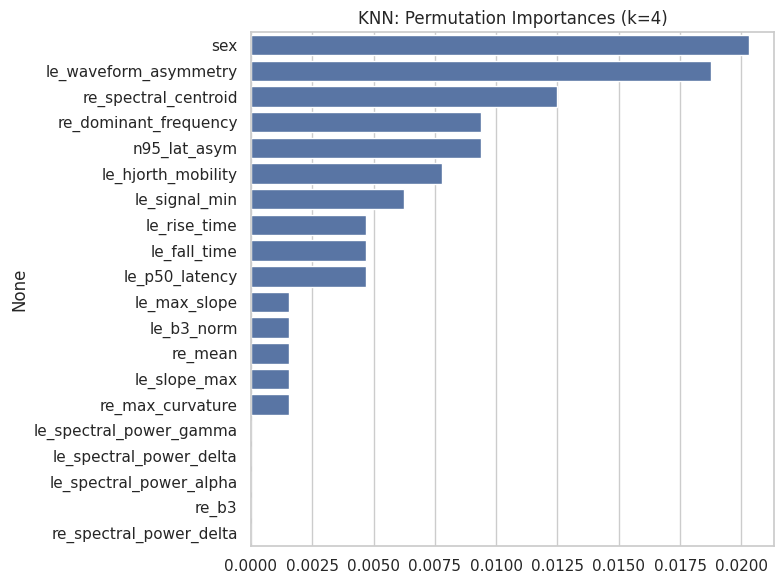


KNN: Training with n_neighbors = 6
Training time: 0.00s
Accuracy: 0.2500 | Weighted F1: 0.2875

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5714    0.4000    0.4706        20
          Retinal Deg     0.5556    0.2000    0.2941        25
          Optic Nerve     0.0769    0.2000    0.1111         5
Inflammatory/Systemic     0.1053    0.2857    0.1538         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2500        64
            macro avg     0.2618    0.2171    0.2059        64
         weighted avg     0.4131    0.2500    0.2875        64


Confusion Matrix:


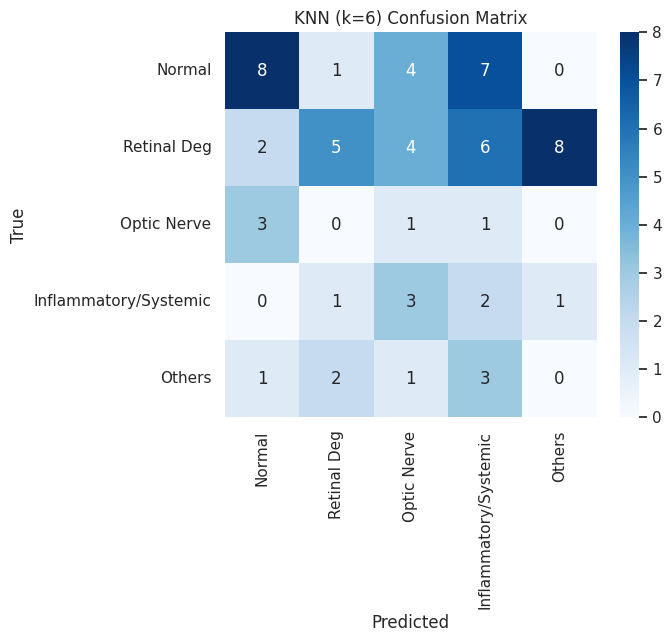


Permutation importance (may take time):
le_mean                    0.010937
re_max_slope               0.009375
re_dominant_frequency      0.009375
re_slope_max               0.009375
le_dominant_frequency      0.007812
le_waveform_asymmetry      0.007812
re_slope_var               0.007812
re_slope_std               0.007812
le_max_slope               0.006250
re_max_curvature           0.006250
le_slope_max               0.006250
le_slope_var               0.003125
re_b3                      0.003125
re_spectral_power_gamma    0.003125
le_zero_crossing_rate      0.003125
le_hjorth_mobility         0.001563
le_hf_lf_ratio             0.001563
le_spectral_power_theta    0.001563
le_energy                  0.001563
le_b1                      0.001563


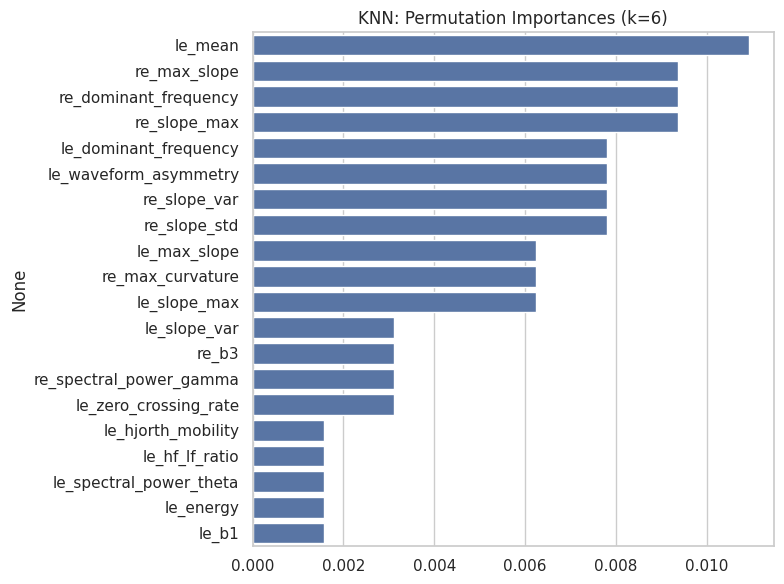


KNN: Training with n_neighbors = 8
Training time: 0.00s
Accuracy: 0.2969 | Weighted F1: 0.3126

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5263    0.5000    0.5128        20
          Retinal Deg     0.5556    0.2000    0.2941        25
          Optic Nerve     0.1111    0.2000    0.1429         5
Inflammatory/Systemic     0.1667    0.4286    0.2400         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2969        64
            macro avg     0.2719    0.2657    0.2380        64
         weighted avg     0.4084    0.2969    0.3126        64


Confusion Matrix:


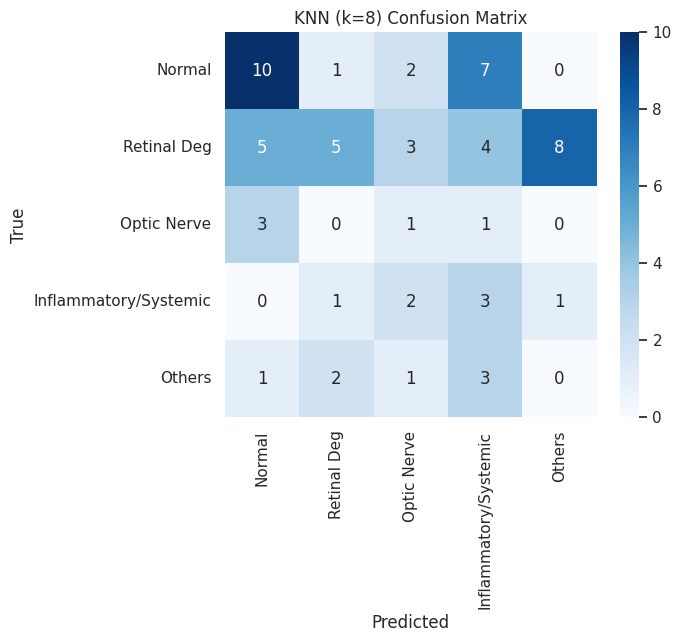


Permutation importance (may take time):
n95_lat_diff               0.020313
le_signal_quality_index    0.017188
le_hf_lf_ratio             0.014063
le_hjorth_complexity       0.012500
le_b3_norm                 0.010937
le_hjorth_mobility         0.009375
re_auc                     0.007812
re_p50_latency             0.003125
re_fall_time               0.003125
re_rise_time               0.003125
le_mean_curvature          0.003125
re_hf_lf_ratio             0.001563
va_le                      0.001563
le_waveform_asymmetry      0.001563
le_b1                      0.000000
le_b1_norm                 0.000000
le_b3                      0.000000
re_spectral_power_alpha    0.000000
re_ratio                   0.000000
le_fall_time               0.000000


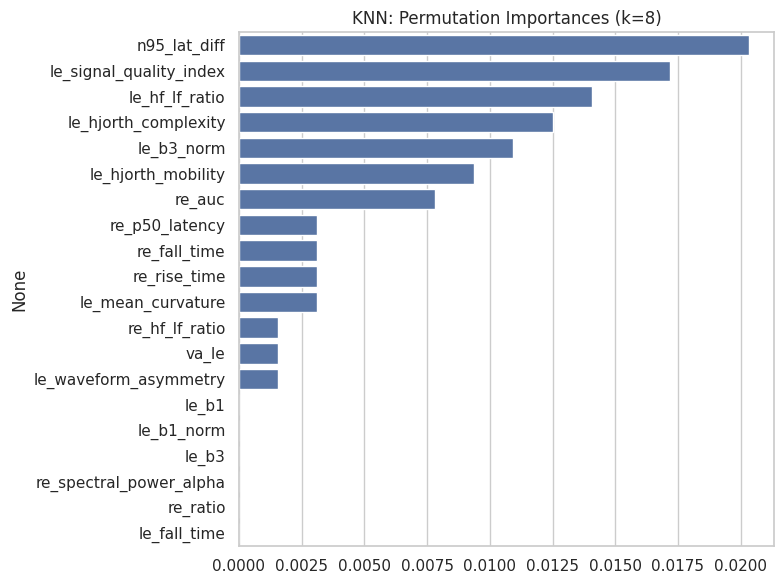


KNN: Training with n_neighbors = 10
Training time: 0.01s
Accuracy: 0.3125 | Weighted F1: 0.3421

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6250    0.5000    0.5556        20
          Retinal Deg     0.5455    0.2400    0.3333        25
          Optic Nerve     0.0909    0.2000    0.1250         5
Inflammatory/Systemic     0.1875    0.4286    0.2609         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.3125        64
            macro avg     0.2898    0.2737    0.2550        64
         weighted avg     0.4360    0.3125    0.3421        64


Confusion Matrix:


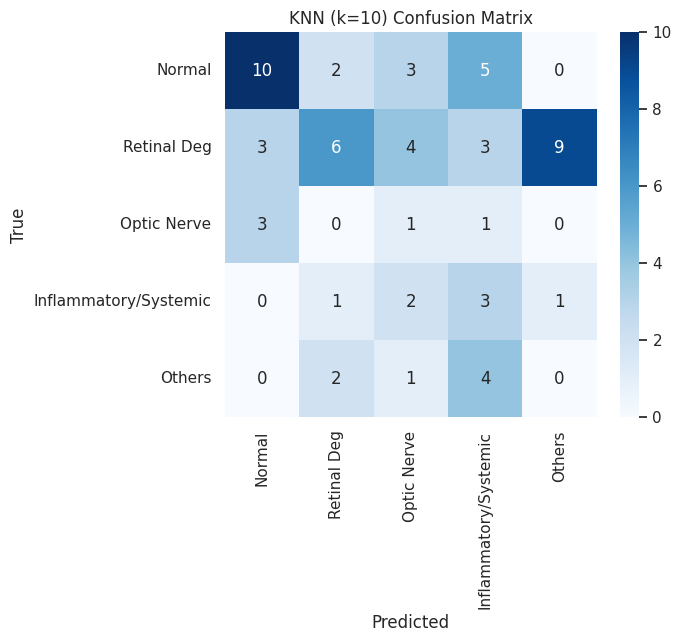


Permutation importance (may take time):
age                     0.053125
le_std                  0.039062
le_peak_to_peak         0.039062
le_n95_amp              0.039062
re_max_slope            0.032813
re_slope_max            0.032813
re_b2_norm              0.031250
le_fft_energy           0.031250
le_rms                  0.031250
re_n95_latency          0.028125
re_fft_energy           0.026562
re_p50_amp              0.026562
le_hjorth_complexity    0.026562
re_b1_norm              0.025000
re_hjorth_complexity    0.025000
le_hjorth_mobility      0.023438
n95_lat_diff            0.023438
re_slope_std            0.023438
le_b1_norm              0.023438
le_n95_latency          0.021875


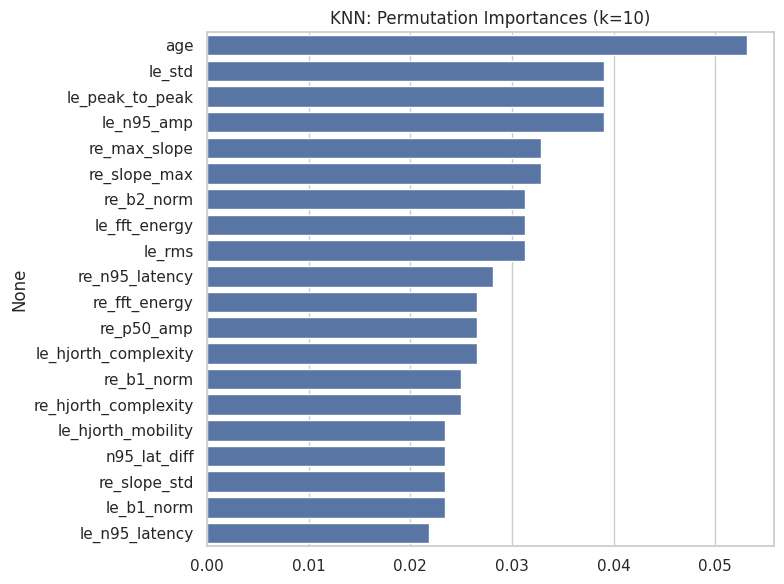


KNN: Training with n_neighbors = 12
Training time: 0.01s
Accuracy: 0.2969 | Weighted F1: 0.3304

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6154    0.4000    0.4848        20
          Retinal Deg     0.6667    0.2400    0.3529        25
          Optic Nerve     0.1667    0.4000    0.2353         5
Inflammatory/Systemic     0.1364    0.4286    0.2069         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2969        64
            macro avg     0.3170    0.2937    0.2560        64
         weighted avg     0.4807    0.2969    0.3304        64


Confusion Matrix:


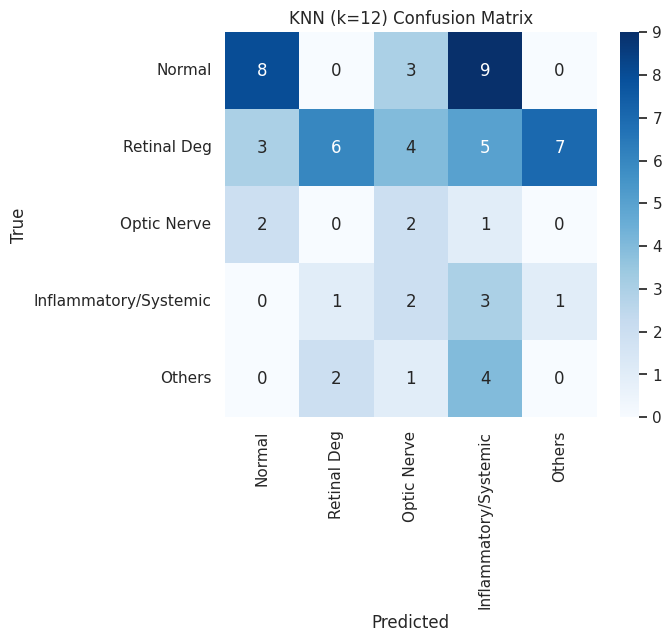


Permutation importance (may take time):
le_std                    0.050000
le_rms                    0.046875
le_n95_amp                0.043750
le_peak_to_peak           0.035937
le_signal_max             0.035937
re_b1_norm                0.035937
le_b2                     0.032813
re_slope_std              0.032813
le_fft_energy             0.032813
le_spectral_power_beta    0.032813
le_b1_norm                0.029687
le_n95_latency            0.029687
re_hf_lf_ratio            0.028125
re_signal_max             0.028125
re_rms                    0.028125
re_b2_norm                0.026562
re_mean_slope             0.026562
re_slope_mean             0.026562
age                       0.026562
re_std                    0.025000


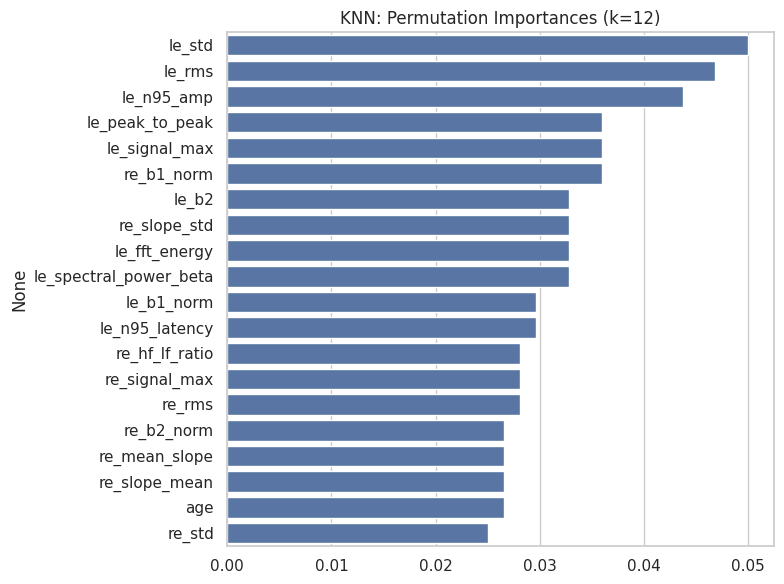


KNN: Training with n_neighbors = 14
Training time: 0.01s
Accuracy: 0.2344 | Weighted F1: 0.2527

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5000    0.3000    0.3750        20
          Retinal Deg     0.5714    0.1600    0.2500        25
          Optic Nerve     0.1538    0.4000    0.2222         5
Inflammatory/Systemic     0.1200    0.4286    0.1875         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2344        64
            macro avg     0.2691    0.2577    0.2069        64
         weighted avg     0.4046    0.2344    0.2527        64


Confusion Matrix:


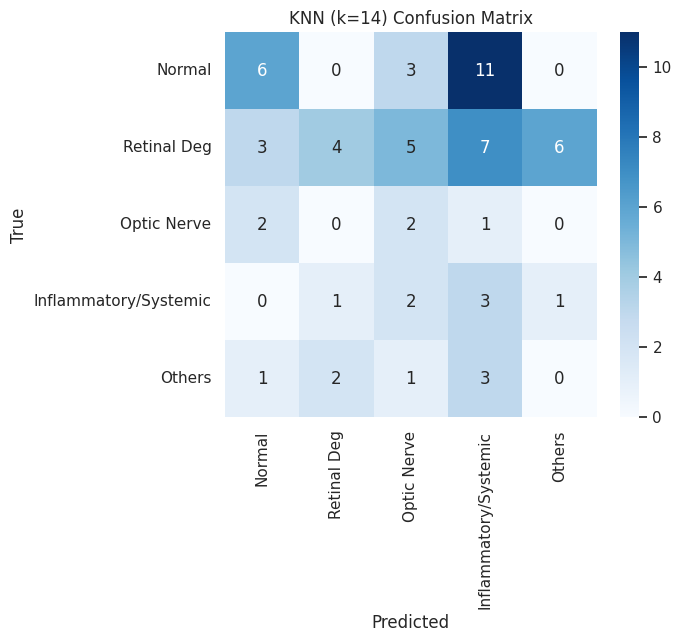


Permutation importance (may take time):
le_hf_lf_ratio             0.015625
le_max_slope               0.014063
le_slope_max               0.014063
le_dominant_frequency      0.006250
re_hf_lf_ratio             0.004687
n95_lat_asym               0.003125
re_dominant_frequency      0.003125
le_spectral_power_theta    0.003125
le_b1                      0.003125
le_hjorth_mobility         0.001563
le_variance                0.000000
le_spectral_power_delta    0.000000
re_spectral_power_delta    0.000000
re_spectral_power_alpha    0.000000
p50_n95_ratio              0.000000
le_spectral_power_alpha    0.000000
le_b3_norm                -0.001563
le_slope_var              -0.001563
le_ratio                  -0.001563
le_n95_amp                -0.001563


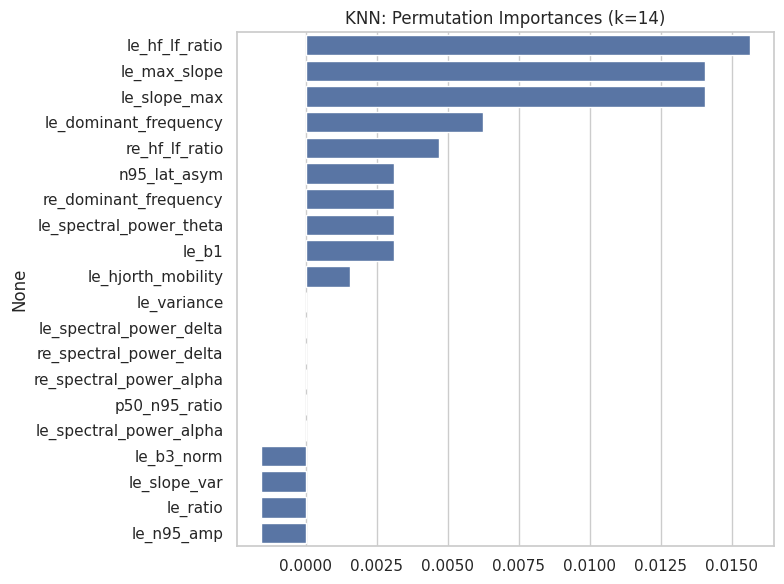


KNN: Training with n_neighbors = 16
Training time: 0.00s
Accuracy: 0.2812 | Weighted F1: 0.3065

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5714    0.4000    0.4706        20
          Retinal Deg     0.7143    0.2000    0.3125        25
          Optic Nerve     0.0833    0.2000    0.1176         5
Inflammatory/Systemic     0.1667    0.5714    0.2581         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2812        64
            macro avg     0.3071    0.2743    0.2318        64
         weighted avg     0.4823    0.2812    0.3065        64


Confusion Matrix:


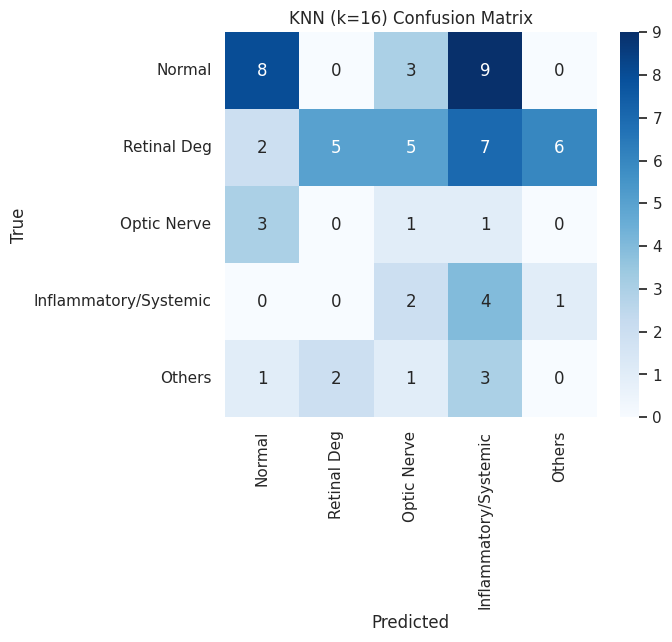


Permutation importance (may take time):
le_slope_std             0.035937
le_max_slope             0.034375
re_max_curvature         0.034375
re_slope_std             0.034375
le_slope_max             0.034375
re_slope_mean            0.032813
re_mean_slope            0.032813
re_max_slope             0.032813
le_zero_crossing_rate    0.032813
re_slope_max             0.032813
age                      0.029687
le_fft_energy            0.029687
le_hjorth_complexity     0.028125
re_n95_latency           0.028125
le_max_curvature         0.028125
p50_n95_diff             0.025000
le_kurtosis              0.025000
re_rise_time             0.025000
re_fall_time             0.025000
re_p50_latency           0.025000


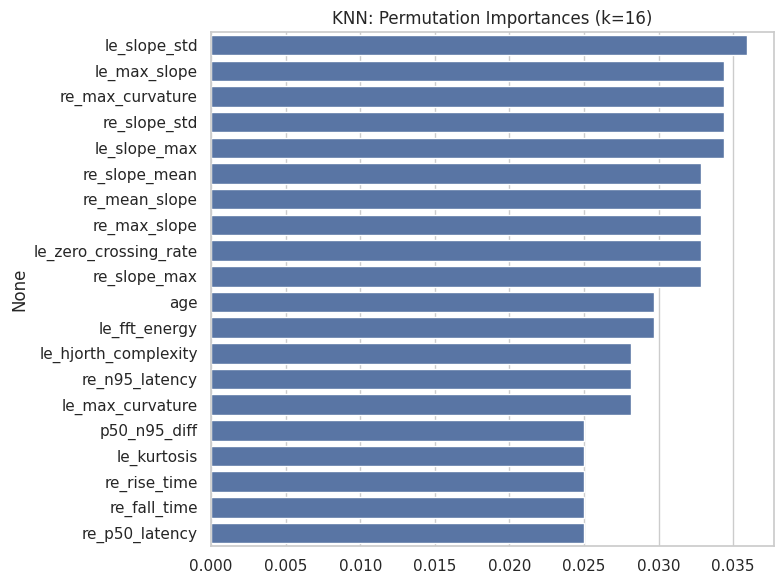


KNN: Training with n_neighbors = 18
Training time: 0.00s
Accuracy: 0.2812 | Weighted F1: 0.3044

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5833    0.3500    0.4375        20
          Retinal Deg     0.7143    0.2000    0.3125        25
          Optic Nerve     0.1429    0.4000    0.2105         5
Inflammatory/Systemic     0.1739    0.5714    0.2667         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2812        64
            macro avg     0.3229    0.3043    0.2454        64
         weighted avg     0.4915    0.2812    0.3044        64


Confusion Matrix:


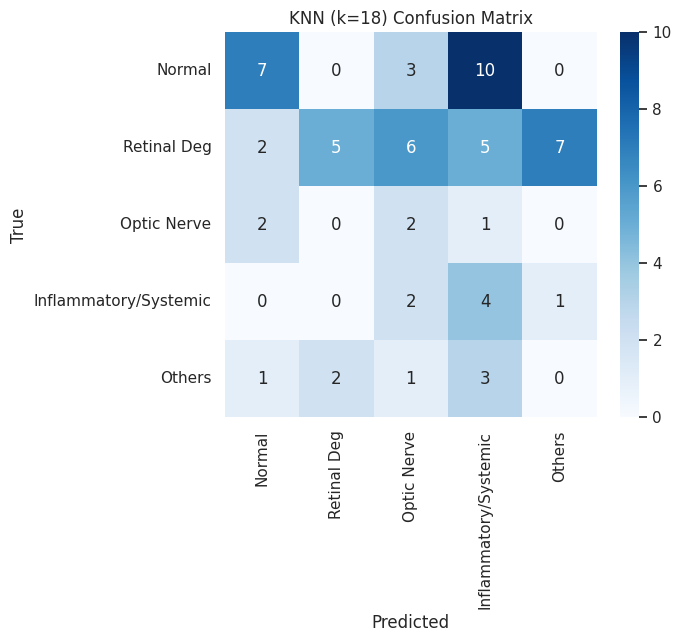


Permutation importance (may take time):
le_n95_latency          0.045312
re_mean_slope           0.035937
re_slope_mean           0.035937
re_signal_max           0.035937
re_slope_std            0.035937
re_fft_energy           0.034375
le_kurtosis             0.032813
le_p50_latency          0.032813
le_fall_time            0.032813
le_rise_time            0.032813
le_max_curvature        0.032813
age                     0.032813
re_energy               0.029687
le_slope_std            0.028125
re_variance             0.028125
le_mean_slope           0.026562
le_slope_mean           0.026562
re_max_curvature        0.025000
le_hjorth_complexity    0.025000
re_std                  0.025000


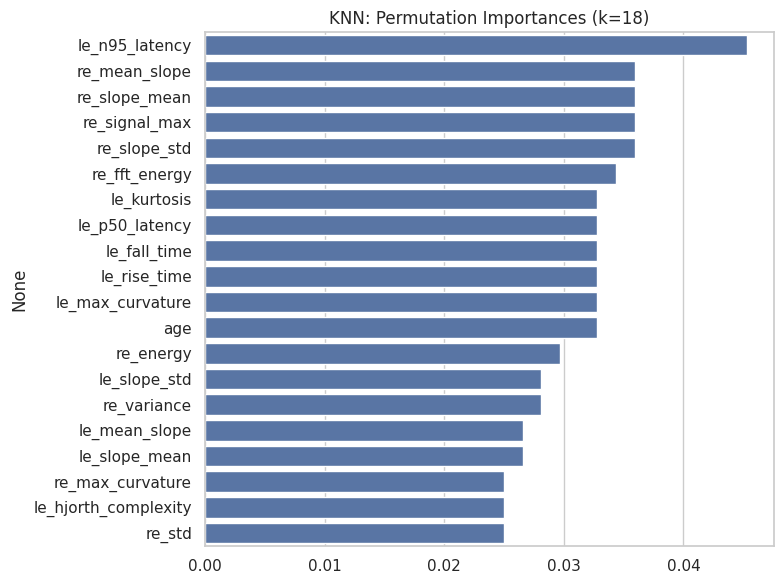


KNN: Training with n_neighbors = 20
Training time: 0.00s
Accuracy: 0.2969 | Weighted F1: 0.3254

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6364    0.3500    0.4516        20
          Retinal Deg     0.7500    0.2400    0.3636        25
          Optic Nerve     0.1429    0.4000    0.2105         5
Inflammatory/Systemic     0.1481    0.5714    0.2353         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2969        64
            macro avg     0.3355    0.3123    0.2522        64
         weighted avg     0.5192    0.2969    0.3254        64


Confusion Matrix:


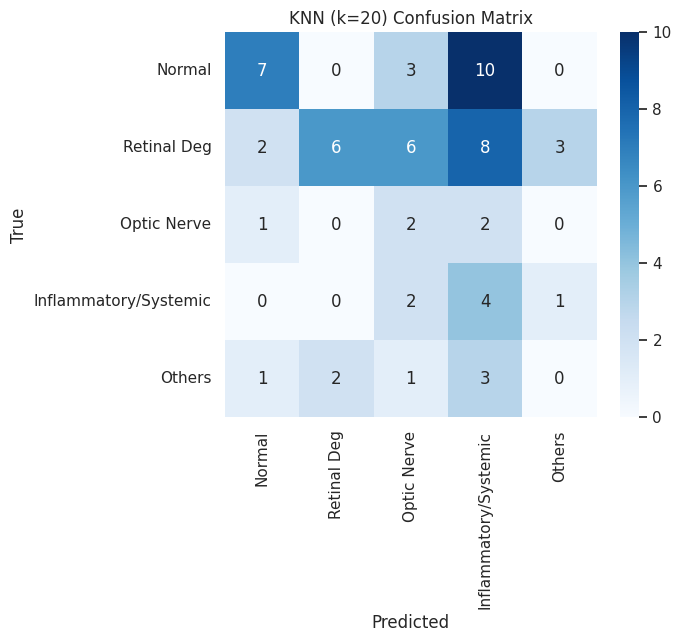


Permutation importance (may take time):
le_n95_latency          0.043750
re_p50_latency          0.034375
re_rise_time            0.034375
re_fall_time            0.034375
re_signal_max           0.031250
re_hjorth_mobility      0.029687
re_mean_slope           0.028125
re_slope_mean           0.028125
le_fall_time            0.026562
le_rise_time            0.026562
le_p50_latency          0.026562
re_slope_std            0.023438
le_kurtosis             0.023438
re_hf_lf_ratio          0.023438
re_fft_energy           0.021875
le_spectral_entropy     0.021875
re_spectral_centroid    0.021875
le_hjorth_complexity    0.021875
le_spectral_centroid    0.018750
re_mean                 0.018750


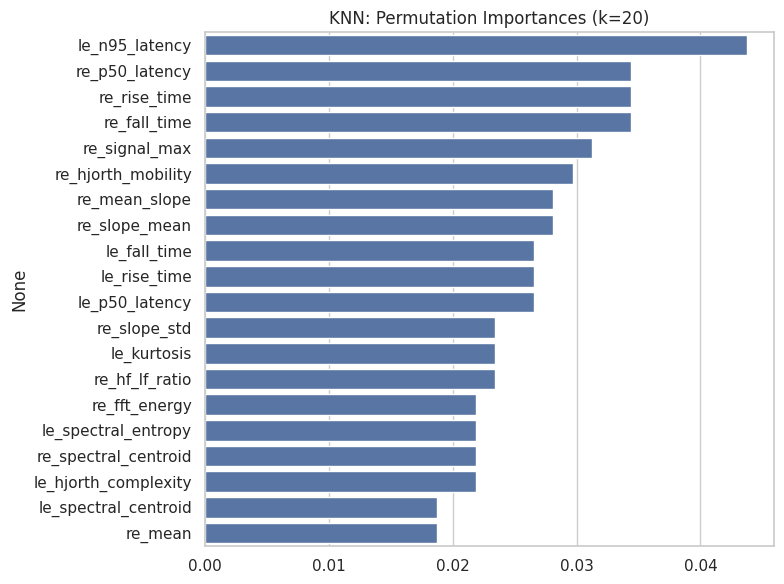


KNN: Training with n_neighbors = 22
Training time: 0.00s
Accuracy: 0.2969 | Weighted F1: 0.3175

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5833    0.3500    0.4375        20
          Retinal Deg     0.6667    0.2400    0.3529        25
          Optic Nerve     0.1429    0.4000    0.2105         5
Inflammatory/Systemic     0.1538    0.5714    0.2424         7
               Others     0.0000    0.0000    0.0000         7

             accuracy                         0.2969        64
            macro avg     0.3093    0.3123    0.2487        64
         weighted avg     0.4707    0.2969    0.3175        64


Confusion Matrix:


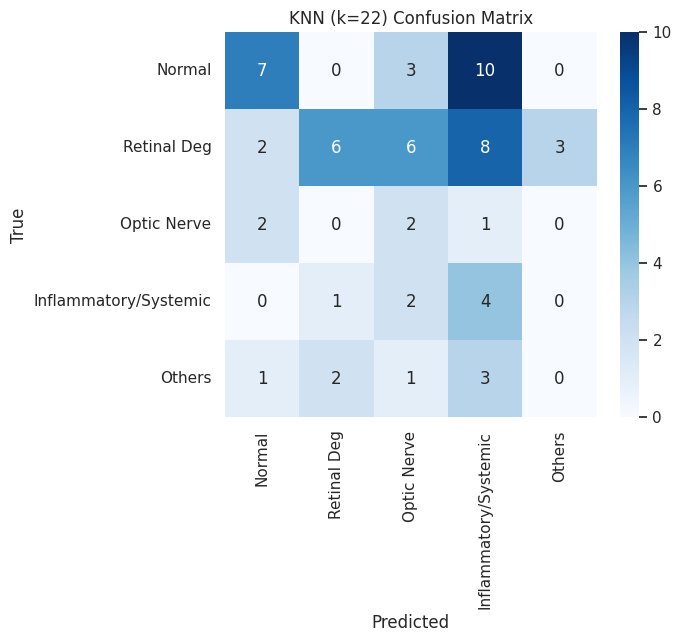


Permutation importance (may take time):
re_rise_time               0.032813
re_p50_latency             0.032813
re_fall_time               0.032813
le_n95_latency             0.031250
re_fft_energy              0.020313
re_std                     0.017188
age                        0.017188
re_rms                     0.015625
re_spectral_centroid       0.014063
le_hf_lf_ratio             0.014063
le_n95_amp                 0.012500
re_n95_amp                 0.010937
re_spectral_power_theta    0.009375
re_waveform_asymmetry      0.009375
re_b1                      0.009375
re_variance                0.007812
le_fall_time               0.006250
le_rise_time               0.006250
re_peak_to_peak            0.006250
le_p50_latency             0.006250


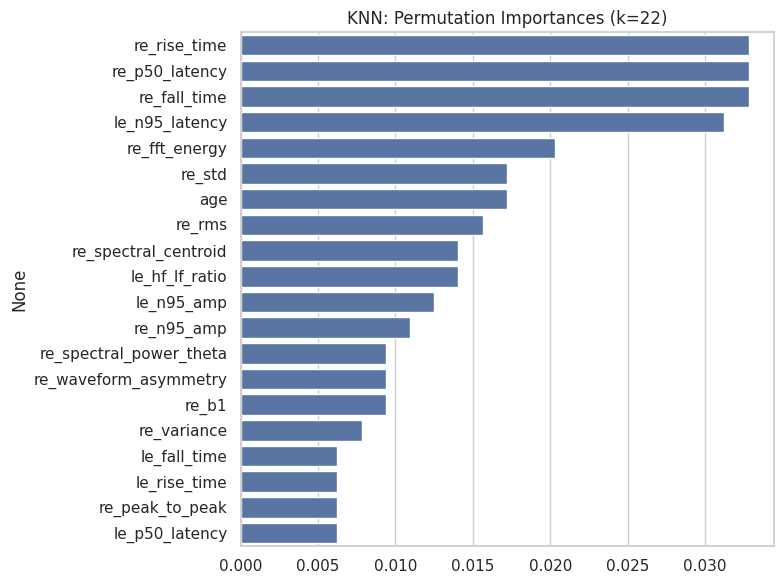

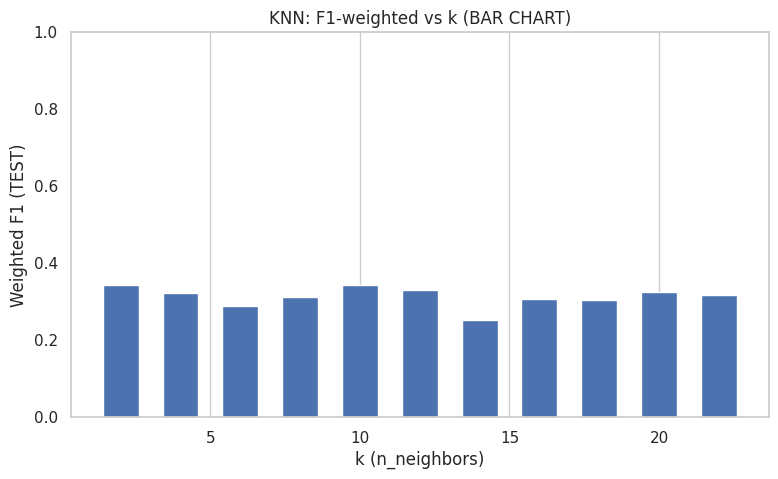


BEST KNN k = 10 with Weighted F1 (TEST) = 0.3421176781400966


In [ ]:
# SNIPPET 8: KNN loop over k values (2 .. floor(sqrt(n_samples)) step 2)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.inspection import permutation_importance
import pandas as pd
import time
import numpy as np

_n_samples = X_train_res.shape[0]
max_k = max(2, int(np.floor(np.sqrt(_n_samples))))
knn_ks = list(range(2, max_k+1, 2)) if max_k >= 2 else [2]

results = []
best_f1 = -1
best_k = None
best_model = None

for k in knn_ks:
    print("\n" + "="*60)
    print(f"KNN: Training with n_neighbors = {k}")
    print("="*60)
    model = KNeighborsClassifier(n_neighbors=int(k), n_jobs=-1)
    t0 = time.time()
    model.fit(X_train_scaled, y_train_res)
    t1 = time.time()
    print(f"Training time: {t1-t0:.2f}s")

    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    f1w = f1_score(y_test, y_pred, average='weighted')
    print(f"Accuracy: {acc:.4f} | Weighted F1: {f1w:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=CLASS_NAMES_5, digits=4))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=CLASS_NAMES_5, yticklabels=CLASS_NAMES_5, cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"KNN (k={k}) Confusion Matrix")
    plt.show()

    # Permutation importance (model-agnostic)
    try:
        print("\nPermutation importance (may take time):")
        r = permutation_importance(model, X_test_scaled, y_test, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
        imp = pd.Series(r.importances_mean, index=X_cols_final).sort_values(ascending=False).head(20)
        print(imp.to_string())
        plt.figure(figsize=(8,6))
        sns.barplot(x=imp.values, y=imp.index)
        plt.title(f"KNN: Permutation Importances (k={k})")
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print("Could not compute permutation importance:", e)

    results.append({'k': k, 'acc': acc, 'f1w': f1w})
    if f1w > best_f1:
        best_f1 = f1w
        best_k = k
        best_model = model


# --------------------------------------
# BAR CHART: F1 vs k
# --------------------------------------
ks = [r['k'] for r in results]
f1s = [r['f1w'] for r in results]

plt.figure(figsize=(9, 5))
plt.bar(ks, f1s, width=1.2)
plt.xlabel("k (n_neighbors)")
plt.ylabel("Weighted F1 (TEST)")
plt.title("KNN: F1-weighted vs k (BAR CHART)")
plt.ylim(0, 1)
plt.grid(axis='y')
plt.show()

print("\nBEST KNN k =", best_k, "with Weighted F1 (TEST) =", best_f1)

# End of SNIPPET 8


LogisticRegression: Training with C = 0.01
Training time: 0.38s
Accuracy: 0.3906 | Weighted F1 (TEST): 0.4046

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5625    0.4500    0.5000        20
          Retinal Deg     0.5625    0.3600    0.4390        25
          Optic Nerve     0.1818    0.4000    0.2500         5
Inflammatory/Systemic     0.2857    0.5714    0.3810         7
               Others     0.1429    0.1429    0.1429         7

             accuracy                         0.3906        64
            macro avg     0.3471    0.3849    0.3426        64
         weighted avg     0.4566    0.3906    0.4046        64


Confusion Matrix:


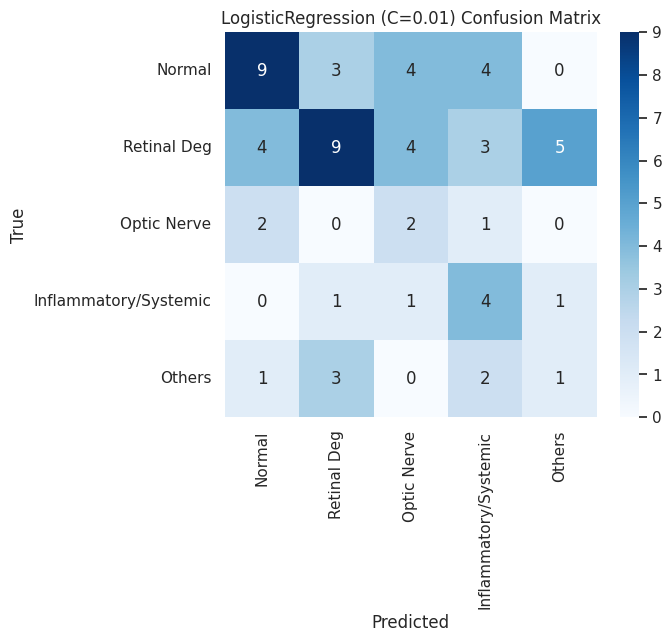


Permutation importance (reduced repeats for speed):
sex                        0.006250
re_rms                     0.003125
re_slope_mean              0.003125
le_waveform_asymmetry      0.003125
re_mean_slope              0.003125
re_waveform_asymmetry      0.003125
re_spectral_power_alpha    0.000000
re_spectral_power_delta    0.000000
le_spectral_power_alpha    0.000000
re_zero_crossing_rate      0.000000
p50_n95_ratio              0.000000
le_signal_max              0.000000
le_spectral_power_delta    0.000000
re_slope_std               0.000000
re_b3_norm                -0.003125
le_b3_norm                -0.003125
p50_asymmetry             -0.003125
le_dominant_frequency     -0.003125
le_std                    -0.003125
le_rms                    -0.003125


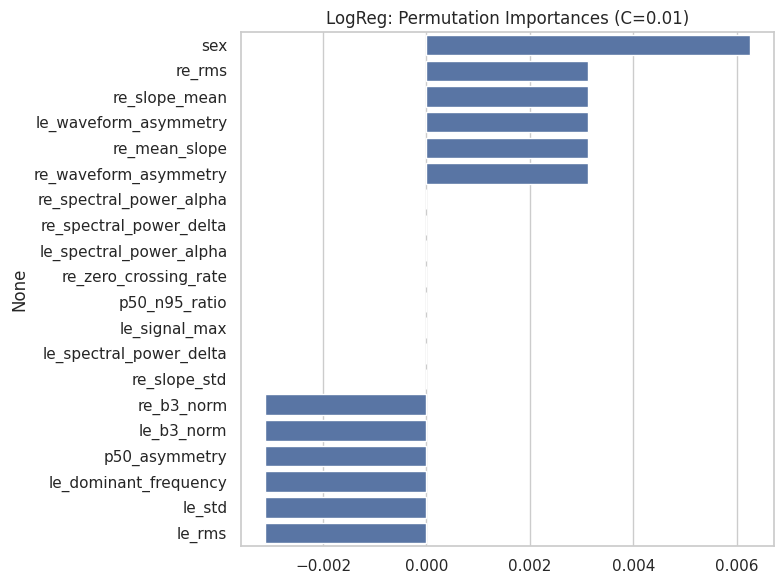


LogisticRegression: Training with C = 0.1
Training time: 1.25s
Accuracy: 0.4062 | Weighted F1 (TEST): 0.4313

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5882    0.5000    0.5405        20
          Retinal Deg     0.6250    0.4000    0.4878        25
          Optic Nerve     0.1250    0.2000    0.1538         5
Inflammatory/Systemic     0.1875    0.4286    0.2609         7
               Others     0.2857    0.2857    0.2857         7

             accuracy                         0.4062        64
            macro avg     0.3623    0.3629    0.3458        64
         weighted avg     0.4895    0.4062    0.4313        64


Confusion Matrix:


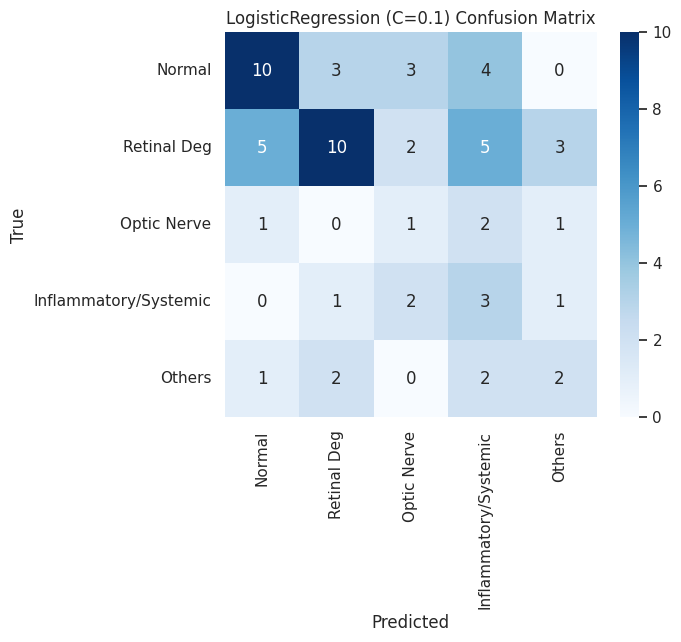


Permutation importance (reduced repeats for speed):
re_waveform_asymmetry      0.053125
le_hjorth_mobility         0.037500
re_signal_quality_index    0.037500
sex                        0.037500
re_hf_lf_ratio             0.034375
p50_lat_asym               0.034375
le_fft_energy              0.031250
re_b3_norm                 0.028125
le_zero_crossing_rate      0.025000
re_signal_min              0.025000
le_b3                      0.021875
le_fall_time               0.021875
le_p50_latency             0.021875
le_rise_time               0.021875
le_n95_latency             0.021875
le_spectral_power_gamma    0.021875
p50_lat_diff               0.021875
le_dominant_frequency      0.021875
le_hjorth_complexity       0.021875
re_p50_latency             0.018750


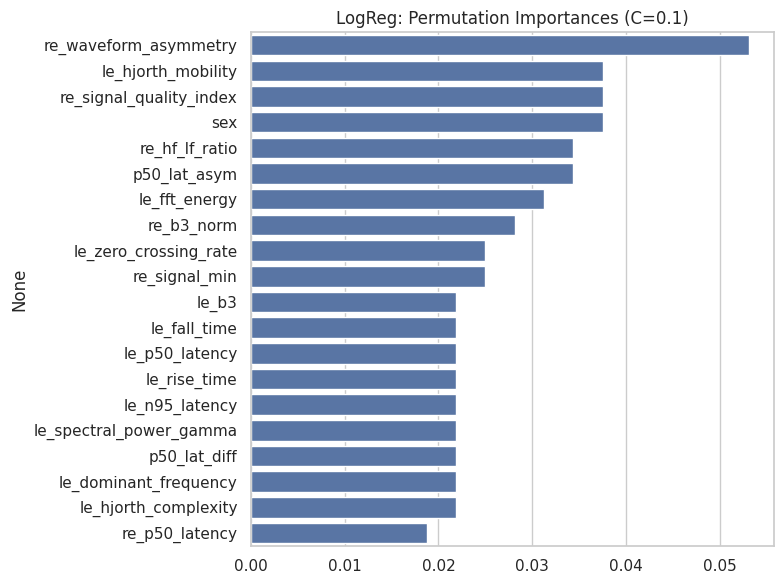


LogisticRegression: Training with C = 1
Training time: 9.20s
Accuracy: 0.3594 | Weighted F1 (TEST): 0.3775

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5294    0.4500    0.4865        20
          Retinal Deg     0.5333    0.3200    0.4000        25
          Optic Nerve     0.1250    0.2000    0.1538         5
Inflammatory/Systemic     0.2000    0.4286    0.2727         7
               Others     0.2222    0.2857    0.2500         7

             accuracy                         0.3594        64
            macro avg     0.3220    0.3369    0.3126        64
         weighted avg     0.4297    0.3594    0.3775        64


Confusion Matrix:


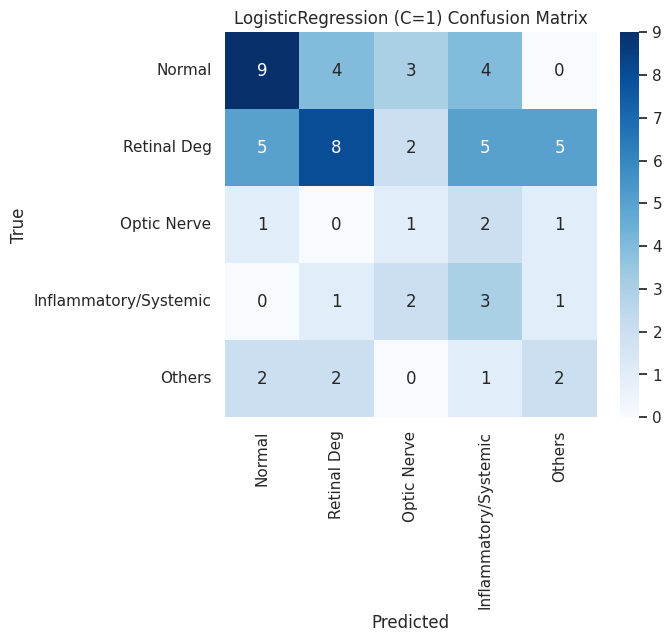


Permutation importance (reduced repeats for speed):
sex                        0.062500
le_hjorth_mobility         0.056250
le_b2_norm                 0.037500
le_hjorth_complexity       0.037500
re_signal_quality_index    0.034375
le_auc                     0.031250
re_fft_energy              0.031250
re_kurtosis                0.028125
re_p50_latency             0.025000
le_kurtosis                0.025000
re_spectral_centroid       0.025000
re_p50_amp                 0.025000
re_fall_time               0.025000
le_signal_max              0.025000
re_rise_time               0.025000
re_waveform_asymmetry      0.021875
le_signal_min              0.018750
re_spectral_entropy        0.018750
n95_asymmetry              0.018750
re_mean_curvature          0.015625


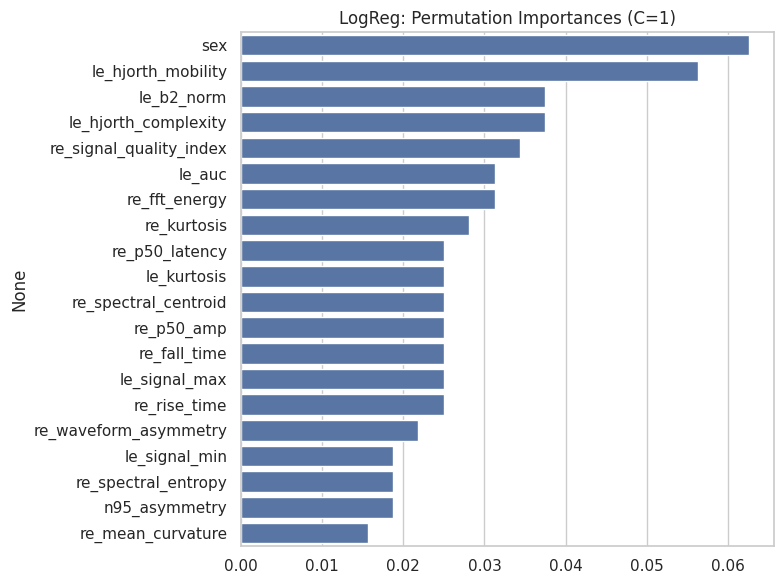


LogisticRegression: Training with C = 10
Training time: 12.17s
Accuracy: 0.3594 | Weighted F1 (TEST): 0.3807

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5714    0.4000    0.4706        20
          Retinal Deg     0.5000    0.3600    0.4186        25
          Optic Nerve     0.1111    0.2000    0.1429         5
Inflammatory/Systemic     0.2000    0.4286    0.2727         7
               Others     0.2500    0.2857    0.2667         7

             accuracy                         0.3594        64
            macro avg     0.3265    0.3349    0.3143        64
         weighted avg     0.4318    0.3594    0.3807        64


Confusion Matrix:


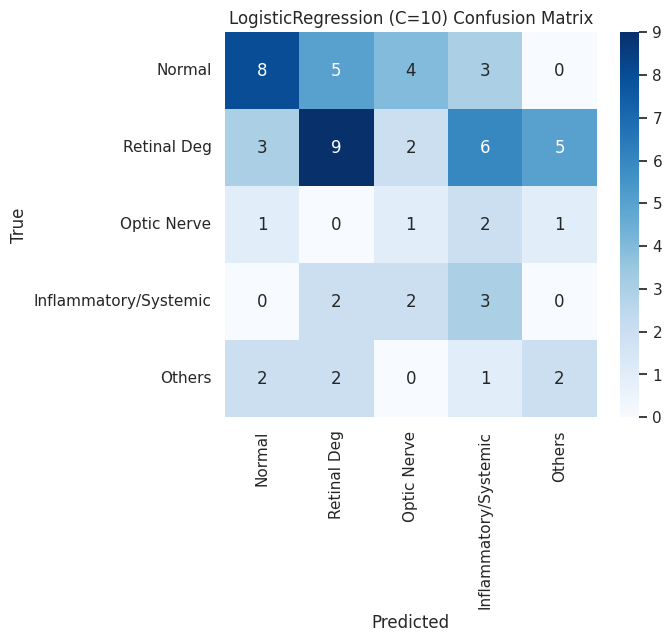


Permutation importance (reduced repeats for speed):
le_hjorth_mobility         0.068750
le_hjorth_complexity       0.059375
re_signal_quality_index    0.056250
re_fft_energy              0.053125
re_spectral_centroid       0.046875
le_signal_min              0.040625
le_spectral_centroid       0.040625
p50_lat_asym               0.040625
le_signal_max              0.037500
le_fft_energy              0.037500
re_waveform_asymmetry      0.034375
sex                        0.034375
le_kurtosis                0.028125
le_b2_norm                 0.028125
re_hf_lf_ratio             0.028125
re_spectral_entropy        0.028125
le_auc                     0.025000
le_slope_max               0.021875
le_b1_norm                 0.021875
n95_lat_asym               0.021875


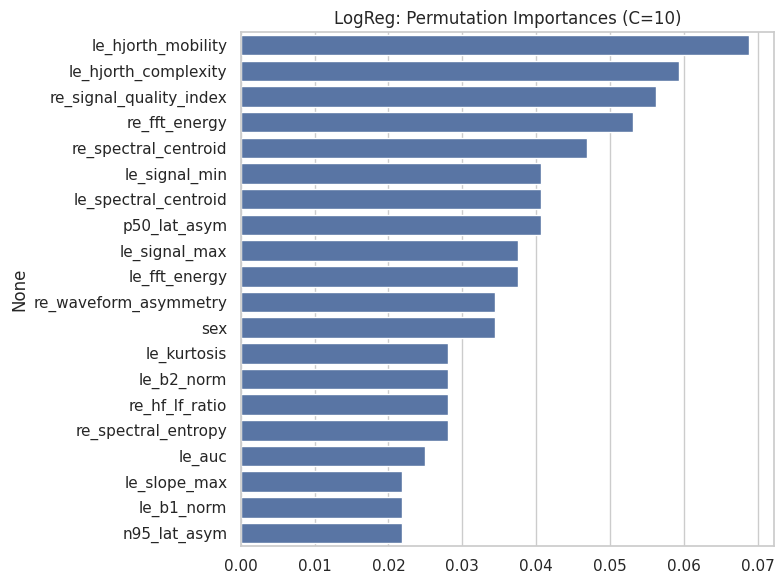


LogisticRegression: Training with C = 100
Training time: 5.16s
Accuracy: 0.3594 | Weighted F1 (TEST): 0.3804

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5333    0.4000    0.4571        20
          Retinal Deg     0.5294    0.3600    0.4286        25
          Optic Nerve     0.1111    0.2000    0.1429         5
Inflammatory/Systemic     0.2000    0.4286    0.2727         7
               Others     0.2500    0.2857    0.2667         7

             accuracy                         0.3594        64
            macro avg     0.3248    0.3349    0.3136        64
         weighted avg     0.4314    0.3594    0.3804        64


Confusion Matrix:


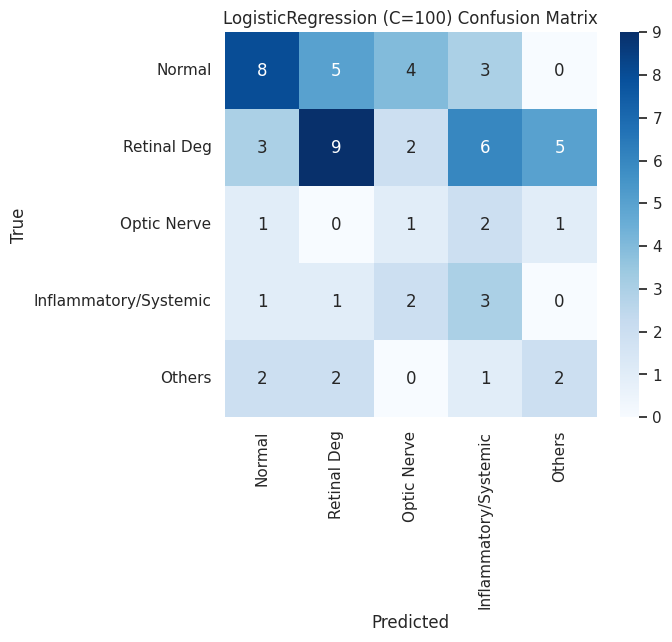


Permutation importance (reduced repeats for speed):
le_hjorth_mobility         0.065625
le_hjorth_complexity       0.059375
re_signal_quality_index    0.059375
re_fft_energy              0.056250
re_spectral_centroid       0.043750
le_spectral_centroid       0.043750
le_signal_min              0.040625
p50_lat_asym               0.040625
le_signal_max              0.037500
le_fft_energy              0.034375
re_waveform_asymmetry      0.034375
sex                        0.034375
le_kurtosis                0.028125
le_b2_norm                 0.028125
re_spectral_entropy        0.021875
re_signal_min              0.021875
re_hf_lf_ratio             0.021875
le_auc                     0.021875
le_slope_max               0.018750
le_mean_curvature          0.018750


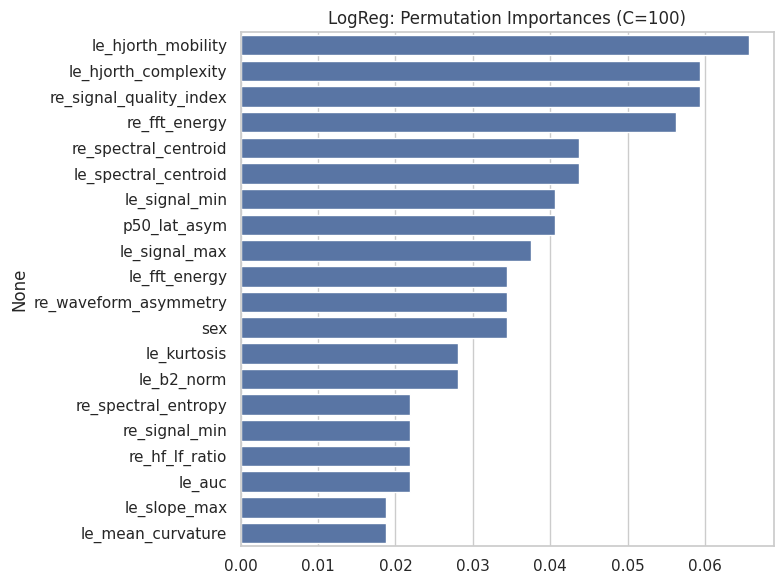

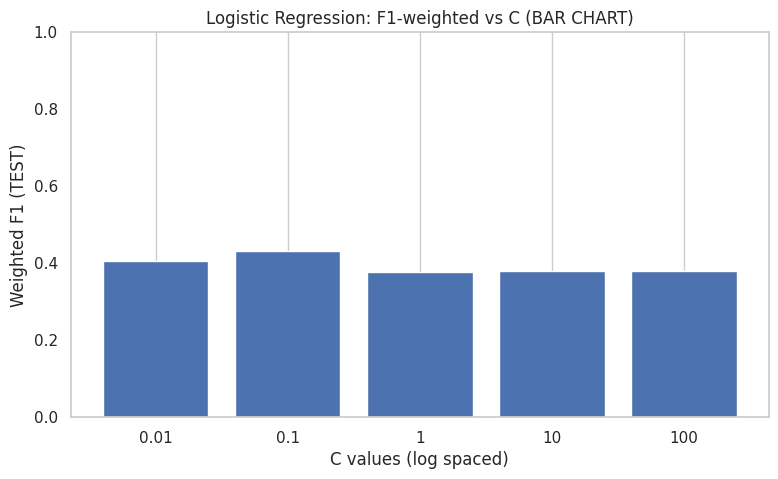


BEST LogisticRegression C = 0.1 with Weighted F1 (TEST) = 0.43126953887160674


In [ ]:
# SNIPPET 9: Logistic Regression loop over C values (UPDATED with BAR CHART + stable solver)
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.inspection import permutation_importance
import pandas as pd
import time

logreg_C = [0.01, 0.1, 1, 10, 100]
results = []
best_f1 = -1
best_C = None
best_model = None

for Cval in logreg_C:
    print("\n" + "="*60)
    print(f"LogisticRegression: Training with C = {Cval}")
    print("="*60)

    # STABILITY IMPROVEMENTS (logic unchanged)
    model = LogisticRegression(
        C=float(Cval),
        penalty='l2',
        solver='saga',            # stable for high dimensional data
        multi_class='multinomial', # better for 5-class PERG
        max_iter=3000,
        class_weight='balanced',
        random_state=RANDOM_STATE
    )

    # Train
    t0 = time.time()
    model.fit(X_train_scaled, y_train_res)
    t1 = time.time()
    print(f"Training time: {t1 - t0:.2f}s")

    # TEST prediction → Weighted F1 is for TEST data
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    f1w = f1_score(y_test, y_pred, average='weighted')

    print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST): {f1w:.4f}")

    print("\nClassification Report:")
    print(classification_report(
        y_test, y_pred,
        target_names=CLASS_NAMES_5,
        digits=4
    ))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=CLASS_NAMES_5,
                yticklabels=CLASS_NAMES_5,
                cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"LogisticRegression (C={Cval}) Confusion Matrix")
    plt.show()

    # Permutation importance (reduced repeats for speed)
    try:
        print("\nPermutation importance (reduced repeats for speed):")
        r = permutation_importance(
            model,
            X_test_scaled,
            y_test,
            n_repeats=5,   # faster
            random_state=RANDOM_STATE,
            n_jobs=-1
        )
        imp = pd.Series(r.importances_mean, index=X_cols_final) \
                .sort_values(ascending=False).head(20)

        print(imp.to_string())

        plt.figure(figsize=(8, 6))
        sns.barplot(x=imp.values, y=imp.index)
        plt.title(f"LogReg: Permutation Importances (C={Cval})")
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print("Could not compute permutation importance:", e)

    # Save results
    results.append({'C': Cval, 'acc': acc, 'f1w': f1w})

    if f1w > best_f1:
        best_f1 = f1w
        best_C = Cval
        best_model = model


# ---------------------------------------------------
# BAR CHART : Weighted F1 vs C (log x-axis)
# ---------------------------------------------------
Cs = [r['C'] for r in results]
f1s = [r['f1w'] for r in results]

plt.figure(figsize=(9, 5))
plt.bar(range(len(Cs)), f1s, tick_label=[str(c) for c in Cs])
plt.xlabel("C values (log spaced)")
plt.ylabel("Weighted F1 (TEST)")
plt.title("Logistic Regression: F1-weighted vs C (BAR CHART)")
plt.ylim(0, 1)
plt.grid(axis='y')
plt.show()

print("\nBEST LogisticRegression C =", best_C, "with Weighted F1 (TEST) =", best_f1)

# End of SNIPPET 9



ANN (MLPClassifier): Training with hidden_layer_sizes = (50, 50)
Training time: 0.80s
Accuracy: 0.4375 | Weighted F1 (TEST): 0.4474

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5625    0.4500    0.5000        20
          Retinal Deg     0.5909    0.5200    0.5532        25
          Optic Nerve     0.2222    0.4000    0.2857         5
Inflammatory/Systemic     0.2500    0.4286    0.3158         7
               Others     0.2000    0.1429    0.1667         7

             accuracy                         0.4375        64
            macro avg     0.3651    0.3883    0.3643        64
         weighted avg     0.4732    0.4375    0.4474        64


Confusion Matrix:


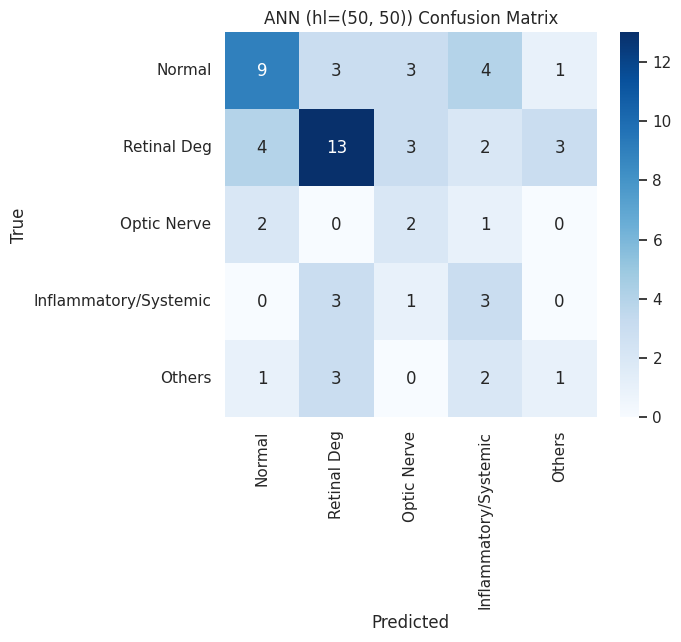


Permutation importance (reduced repeats for speed):
re_rise_time               0.018750
re_waveform_asymmetry      0.015625
re_b1_norm                 0.012500
le_max_slope               0.012500
n95_lat_asym               0.012500
sex                        0.012500
le_b2_norm                 0.012500
le_rms                     0.012500
le_energy                  0.009375
re_mean                    0.009375
le_b2                      0.009375
le_spectral_power_gamma    0.009375
le_kurtosis                0.009375
re_n95_latency             0.006250
p50_asymmetry              0.006250
le_hf_lf_ratio             0.003125
le_spectral_power_theta    0.003125
re_signal_max              0.003125
re_fall_time               0.003125
re_p50_amp                 0.000000


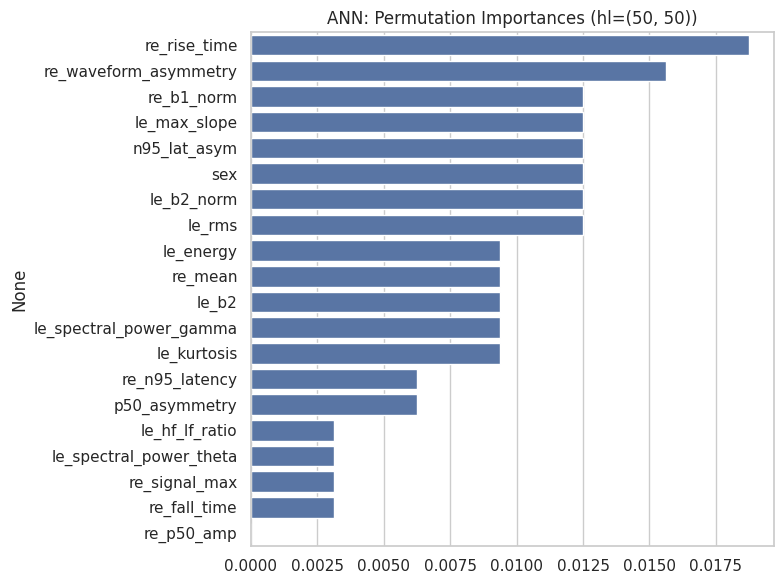


ANN (MLPClassifier): Training with hidden_layer_sizes = (100, 100)
Training time: 1.00s
Accuracy: 0.4688 | Weighted F1 (TEST): 0.4651

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.6316    0.6000    0.6154        20
          Retinal Deg     0.4815    0.5200    0.5000        25
          Optic Nerve     0.2500    0.4000    0.3077         5
Inflammatory/Systemic     0.2500    0.2857    0.2667         7
               Others     0.5000    0.1429    0.2222         7

             accuracy                         0.4688        64
            macro avg     0.4226    0.3897    0.3824        64
         weighted avg     0.4870    0.4688    0.4651        64


Confusion Matrix:


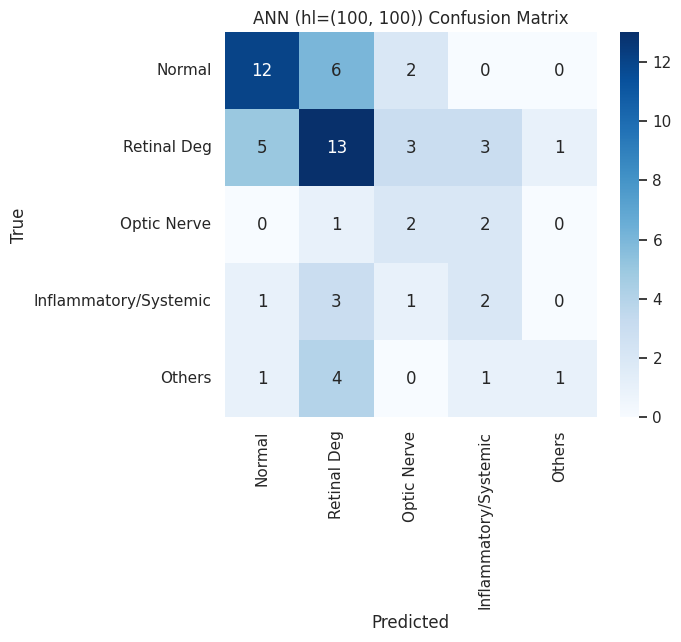


Permutation importance (reduced repeats for speed):
re_p50_latency             0.062500
le_slope_mean              0.062500
le_zero_crossing_rate      0.059375
re_kurtosis                0.059375
age                        0.059375
le_n95_latency             0.053125
re_signal_quality_index    0.053125
le_waveform_asymmetry      0.053125
p50_lat_diff               0.053125
re_skewness                0.050000
sex                        0.050000
n95_lat_diff               0.050000
re_n95_latency             0.050000
re_signal_max              0.046875
re_fall_time               0.046875
re_mean                    0.046875
le_max_slope               0.043750
re_b3_norm                 0.043750
le_slope_max               0.043750
le_mean_curvature          0.043750


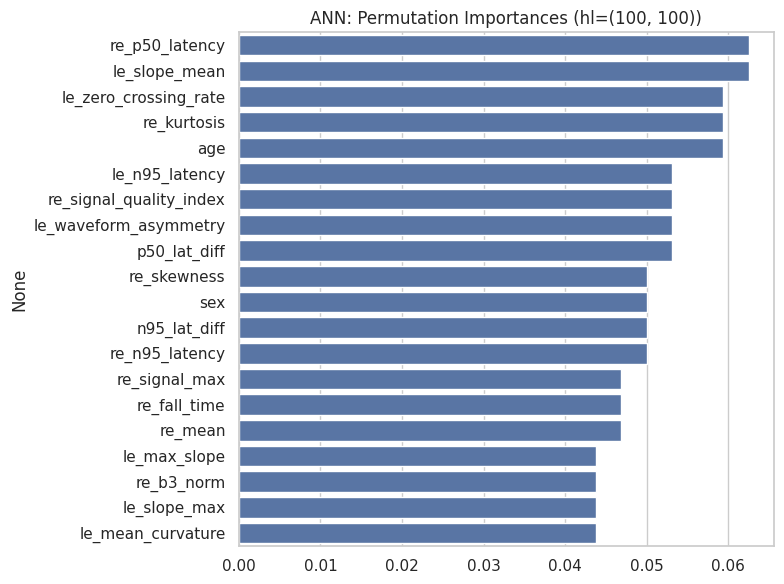


ANN (MLPClassifier): Training with hidden_layer_sizes = (150, 150)
Training time: 1.03s
Accuracy: 0.4375 | Weighted F1 (TEST): 0.4529

Classification Report:
                       precision    recall  f1-score   support

               Normal     0.5882    0.5000    0.5405        20
          Retinal Deg     0.5714    0.4800    0.5217        25
          Optic Nerve     0.2000    0.4000    0.2667         5
Inflammatory/Systemic     0.2000    0.2857    0.2353         7
               Others     0.3333    0.2857    0.3077         7

             accuracy                         0.4375        64
            macro avg     0.3786    0.3903    0.3744        64
         weighted avg     0.4810    0.4375    0.4529        64


Confusion Matrix:


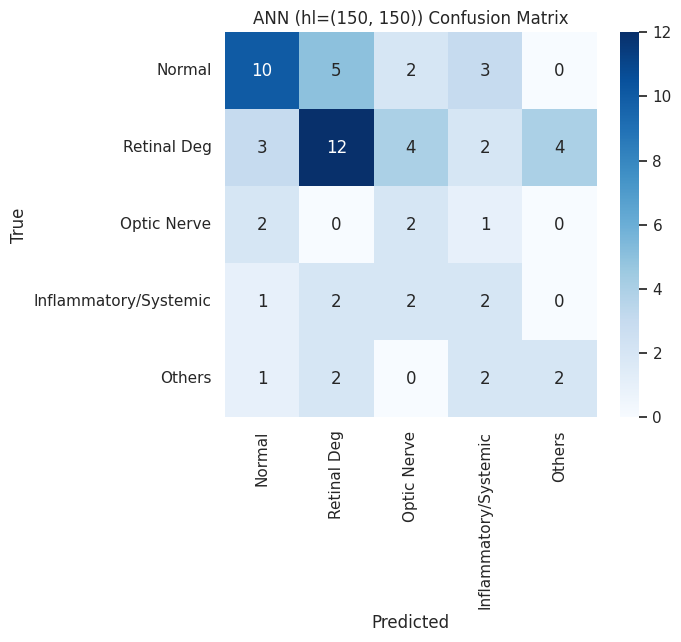


Permutation importance (reduced repeats for speed):
le_n95_amp               0.034375
le_slope_std             0.028125
re_hf_lf_ratio           0.028125
le_waveform_asymmetry    0.021875
p50_n95_diff             0.021875
re_n95_latency           0.021875
le_slope_max             0.018750
sex                      0.018750
re_waveform_asymmetry    0.018750
re_kurtosis              0.012500
re_b1_norm               0.012500
re_p50_latency           0.012500
age                      0.012500
le_hf_lf_ratio           0.012500
re_max_slope             0.009375
re_mean_slope            0.009375
re_slope_mean            0.009375
le_mean_curvature        0.009375
re_fft_energy            0.009375
le_n95_latency           0.009375


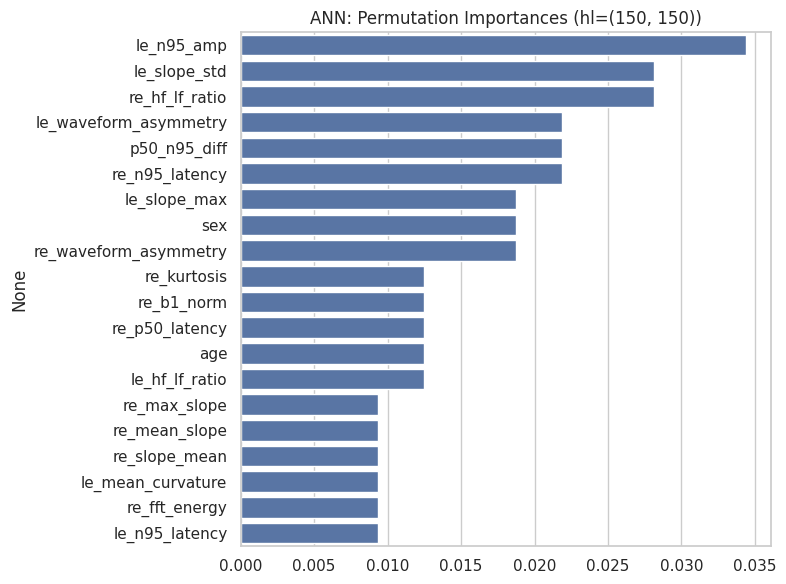

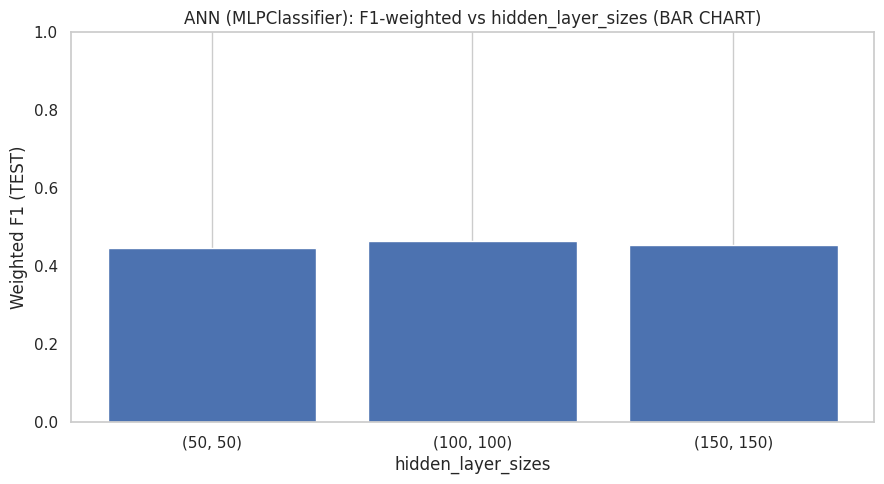


BEST ANN hidden_layer_sizes = (100, 100) with Weighted F1 (TEST) = 0.4651308760683761


In [ ]:
# SNIPPET 10: ANN (MLPClassifier) loop over hidden layer sizes (UPDATED)

from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.inspection import permutation_importance
import pandas as pd
import time

# Different ANN architectures to test
ann_hidden = [(50,50), (100,100), (150,150)]

results = []
best_f1 = -1
best_h = None
best_model = None

for hl in ann_hidden:
    print("\n" + "="*60)
    print(f"ANN (MLPClassifier): Training with hidden_layer_sizes = {hl}")
    print("="*60)

    # Stability improvements (NO logic change)
    model = MLPClassifier(
        hidden_layer_sizes=hl,
        max_iter=1500,                # ensures convergence
        alpha=0.0001,                 # L2 regularization
        learning_rate_init=0.001,     # stable learning rate
        early_stopping=True,          # prevents overfitting
        random_state=RANDOM_STATE
    )

    # Train
    t0 = time.time()
    model.fit(X_train_scaled, y_train_res)
    t1 = time.time()
    print(f"Training time: {t1 - t0:.2f}s")

    # TEST SET RESULTS
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    f1w = f1_score(y_test, y_pred, average='weighted')

    print(f"Accuracy: {acc:.4f} | Weighted F1 (TEST): {f1w:.4f}")

    print("\nClassification Report:")
    print(classification_report(
        y_test, y_pred,
        target_names=CLASS_NAMES_5,
        digits=4
    ))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        xticklabels=CLASS_NAMES_5,
        yticklabels=CLASS_NAMES_5,
        cmap='Blues'
    )
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"ANN (hl={hl}) Confusion Matrix")
    plt.show()

    # Permutation importance (reduced repeats)
    try:
        print("\nPermutation importance (reduced repeats for speed):")
        r = permutation_importance(
            model,
            X_test_scaled,
            y_test,
            n_repeats=5,
            random_state=RANDOM_STATE,
            n_jobs=-1
        )
        imp = pd.Series(r.importances_mean, index=X_cols_final) \
                .sort_values(ascending=False).head(20)

        print(imp.to_string())

        plt.figure(figsize=(8,6))
        sns.barplot(x=imp.values, y=imp.index)
        plt.title(f"ANN: Permutation Importances (hl={hl})")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print("Could not compute permutation importance:", e)

    # Store results
    results.append({'hidden': hl, 'acc': acc, 'f1w': f1w})

    if f1w > best_f1:
        best_f1 = f1w
        best_h = hl
        best_model = model


# -------------------------------------------------
# BAR CHART: F1 vs hidden layer architecture
# -------------------------------------------------
labels = [str(r['hidden']) for r in results]
f1s = [r['f1w'] for r in results]

plt.figure(figsize=(9,5))
plt.bar(labels, f1s)
plt.xlabel("hidden_layer_sizes")
plt.ylabel("Weighted F1 (TEST)")
plt.title("ANN (MLPClassifier): F1-weighted vs hidden_layer_sizes (BAR CHART)")
plt.ylim(0, 1)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

print("\nBEST ANN hidden_layer_sizes =", best_h, "with Weighted F1 (TEST) =", best_f1)

# End of SNIPPET 10


In [ ]:
from sklearn.ensemble import VotingClassifier
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, classification_report

# 1. Take the best versions of your existing models
clf1 = CatBoostClassifier(depth=6, iterations=300, verbose=0, random_state=42)
clf2 = xgb.XGBClassifier(n_estimators=200, max_depth=4, learning_rate=0.05, random_state=42)
clf3 = RandomForestClassifier(n_estimators=500, class_weight="balanced", random_state=42)

# 2. Create the Ensemble
ensemble_model = VotingClassifier(
    estimators=[('cat', clf1), ('xgb', clf2), ('rf', clf3)],
    voting='soft' # 'soft' uses probabilities for better F1
)

# 3. Train and Evaluate
ensemble_model.fit(X_train_scaled, y_train_res)
y_pred_ens = ensemble_model.predict(X_test_scaled)

print("Ensemble Weighted F1 Score:", f1_score(y_test, y_pred_ens, average='weighted'))
print(classification_report(y_test, y_pred_ens, target_names=CLASS_NAMES_5))

ModuleNotFoundError: No module named 'catboost'